# 1. Project Introduction

# Do machine learning and deep learning models beat a naive baseline? A comparative study of next-day price prediction for five Indian stocks 

## Project Overview

This project investigates the performance of machine learning and deep learning models for short-term prediction of Indian stock prices.

Five stocks representing different sectors are analysed:

- Reliance Industries — Energy
- Infosys — Information Technology
- HDFC Bank — Banking
- Tata Motors — Automobile
- Sun Pharma — Healthcare

Historical OHLCV (Open, High, Low, Close, Volume) data is used as the primary input for prediction.

The target variable is the **next trading day's closing price**.

The study compares the performance of:

- Linear Regression
- Random Forest
- XGBoost
- LSTM
- Bidirectional LSTM (BiLSTM)

A naive persistence baseline is also included, where the current day's closing price is used as the prediction for the next trading day's closing price.

Model performance is evaluated using MAE, MSE, RMSE, MAPE, and R².

## Research Questions

1. Do machine learning and deep learning models produce a genuine improvement over a naive persistence baseline when predicting next-day closing prices of Indian equities? 

2. Which learned model performs best, and is that ranking consistent across the five stocks? 

## 2. Import Libraries

The following Python libraries are used for data manipulation, visualisation, preprocessing, model development, and evaluation.

In [1]:
# Data manipulation
import numpy as np
import pandas as pd

# Visualisation
import matplotlib.pyplot as plt

# Preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Machine Learning models
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

# Deep Learning
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Bidirectional, Dense, Dropout

# Evaluation metrics
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    mean_absolute_percentage_error,
    r2_score
)

# Reproducibility
import random
import tensorflow as tf

np.random.seed(16)
random.seed(16)
tf.random.set_seed(16)

print("Libraries imported successfully.")

Libraries imported successfully.


## 3. Load the Datasets

Historical stock price data for the selected stocks is loaded for further preprocessing, exploratory data analysis, and model development.

The datasets contain OHLCV variables:

- Open
- High
- Low
- Close
- Volume

In [2]:
# Load datasets

reliance_df = pd.read_csv("Datasets10/Reliance.csv")
infosys_df = pd.read_csv("Datasets10/Infosys.csv")
hdfc_df = pd.read_csv("Datasets10/HDFC_Bank.csv")
maruti_df = pd.read_csv("Datasets10/Maruti.csv")
sun_pharma_df = pd.read_csv("Datasets10/Sun_Pharma.csv")

print("Datasets loaded successfully.")

Datasets loaded successfully.


In [3]:
# Check dataset shapes

print("Reliance:", reliance_df.shape)
print("Infosys:", infosys_df.shape)
print("HDFC Bank:", hdfc_df.shape)
print("Maruti:", maruti_df.shape)
print("Sun Pharma:", sun_pharma_df.shape)

Reliance: (2469, 6)
Infosys: (2469, 6)
HDFC Bank: (2469, 6)
Maruti: (2469, 6)
Sun Pharma: (2469, 6)


In [4]:
reliance_df.head()

,Price,Close,High,Low,Open,Volume
0,Ticker,RELIANCE.NS,RELIANCE.NS,RELIANCE.NS,RELIANCE.NS,RELIANCE.NS
1,Date,NaN,NaN,NaN,NaN,NaN
2,2015-01-01,189.12538146972656,189.99869740526844,188.22011599157378,188.78458634854346,2963643
3,2015-01-02,188.6248016357422,190.86134044216575,188.35855547947352,189.16795801328362,7331366
4,2015-01-05,186.55870056152344,189.76440426058238,186.185941672097,188.50767957176805,10103941


## 4. Data Cleaning and Standardisation

The downloaded stock datasets contain additional metadata rows before the actual observations. These rows are removed, after which the column names are standardised and the date variable is converted to datetime format.

The datasets are then sorted chronologically and the date is used as the index for subsequent analysis.

In [5]:
# Clean and standardise datasets

datasets = {
    "Reliance": reliance_df,
    "Infosys": infosys_df,
    "HDFC Bank": hdfc_df,
    "Maruti": maruti_df,
    "Sun Pharma": sun_pharma_df
}

cleaned_datasets = {}

for name, data in datasets.items():

    # Rename first column to date
    data.columns = ["date", "close", "high", "low", "open", "volume"]

    # Remove metadata rows
    data = data.iloc[2:].copy()

    # Convert date
    data["date"] = pd.to_datetime(data["date"], errors="coerce")

    # Convert numerical columns
    numeric_columns = ["close", "high", "low", "open", "volume"]

    for column in numeric_columns:
        data[column] = pd.to_numeric(data[column], errors="coerce")

    # Remove invalid rows
    data.dropna(subset=["date"] + numeric_columns, inplace=True)

    # Sort by date
    data.sort_values("date", inplace=True)

    # Remove duplicate dates
    data.drop_duplicates(subset="date", inplace=True)

    # Set date as index
    data.set_index("date", inplace=True)

    cleaned_datasets[name] = data

print("Data cleaning completed.")

Data cleaning completed.


In [6]:
for name, data in cleaned_datasets.items():
    print(f"\n{name}")
    print(data.head())
    print(data.columns.tolist())


Reliance
                 close        high         low        open    volume
date                                                                
2015-01-01  189.125381  189.998697  188.220116  188.784586   2963643
2015-01-02  188.624802  190.861340  188.358555  189.167958   7331366
2015-01-05  186.558701  189.764404  186.185942  188.507680  10103941
2015-01-06  178.091827  185.951642  177.218511  185.312637  18627980
2015-01-07  181.968475  182.926990  178.283529  178.304828  20720312
['close', 'high', 'low', 'open', 'volume']

Infosys
                 close        high         low        open   volume
date                                                               
2015-01-01  359.980988  361.366647  356.790313  358.987307  2002764
2015-01-02  367.055237  368.121852  359.543485  359.543485  6778320
2015-01-05  363.901001  370.118254  360.546230  366.453541  9937024
2015-01-06  356.298035  361.913630  352.633322  361.002009  9667316
2015-01-07  358.002838  360.044861  355.532335 

## 5. Data Quality Check

A data quality check is performed to identify missing values, duplicate observations, incorrect data types, and inconsistencies in the cleaned datasets before proceeding with exploratory data analysis.

In [7]:
# Check data quality

for name, data in cleaned_datasets.items():

    print(f"\n{name}")
    print("-" * 40)

    print("Shape:", data.shape)
    print("Missing values:")
    print(data.isnull().sum())

    print("Duplicate dates:", data.index.duplicated().sum())

    print("Date range:")
    print(data.index.min(), "to", data.index.max())

    print("Data types:")
    print(data.dtypes)


Reliance
----------------------------------------
Shape: (2467, 5)
Missing values:
close     0
high      0
low       0
open      0
volume    0
dtype: int64
Duplicate dates: 0
Date range:
2015-01-01 00:00:00 to 2024-12-31 00:00:00
Data types:
close     float64
high      float64
low       float64
open      float64
volume      int64
dtype: object

Infosys
----------------------------------------
Shape: (2467, 5)
Missing values:
close     0
high      0
low       0
open      0
volume    0
dtype: int64
Duplicate dates: 0
Date range:
2015-01-01 00:00:00 to 2024-12-31 00:00:00
Data types:
close     float64
high      float64
low       float64
open      float64
volume      int64
dtype: object

HDFC Bank
----------------------------------------
Shape: (2467, 5)
Missing values:
close     0
high      0
low       0
open      0
volume    0
dtype: int64
Duplicate dates: 0
Date range:
2015-01-01 00:00:00 to 2024-12-31 00:00:00
Data types:
close     float64
high      float64
low       float64
open     

## 6. Exploratory Data Analysis

### 6.1 Closing Price Trend

The historical closing price of each selected stock is analysed to understand its overall price movement and long-term trends over the study period.


Reliance
Maximum High: 1589.63 on 2024-07-08
Minimum Low : 169.65 on 2015-03-30


NameError: name 'mdates' is not defined

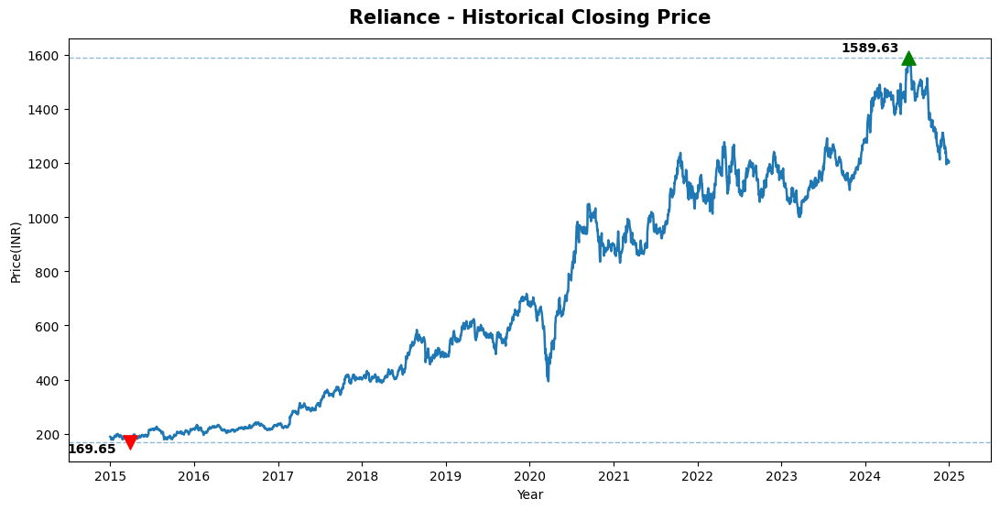

In [8]:
# Plot closing price with maximum high and minimum low

for name, data in cleaned_datasets.items():

    max_high_date = data["high"].idxmax()
    max_high = data["high"].max()

    min_low_date = data["low"].idxmin()
    min_low = data["low"].min()

    print(f"\n{name}")
    print(f"Maximum High: {max_high:.2f} on {max_high_date.strftime('%Y-%m-%d')}")
    print(f"Minimum Low : {min_low:.2f} on {min_low_date.strftime('%Y-%m-%d')}")

    fig, ax = plt.subplots(figsize=(13, 6))

    # Closing price
    ax.plot(
        data.index,
        data["close"],
        linewidth=1.8,
        label="Closing Price"
    )

    # Maximum high marker
    ax.scatter(
        max_high_date,
        max_high,
        marker="^",
        color="green",
        s=120,
        zorder=5,
        label=f"Maximum High: {max_high:.2f}"
    )

    # Minimum low marker
    ax.scatter(
        min_low_date,
        min_low,
        marker="v",
        color="red",
        s=120,
        zorder=5,
        label=f"Minimum Low: {min_low:.2f}"
    )

    # Maximum and minimum reference lines
    ax.axhline(
        max_high,
        linestyle="--",
        linewidth=1,
        alpha=0.5
    )

    ax.axhline(
        min_low,
        linestyle="--",
        linewidth=1,
        alpha=0.5
    )

    # Annotate maximum
    ax.annotate(
        f"{max_high:.2f}",
        xy=(max_high_date, max_high),
        xytext=(-30, 5),
        textcoords="offset points",
        ha="center",
        fontweight="bold"
    )

    # Annotate minimum
    ax.annotate(
        f"{min_low:.2f}",
        xy=(min_low_date, min_low),
        xytext=(-30, -8),
        textcoords="offset points",
        ha="center",
        fontweight="bold"
    )

    ax.set_title(
        f"{name} - Historical Closing Price",
        fontsize=15,
        fontweight="bold",
        pad=12
    )

    ax.set_xlabel("Year")
    ax.set_ylabel("Price(INR)")

    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

    ax.grid(True, linestyle="--", alpha=0.3)

    ax.legend(loc="upper left")

    plt.tight_layout()
    plt.show()

### 6.2 Trading Volume

Trading volume is analysed to examine changes in market activity and investor participation over the study period for each selected stock.

NameError: name 'mdates' is not defined

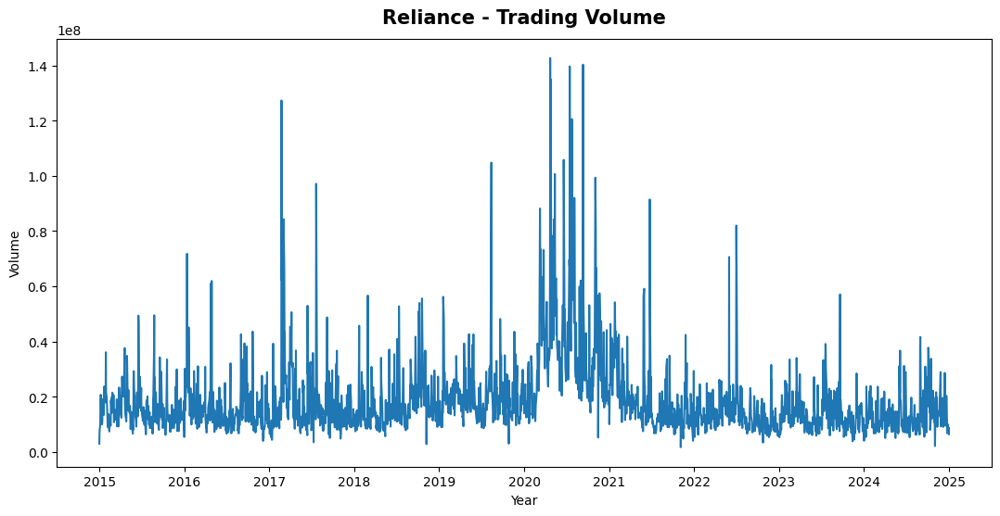

In [9]:
# Plot trading volume

for name, data in cleaned_datasets.items():

    plt.figure(figsize=(13, 6))

    plt.plot(
        data.index,
        data["volume"],
        linewidth=1.5,
        label="Trading Volume"
    )

    plt.title(
        f"{name} - Trading Volume",
        fontsize=15,
        fontweight="bold",
        pad=12
    )

    plt.xlabel("Year")
    plt.ylabel("Volume")

    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

    plt.grid(True, linestyle="--", alpha=0.3)
    plt.legend()

    plt.tight_layout()
    plt.show()

### Observation – Trading Volume

- Trading volume varies considerably over time across all five selected stocks, with occasional sharp spikes indicating periods of unusually high trading activity.

- Reliance shows relatively high and volatile trading volume throughout the period, with particularly noticeable spikes around 2020–2021.

- Infosys generally shows lower trading volume compared with Reliance, although several prominent volume spikes can be observed, particularly during 2017 and 2019–2020.

- HDFC Bank shows a noticeable increase in trading activity during the later part of the study period, particularly from 2023 onwards, accompanied by several substantial volume spikes.

- Maruti shows higher trading activity during certain periods, particularly around 2015–2016 and 2019–2021, with occasional sharp spikes.

- Sun Pharma exhibits several prominent volume spikes during the earlier part of the study period, while trading volume appears comparatively lower and more stable during the later years.

- Overall, the presence of irregular volume spikes across the selected stocks indicates that trading activity is not constant over time.

### 6.3 Daily Returns

Daily returns are calculated to examine the day-to-day percentage changes in the closing prices of the selected stocks. This helps to understand the short-term variability and fluctuations in stock prices over the study period.

NameError: name 'mdates' is not defined

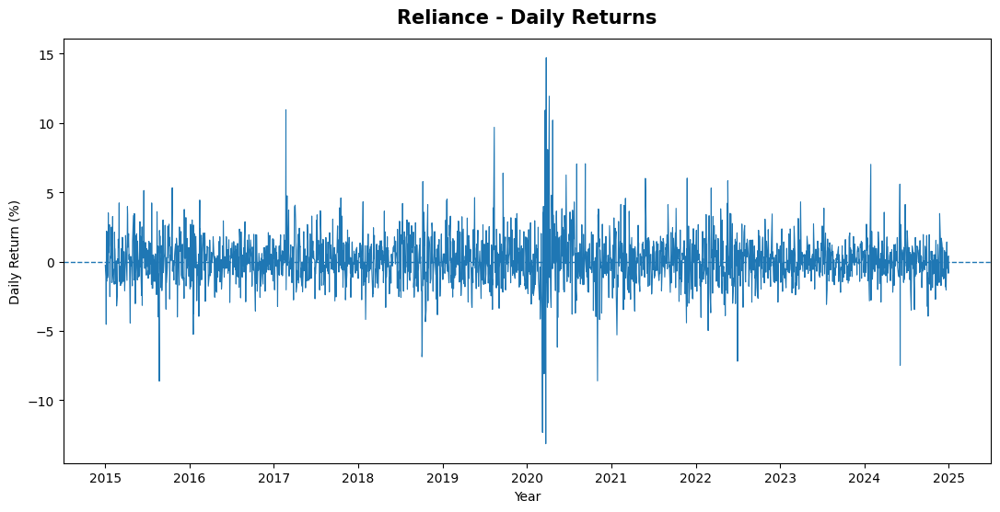

In [10]:
# Calculate and plot daily returns

for name, data in cleaned_datasets.items():

    daily_return = data["close"].pct_change() * 100

    plt.figure(figsize=(13, 6))

    plt.plot(
        daily_return.index,
        daily_return,
        linewidth=0.8,
        label="Daily Return"
    )

    plt.axhline(
        0,
        linestyle="--",
        linewidth=1
    )

    plt.title(
        f"{name} - Daily Returns",
        fontsize=15,
        fontweight="bold",
        pad=12
    )

    plt.xlabel("Year")
    plt.ylabel("Daily Return (%)")

    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

    plt.grid(True, linestyle="--", alpha=0.3)
    plt.legend()

    plt.tight_layout()
    plt.show()

### 6.4 Weekly Returns

Weekly returns are calculated to examine broader short-term movements in the closing prices of the selected stocks. Weekly aggregation reduces some of the day-to-day fluctuations observed in the daily return series.

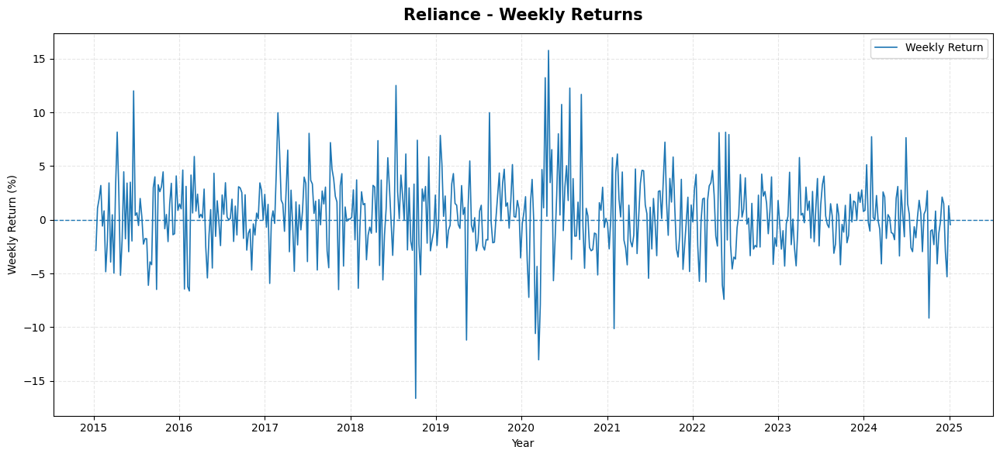

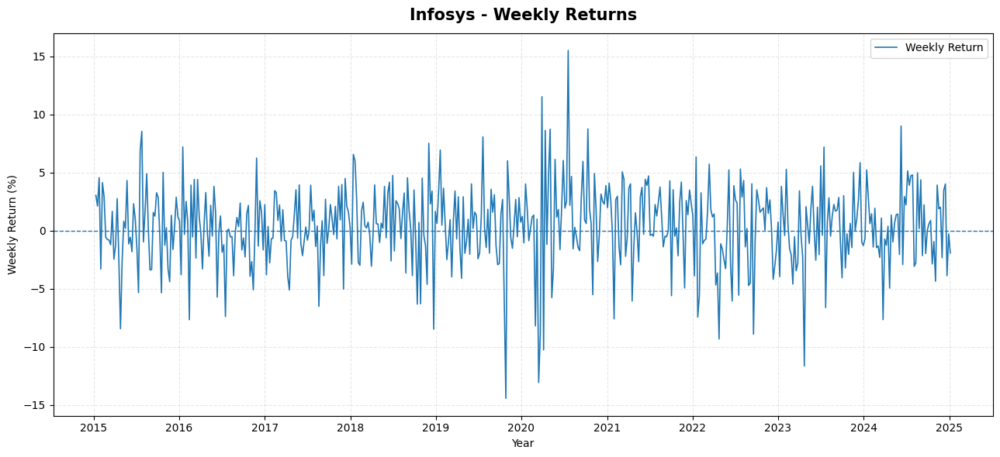

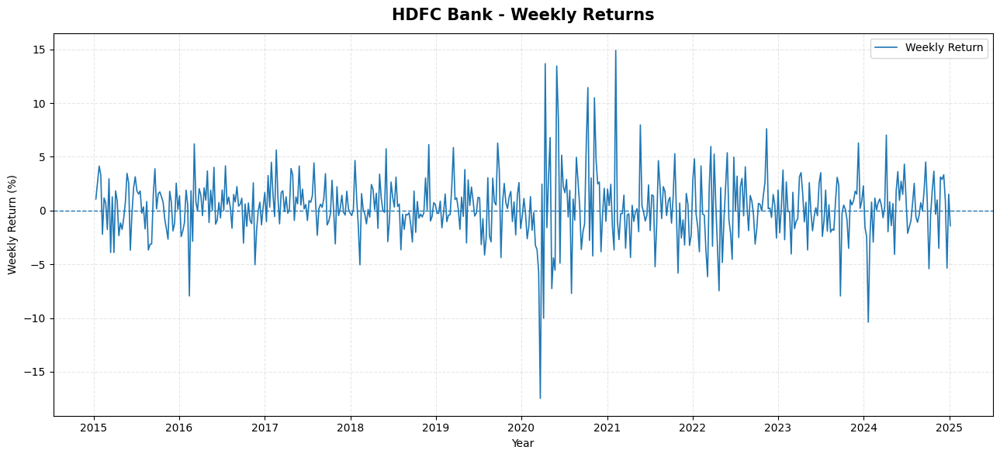

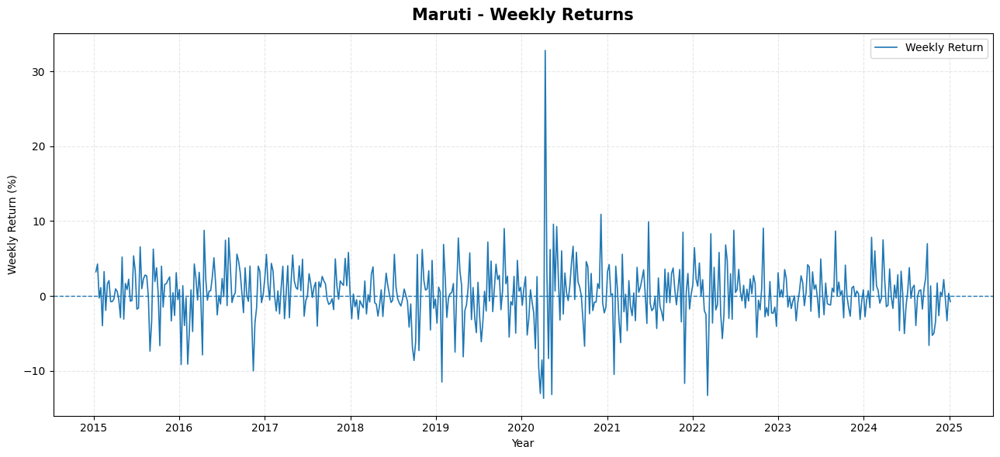

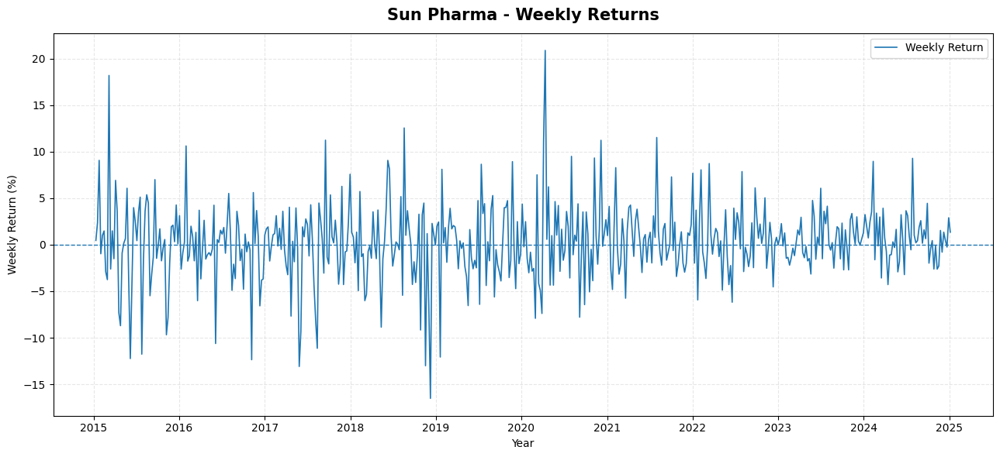

In [ ]:
# Calculate and plot weekly returns

for name, data in cleaned_datasets.items():

    weekly_close = data["close"].resample("W").last()
    weekly_return = weekly_close.pct_change() * 100

    plt.figure(figsize=(13, 6))

    plt.plot(
        weekly_return.index,
        weekly_return,
        linewidth=1.2,
        label="Weekly Return"
    )

    plt.axhline(
        0,
        linestyle="--",
        linewidth=1
    )

    plt.title(
        f"{name} - Weekly Returns",
        fontsize=15,
        fontweight="bold",
        pad=12
    )

    plt.xlabel("Year")
    plt.ylabel("Weekly Return (%)")

    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

    plt.grid(True, linestyle="--", alpha=0.3)
    plt.legend()

    plt.tight_layout()
    plt.show()

In [11]:
# Weekly return statistics

for name, data in cleaned_datasets.items():

    weekly_close = data["close"].resample("W").last()
    weekly_return = weekly_close.pct_change() * 100

    print(f"\n{name}")
    print(f"Mean Weekly Return   : {weekly_return.mean():.4f}%")
    print(f"Weekly Return Std Dev: {weekly_return.std():.4f}%")
    print(f"Maximum Weekly Return: {weekly_return.max():.4f}%")
    print(f"Minimum Weekly Return: {weekly_return.min():.4f}%")


Reliance
Mean Weekly Return   : 0.4217%
Weekly Return Std Dev: 3.6372%
Maximum Weekly Return: 15.7680%
Minimum Weekly Return: -16.6223%

Infosys
Mean Weekly Return   : 0.3636%
Weekly Return Std Dev: 3.4527%
Maximum Weekly Return: 15.5145%
Minimum Weekly Return: -14.4341%

HDFC Bank
Mean Weekly Return   : 0.3084%
Weekly Return Std Dev: 2.9656%
Maximum Weekly Return: 14.8939%
Minimum Weekly Return: -17.4752%

Maruti
Mean Weekly Return   : 0.3164%
Weekly Return Std Dev: 3.8996%
Maximum Weekly Return: 32.7845%
Minimum Weekly Return: -13.6588%

Sun Pharma
Mean Weekly Return   : 0.2539%
Weekly Return Std Dev: 4.0497%
Maximum Weekly Return: 20.8804%
Minimum Weekly Return: -16.5144%


### 6.5 Monthly Returns

Monthly returns are calculated to examine medium-term changes in the closing prices of the selected stocks. The last available closing price of each month is used to calculate the percentage change from the previous month.

NameError: name 'mdates' is not defined

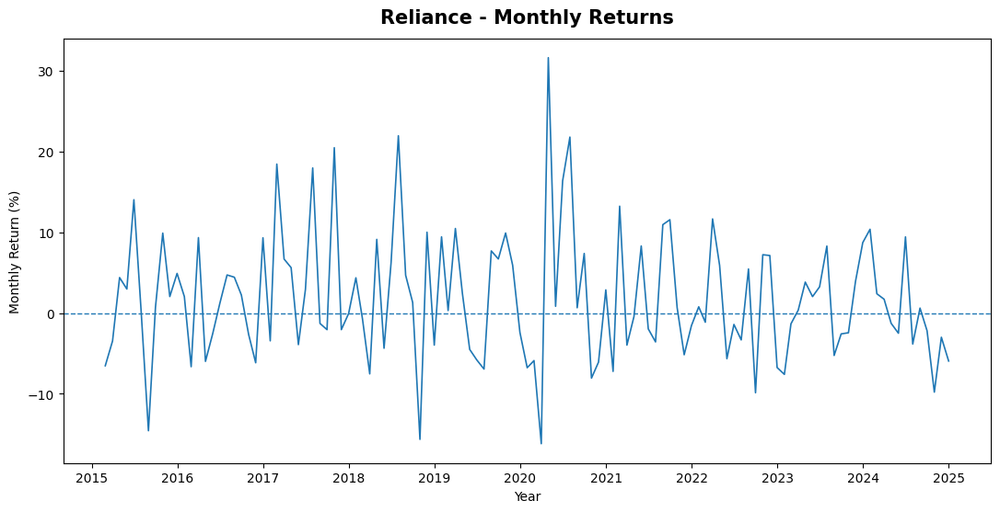

In [12]:
# Calculate and plot monthly returns

for name, data in cleaned_datasets.items():

    monthly_close = data["close"].resample("ME").last()
    monthly_return = monthly_close.pct_change() * 100

    plt.figure(figsize=(13, 6))

    plt.plot(
        monthly_return.index,
        monthly_return,
        linewidth=1.2,
        label="Monthly Return"
    )

    plt.axhline(
        0,
        linestyle="--",
        linewidth=1
    )

    plt.title(
        f"{name} - Monthly Returns",
        fontsize=15,
        fontweight="bold",
        pad=12
    )

    plt.xlabel("Year")
    plt.ylabel("Monthly Return (%)")

    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

    plt.grid(True, linestyle="--", alpha=0.3)
    plt.legend()

    plt.tight_layout()
    plt.show()

### 6.6 Yearly Returns

Yearly returns are calculated to examine the annual changes in the closing prices of the selected stocks. The last available closing price of each year is used to calculate the percentage change from the previous year.

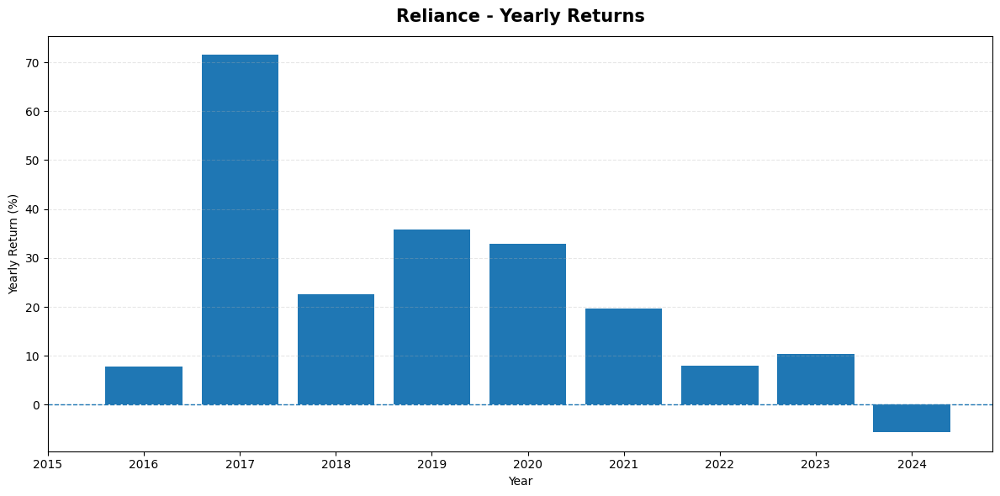

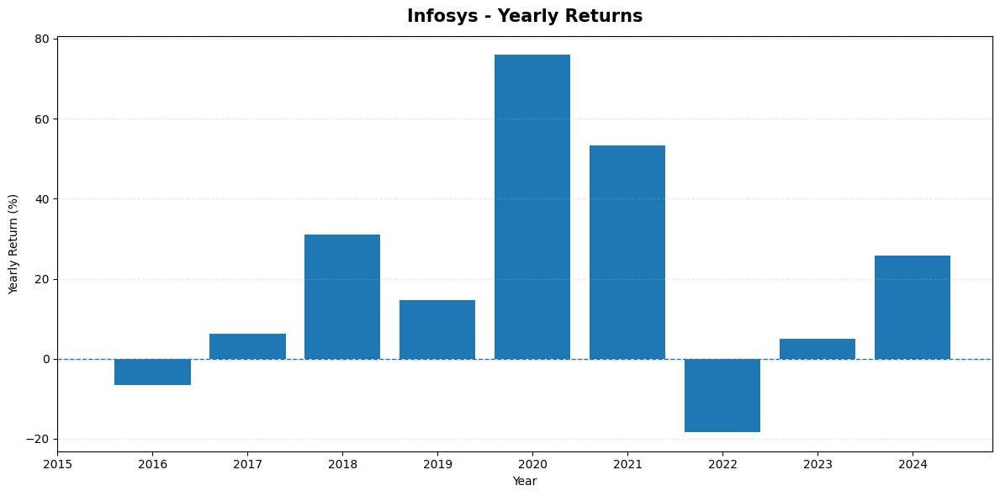

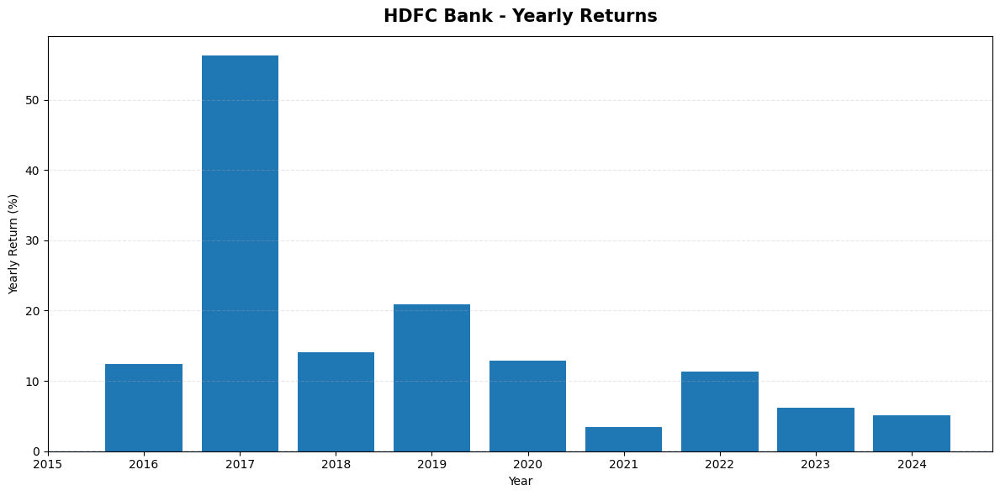

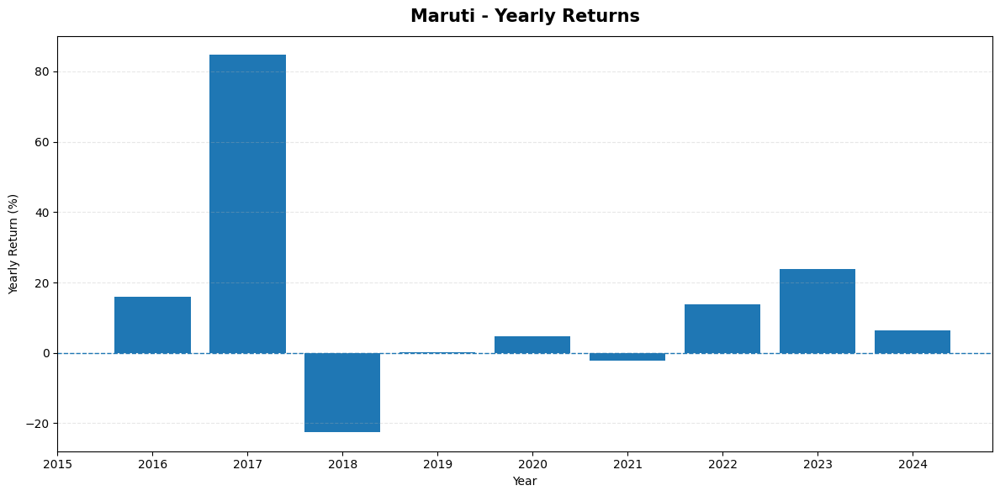

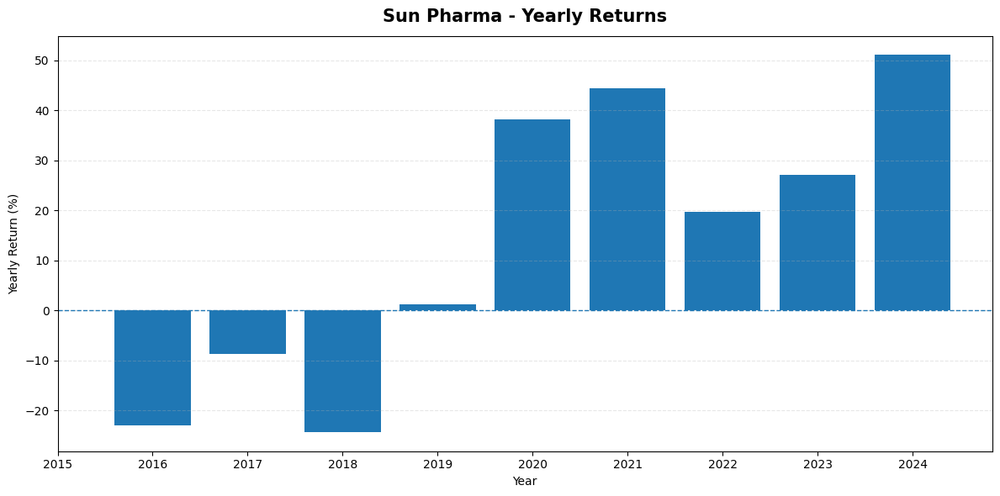

In [13]:
# Calculate and plot yearly returns

for name, data in cleaned_datasets.items():

    yearly_close = data["close"].resample("YE").last()
    yearly_return = yearly_close.pct_change() * 100

    plt.figure(figsize=(12, 6))

    bars = plt.bar(
        yearly_return.index.year,
        yearly_return.values
    )

    plt.axhline(
        0,
        linestyle="--",
        linewidth=1
    )

    plt.title(
        f"{name} - Yearly Returns",
        fontsize=15,
        fontweight="bold",
        pad=12
    )

    plt.xlabel("Year")
    plt.ylabel("Yearly Return (%)")

    plt.xticks(yearly_return.index.year)

    plt.grid(
        axis="y",
        linestyle="--",
        alpha=0.3
    )

    plt.tight_layout()
    plt.show()

In [14]:
# Yearly return statistics

for name, data in cleaned_datasets.items():

    yearly_close = data["close"].resample("YE").last()
    yearly_return = yearly_close.pct_change() * 100

    print(f"\n{name}")
    print(f"Mean Yearly Return   : {yearly_return.mean():.4f}%")
    print(f"Yearly Return Std Dev: {yearly_return.std():.4f}%")
    print(f"Maximum Yearly Return: {yearly_return.max():.4f}%")
    print(f"Minimum Yearly Return: {yearly_return.min():.4f}%")


Reliance
Mean Yearly Return   : 22.5589%
Yearly Return Std Dev: 22.5425%
Maximum Yearly Return: 71.5395%
Minimum Yearly Return: -5.6403%

Infosys
Mean Yearly Return   : 20.7536%
Yearly Return Std Dev: 29.6020%
Maximum Yearly Return: 75.9651%
Minimum Yearly Return: -18.3775%

HDFC Bank
Mean Yearly Return   : 15.8464%
Yearly Return Std Dev: 16.0677%
Maximum Yearly Return: 56.2628%
Minimum Yearly Return: 3.4466%

Maruti
Mean Yearly Return   : 13.8466%
Yearly Return Std Dev: 29.6765%
Maximum Yearly Return: 84.7312%
Minimum Yearly Return: -22.5878%

Sun Pharma
Mean Yearly Return   : 13.9457%
Yearly Return Std Dev: 28.7765%
Maximum Yearly Return: 51.1072%
Minimum Yearly Return: -24.3985%


### 6.7 Distribution of Daily Returns

The distribution of daily returns is examined to understand the spread and frequency of positive and negative price movements for the selected stocks. This also helps identify the presence of unusually large return observations.

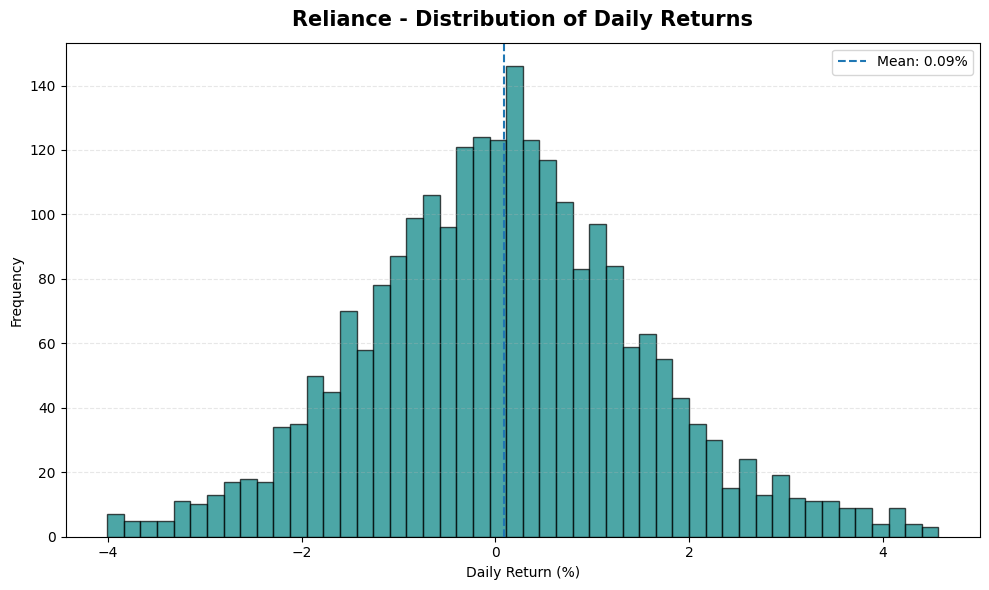

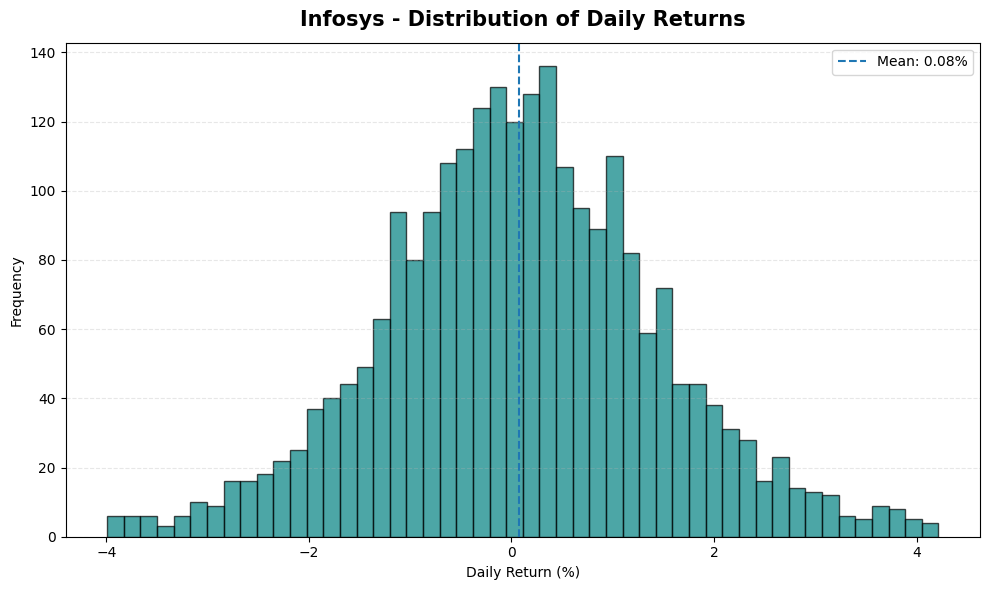

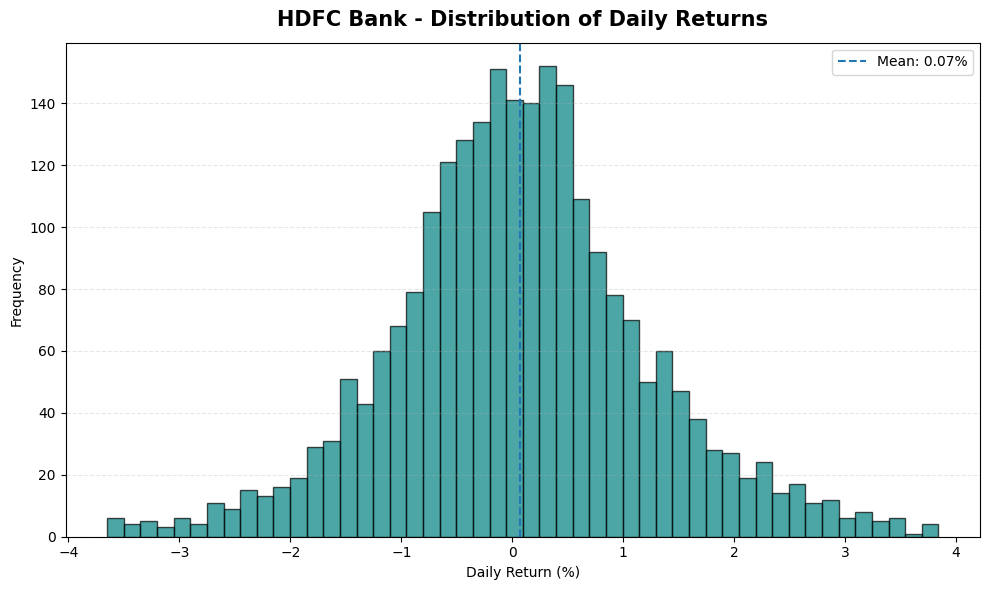

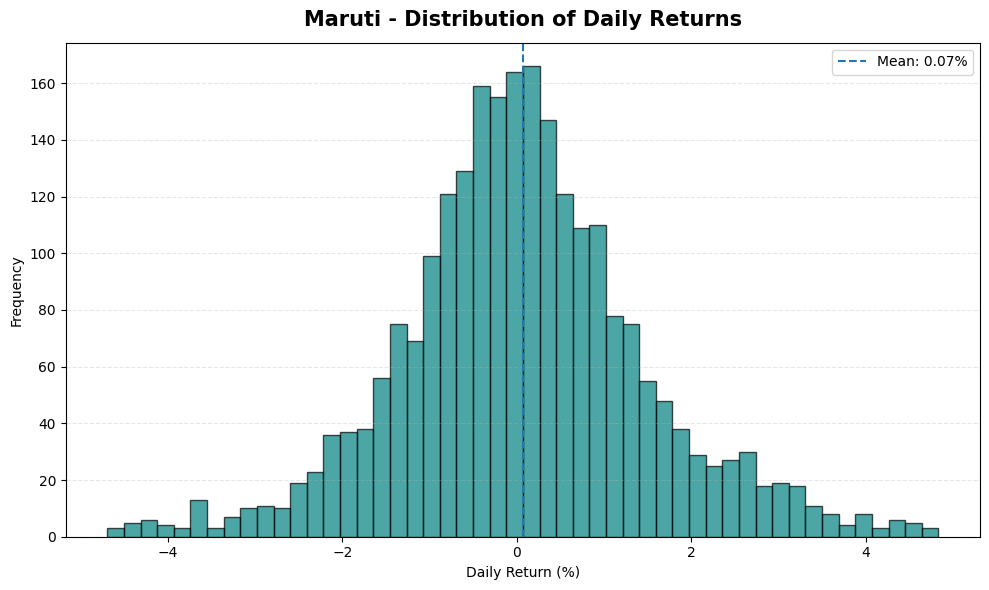

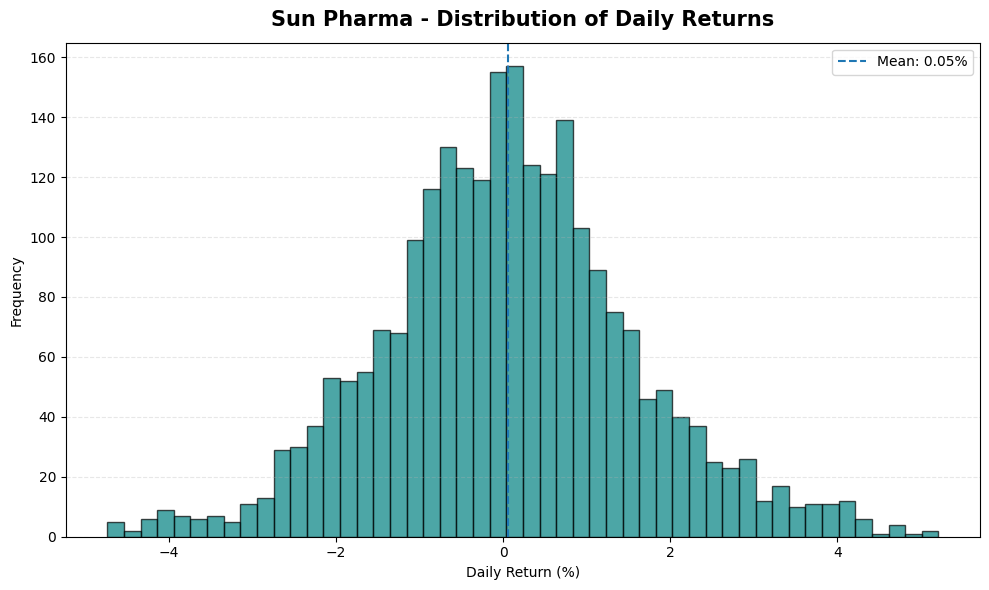

In [15]:
# Plot distribution of daily returns

for name, data in cleaned_datasets.items():

    daily_return = data["close"].pct_change() * 100
    daily_return = daily_return.dropna()

    # Limit histogram range to 1st and 99th percentiles
    lower = daily_return.quantile(0.01)
    upper = daily_return.quantile(0.99)

    plt.figure(figsize=(10, 6))

    plt.hist(
        daily_return,
        bins=50,
        range=(lower, upper),
        edgecolor="black",
        color="teal",
        alpha=0.7
    )

    plt.axvline(
        daily_return.mean(),
        linestyle="--",
        linewidth=1.5,
        label=f"Mean: {daily_return.mean():.2f}%"
    )

    plt.title(
        f"{name} - Distribution of Daily Returns",
        fontsize=15,
        fontweight="bold",
        pad=12
    )

    plt.xlabel("Daily Return (%)")
    plt.ylabel("Frequency")

    plt.grid(
        axis="y",
        linestyle="--",
        alpha=0.3
    )

    plt.legend()

    plt.tight_layout()
    plt.show()

In [16]:

# Create daily return summary

return_summary = []

for name, data in cleaned_datasets.items():

    daily_return = data["close"].pct_change() * 100
    daily_return = daily_return.dropna()

    return_summary.append({
        "Stock": name,
        "Mean Return (%)": daily_return.mean(),
        "Std Dev (%)": daily_return.std(),
        "Maximum Return (%)": daily_return.max(),
        "Minimum Return (%)": daily_return.min()
    })

return_summary_df = pd.DataFrame(return_summary)

return_summary_df.round(2)

,Stock,Mean Return (%),Std Dev (%),Maximum Return (%),Minimum Return (%)
0,Reliance,0.09,1.75,14.72,-13.15
1,Infosys,0.08,1.67,12.03,-16.19
2,HDFC Bank,0.07,1.43,11.60,-12.61
3,Maruti,0.07,1.75,13.51,-16.91
4,Sun Pharma,0.05,1.84,11.01,-15.06


### 6.8 Summary Statistics

Descriptive statistics are used to summarise the distribution and range of the OHLCV variables for each selected stock. This provides an overall view of the central tendency, variability, and range of the historical data.

In [17]:
# Summary statistics for all stocks

for name, data in cleaned_datasets.items():

    print(f"\n{name}")
    print("-" * 50)

    display(
        data[["open", "high", "low", "close", "volume"]]
        .describe()
        .round(2)
    )


Reliance
--------------------------------------------------


,open,high,low,close,volume
count,2467.00,2467.00,2467.00,2467.00,2.467000e+03
mean,727.86,735.29,720.02,727.33,1.842886e+07
std,418.22,421.80,414.36,417.92,1.355224e+07
min,173.94,174.17,169.65,172.69,1.705656e+06
25%,314.41,316.15,311.72,314.20,1.069616e+07
50%,642.43,649.97,633.65,639.09,1.464381e+07
75%,1117.63,1128.41,1106.93,1116.20,2.109197e+07
max,1585.33,1589.63,1566.61,1581.82,1.426834e+08



Infosys
--------------------------------------------------


,open,high,low,close,volume
count,2467.00,2467.00,2467.00,2467.00,2.467000e+03
mean,867.18,875.70,858.34,867.01,8.015341e+06
std,471.58,475.59,467.45,471.64,6.720554e+06
min,341.30,344.25,333.54,338.74,3.719660e+05
25%,422.07,426.92,416.80,422.38,4.992640e+06
50%,621.46,627.11,615.35,621.51,6.599316e+06
75%,1330.06,1341.35,1316.20,1329.37,8.882454e+06
max,1897.04,1907.50,1880.07,1901.08,1.644050e+08



HDFC Bank
--------------------------------------------------


,open,high,low,close,volume
count,2467.00,2467.00,2467.00,2467.00,2.467000e+03
mean,533.99,538.68,529.00,533.90,1.760174e+07
std,194.85,196.48,193.23,194.82,2.181708e+07
min,210.93,213.54,209.87,211.50,5.700080e+05
25%,382.26,386.59,379.10,382.48,6.176613e+06
50%,529.45,533.81,524.68,528.82,1.153853e+07
75%,708.18,714.98,702.31,708.73,2.216829e+07
max,911.26,912.37,901.96,908.37,4.453421e+08



Maruti
--------------------------------------------------


,open,high,low,close,volume
count,2467.00,2467.00,2467.00,2467.00,2467.00
mean,7096.28,7169.56,7013.72,7089.69,723215.94
std,2339.28,2355.93,2317.24,2336.25,529427.07
min,2922.51,3049.51,2915.52,2955.01,0.00
25%,5519.87,5587.65,5457.01,5521.06,399602.00
50%,6942.92,7000.71,6863.93,6931.82,580858.00
75%,8440.22,8503.61,8355.58,8428.33,895469.50
max,13239.70,13406.89,13132.31,13351.10,10567769.00



Sun Pharma
--------------------------------------------------


,open,high,low,close,volume
count,2467.00,2467.00,2467.00,2467.00,2.467000e+03
mean,759.92,768.62,750.23,759.12,5.145439e+06
std,351.83,354.17,349.17,352.04,7.514413e+06
min,302.12,323.12,293.06,304.80,1.075960e+05
25%,489.50,495.63,481.18,487.90,2.162282e+06
50%,701.33,707.33,690.33,698.63,3.474806e+06
75%,881.86,890.71,870.30,881.84,5.809146e+06
max,1913.49,1924.63,1886.05,1913.20,2.657094e+08


### Observation – Summary Statistics

The descriptive statistics show substantial differences in price levels and trading volumes across the selected stocks. The standard deviation and minimum–maximum ranges indicate considerable variation in closing prices over the study period. Trading volume also varies considerably, with occasional very high-volume observations.

In [18]:
# Compare closing price statistics across stocks

summary = []

for name, data in cleaned_datasets.items():

    summary.append({
        "Stock": name,
        "Mean Close": data["close"].mean(),
        "Std Close": data["close"].std(),
        "Minimum Close": data["close"].min(),
        "Maximum Close": data["close"].max()
    })

closing_summary = pd.DataFrame(summary)

closing_summary.round(2)

,Stock,Mean Close,Std Close,Minimum Close,Maximum Close
0,Reliance,727.33,417.92,172.69,1581.82
1,Infosys,867.01,471.64,338.74,1901.08
2,HDFC Bank,533.90,194.82,211.50,908.37
3,Maruti,7089.69,2336.25,2955.01,13351.10
4,Sun Pharma,759.12,352.04,304.80,1913.20


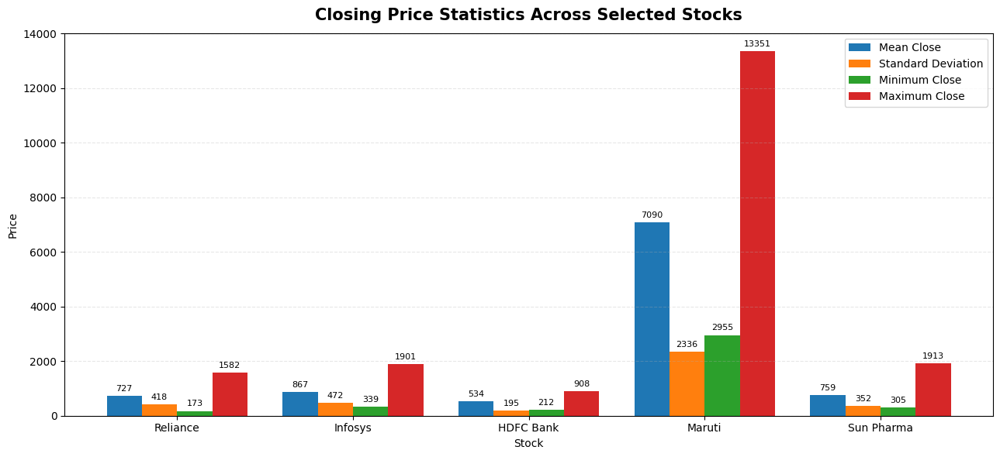

In [19]:
# Compare closing price statistics across stocks

x = np.arange(len(closing_summary))
width = 0.2

fig, ax = plt.subplots(figsize=(13, 6))

bars1 = ax.bar(
    x - 1.5 * width,
    closing_summary["Mean Close"],
    width,
    label="Mean Close"
)

bars2 = ax.bar(
    x - 0.5 * width,
    closing_summary["Std Close"],
    width,
    label="Standard Deviation"
)

bars3 = ax.bar(
    x + 0.5 * width,
    closing_summary["Minimum Close"],
    width,
    label="Minimum Close"
)

bars4 = ax.bar(
    x + 1.5 * width,
    closing_summary["Maximum Close"],
    width,
    label="Maximum Close"
)

ax.set_title(
    "Closing Price Statistics Across Selected Stocks",
    fontsize=15,
    fontweight="bold",
    pad=12
)

ax.set_xlabel("Stock")
ax.set_ylabel("Price")

ax.set_xticks(x)
ax.set_xticklabels(closing_summary["Stock"])

ax.legend()

ax.grid(
    axis="y",
    linestyle="--",
    alpha=0.3
)

# Add values above bars
for bars in [bars1, bars2, bars3, bars4]:
    for bar in bars:
        height = bar.get_height()

        ax.annotate(
            f"{height:.0f}",
            xy=(bar.get_x() + bar.get_width() / 2, height),
            xytext=(0, 3),
            textcoords="offset points",
            ha="center",
            va="bottom",
            fontsize=8
        )

plt.tight_layout()
plt.show()

### 6.9 Daily Return Volatility Across Selected Stocks

Standard deviation of daily returns is used to compare the short-term volatility of the selected stocks. Unlike the standard deviation of raw closing prices, return-based standard deviation is expressed as a percentage and provides a more comparable measure of price variability across stocks with different price levels.

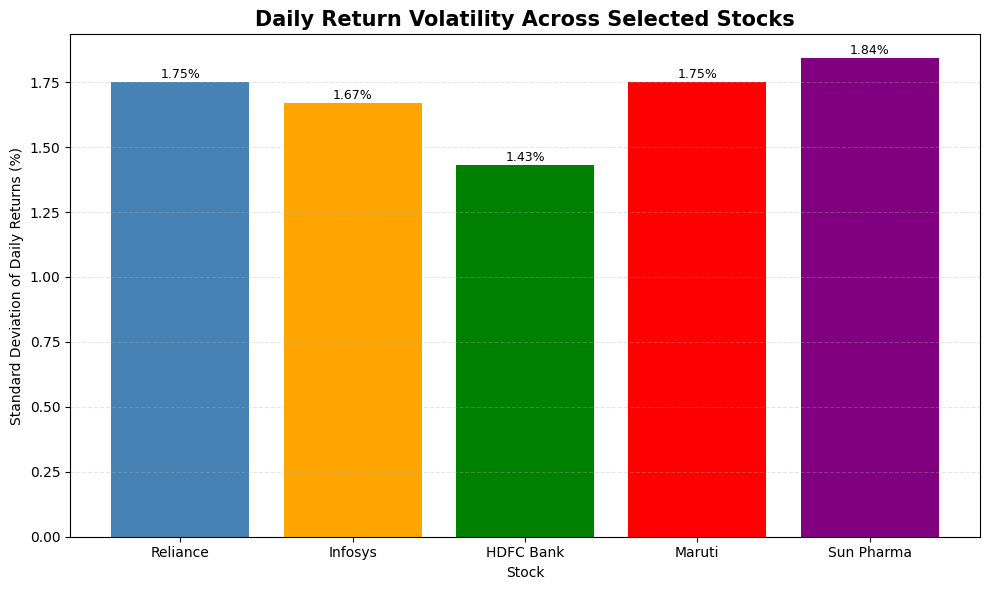

In [20]:
# Compare return volatility across stocks

return_volatility = []

for name, data in cleaned_datasets.items():

    daily_return = data["close"].pct_change() * 100

    return_volatility.append({
        "Stock": name,
        "Return Std Dev (%)": daily_return.std()
    })

volatility_df = pd.DataFrame(return_volatility)

plt.figure(figsize=(10, 6))

colors = ["steelblue", "orange", "green", "red", "purple"]

bars = plt.bar(
    volatility_df["Stock"],
    volatility_df["Return Std Dev (%)"],
    color=colors
)

plt.title(
    "Daily Return Volatility Across Selected Stocks",
    fontsize=15,
    fontweight="bold"
)

plt.xlabel("Stock")
plt.ylabel("Standard Deviation of Daily Returns (%)")

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.3
)

# Add values above bars
for bar in bars:

    height = bar.get_height()

    plt.annotate(
        f"{height:.2f}%",
        xy=(bar.get_x() + bar.get_width() / 2, height),
        xytext=(0, 3),
        textcoords="offset points",
        ha="center",
        fontsize=9
    )

plt.tight_layout()
plt.show()

## 7. Target Variable Creation

The target variable is defined as the closing price of the next trading day. This allows the models to learn the relationship between the current day's market information and the following trading day's closing price.

The target is created using a one-period forward shift of the closing price.

In [21]:
# Create next-day closing price target

model_datasets = {}

for name, data in cleaned_datasets.items():

    model_data = data.copy()

    # Next trading day's closing price
    model_data["target"] = model_data["close"].shift(-1)

    # Remove the final row because its target is unavailable
    model_data.dropna(subset=["target"], inplace=True)

    model_datasets[name] = model_data

print("Next-day target created for all stocks.")

Next-day target created for all stocks.


In [22]:
# Check target creation

for name, data in model_datasets.items():

    print(f"\n{name}")
    display(data[["close", "target"]].head())


Reliance


,close,target
date,,
2015-01-01,189.125381,188.624802
2015-01-02,188.624802,186.558701
2015-01-05,186.558701,178.091827
2015-01-06,178.091827,181.968475
2015-01-07,181.968475,179.359207



Infosys


,close,target
date,,
2015-01-01,359.980988,367.055237
2015-01-02,367.055237,363.901001
2015-01-05,363.901001,356.298035
2015-01-06,356.298035,358.002838
2015-01-07,358.002838,359.807831



HDFC Bank


,close,target
date,,
2015-01-01,213.700882,216.675003
2015-01-02,216.675003,214.845581
2015-01-05,214.845581,211.501099
2015-01-06,211.501099,212.118393
2015-01-07,212.118393,216.573975



Maruti


,close,target
date,,
2015-01-01,3032.034912,3049.143555
2015-01-02,3049.143555,3129.192627
2015-01-05,3129.192627,3081.498291
2015-01-06,3081.498291,3120.071289
2015-01-07,3120.071289,3154.333008



Sun Pharma


,close,target
date,,
2015-01-01,750.971313,754.670410
2015-01-02,754.670410,755.127136
2015-01-05,755.127136,738.503784
2015-01-06,738.503784,739.645447
2015-01-07,739.645447,747.865723


## 8. Feature and Target Definition

The current day's Open, High, Low, Close, and Volume values are used as input features. The next trading day's closing price is used as the target variable.

No technical indicators are included in this modelling approach, allowing the models to be compared using the same basic market information.

In [23]:
# Define features and target

features = ["open", "high", "low", "close", "volume"]

X_datasets = {}
y_datasets = {}

for name, data in model_datasets.items():

    X_datasets[name] = data[features]
    y_datasets[name] = data["target"]

print("Features and target defined successfully.")

Features and target defined successfully.


In [24]:
# Check feature and target structure

print("Features:")
display(X_datasets["Reliance"].head())

print("\nTarget:")
display(y_datasets["Reliance"].head())

Features:


,open,high,low,close,volume
date,,,,,
2015-01-01,188.784586,189.998697,188.220116,189.125381,2963643
2015-01-02,189.167958,190.861340,188.358555,188.624802,7331366
2015-01-05,188.507680,189.764404,186.185942,186.558701,10103941
2015-01-06,185.312637,185.951642,177.218511,178.091827,18627980
2015-01-07,178.304828,182.926990,178.283529,181.968475,20720312



Target:


date
2015-01-01    188.624802
2015-01-02    186.558701
2015-01-05    178.091827
2015-01-06    181.968475
2015-01-07    179.359207
Name: target, dtype: float64

## 9. Train-Test Split

The data is divided into training and testing sets using a chronological split. The first 75% of observations are used for model training, while the remaining 25% are reserved for testing.

The data is not shuffled to preserve the temporal order of the stock-price observations and to ensure that future observations are not used during model training.

In [25]:
# Split data chronologically

X_train_datasets = {}
X_test_datasets = {}
y_train_datasets = {}
y_test_datasets = {}

for name in model_datasets:

    X = X_datasets[name]
    y = y_datasets[name]

    split_index = int(len(X) * 0.75)

    X_train_datasets[name] = X.iloc[:split_index]
    X_test_datasets[name] = X.iloc[split_index:]

    y_train_datasets[name] = y.iloc[:split_index]
    y_test_datasets[name] = y.iloc[split_index:]

print("Chronological train-test split completed.")

Chronological train-test split completed.


In [26]:
# Display train-test information

for name in model_datasets:

    print(f"\n{name}")
    print(f"Training samples: {len(X_train_datasets[name])}")
    print(f"Testing samples : {len(X_test_datasets[name])}")

    print(
        f"Training period: "
        f"{X_train_datasets[name].index.min().date()} "
        f"to "
        f"{X_train_datasets[name].index.max().date()}"
    )

    print(
        f"Testing period : "
        f"{X_test_datasets[name].index.min().date()} "
        f"to "
        f"{X_test_datasets[name].index.max().date()}"
    )


Reliance
Training samples: 1849
Testing samples : 617
Training period: 2015-01-01 to 2022-06-28
Testing period : 2022-06-29 to 2024-12-30

Infosys
Training samples: 1849
Testing samples : 617
Training period: 2015-01-01 to 2022-06-28
Testing period : 2022-06-29 to 2024-12-30

HDFC Bank
Training samples: 1849
Testing samples : 617
Training period: 2015-01-01 to 2022-06-28
Testing period : 2022-06-29 to 2024-12-30

Maruti
Training samples: 1849
Testing samples : 617
Training period: 2015-01-01 to 2022-06-28
Testing period : 2022-06-29 to 2024-12-30

Sun Pharma
Training samples: 1849
Testing samples : 617
Training period: 2015-01-01 to 2022-06-28
Testing period : 2022-06-29 to 2024-12-30


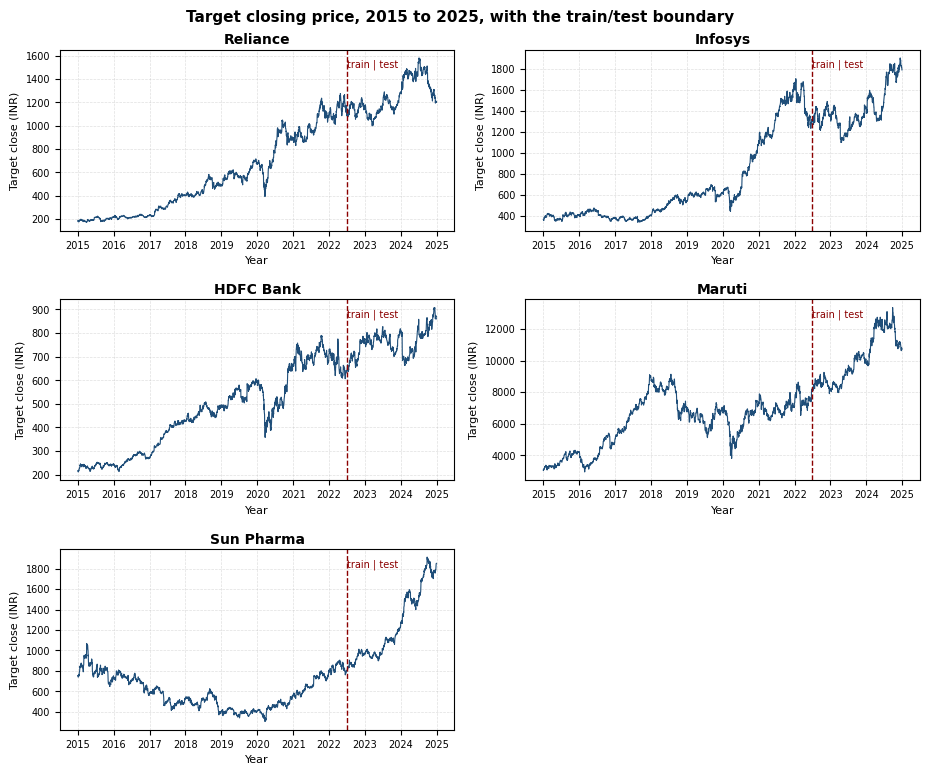

In [39]:
# Plot target Close price with train/test boundary

fig, axes = plt.subplots(
    nrows=3,
    ncols=2,
    figsize=(10, 8),
    constrained_layout=False
)

# Flatten axes for easy iteration
axes = axes.flatten()

# Plot each dataset
for i, name in enumerate(model_datasets):

    ax = axes[i]

    # Get train and test target values
    y_train = y_train_datasets[name]
    y_test = y_test_datasets[name]

    # Make sure they are Series
    if isinstance(y_train, pd.DataFrame):
        y_train = y_train.iloc[:, 0]

    if isinstance(y_test, pd.DataFrame):
        y_test = y_test.iloc[:, 0]

    # Combine train + test for one continuous line
    y_all = pd.concat([y_train, y_test])

    # Plot target Close price
    ax.plot(
        y_all.index,
        y_all.values,
        linewidth=0.8,
        color="#1f4e79"
    )

    # Train/Test boundary
    split_date = y_test.index[0]

    ax.axvline(
        x=split_date,
        color="darkred",
        linestyle="--",
        linewidth=1.0
    )
    
    # Train / Test labels
    
    y_min = y_all.min()
    y_max = y_all.max()
    y_range = y_max - y_min

    ax.text(
        split_date,
        y_max - 0.01 * y_range,
        "train | test",
        color="darkred",
        fontsize=7,
        ha="left",
        va="top"
    )
    
    # Title

    ax.set_title(
        name,
        fontsize=10,
        fontweight="bold",
        pad=4
    )

    # Axis labels

    ax.set_xlabel(
        "Year",
        fontsize=8
    )

    ax.set_ylabel(
        "Target close (INR)",
        fontsize=8
    )


    # X-axis formatting — years like your original graph
    
    ax.xaxis.set_major_locator(
        mdates.YearLocator()
    )

    ax.xaxis.set_major_formatter(
        mdates.DateFormatter("%Y")
    )

    ax.grid(
        True,
        linestyle="--",
        linewidth=0.5,
        alpha=0.4
    )

    # Tick size
    ax.tick_params(
        axis="both",
        labelsize=7
    )

    # keep x labels horizontal
    plt.setp(
        ax.get_xticklabels(),
        rotation=0
    )


# Remove unused 6th subplot

if len(model_datasets) < len(axes):
    for j in range(len(model_datasets), len(axes)):
        fig.delaxes(axes[j])


# Overall layout

fig.suptitle(
    "Target closing price, 2015 to 2025, with the train/test boundary",
    fontsize=11,
    fontweight="bold",
    y=0.98
)

plt.subplots_adjust(
    left=0.10,
    right=0.96,
    top=0.93,
    bottom=0.08,
    wspace=0.18,
    hspace=0.38
)
plt.savefig("target_closing_price_with_train_test_boundary.png", dpi=300, bbox_inches="tight")
plt.show()

## 10. Feature Scaling

Min-Max normalization is applied to the input features to bring the variables to a common scale. The scaler is fitted only on the training data and then used to transform both the training and testing data.

The same scaled features are used across the models to maintain a consistent preprocessing procedure.

In [79]:
# Scale both features and target for all stocks

from sklearn.preprocessing import MinMaxScaler

scalers = {}
target_scalers = {}

X_train_scaled = {}
X_test_scaled = {}

y_train_scaled = {}
y_test_scaled = {}

for name in model_datasets:

    # Feature scaler
    feature_scaler = MinMaxScaler()

    X_train_scaled[name] = feature_scaler.fit_transform(
        X_train_datasets[name]
    )

    X_test_scaled[name] = feature_scaler.transform(
        X_test_datasets[name]
    )

    scalers[name] = feature_scaler


    # Target scaler
    target_scaler = MinMaxScaler()

    y_train_scaled[name] = target_scaler.fit_transform(
        np.array(y_train_datasets[name]).reshape(-1, 1)
    )

    y_test_scaled[name] = target_scaler.transform(
        np.array(y_test_datasets[name]).reshape(-1, 1)
    )

    target_scalers[name] = target_scaler


print("FEATURE AND TARGET SCALING COMPLETED")


FEATURE AND TARGET SCALING COMPLETED


In [80]:
# Check scaled training data

display(X_train_scaled["Reliance"][:5])

array([[0.01325964, 0.01413769, 0.01700548, 0.01487883, 0.0089233 ],
       [0.01360203, 0.0149083 , 0.01713223, 0.0144256 , 0.03990496],
       [0.01301232, 0.01392839, 0.01514308, 0.01255492, 0.05957172],
       [0.01015875, 0.01052241, 0.00693286, 0.00488891, 0.12003546],
       [0.00389989, 0.00782045, 0.00790795, 0.00839887, 0.13487704]])

In [81]:
y_train_scaled['Reliance'][:5]

array([[0.0144256 ],
       [0.01255492],
       [0.00488891],
       [0.00839887],
       [0.00603641]])

## 11. Linear Regression

Linear Regression is used as the baseline model for next-day stock price prediction. The model learns a linear relationship between the current day's OHLCV features and the next trading day's closing price.

In [82]:
# Train Linear Regression models

from sklearn.linear_model import LinearRegression

lr_models = {}
lr_predictions = {}
lr_results = {}

for name in model_datasets:

    model = LinearRegression()

    # Train the model
    model.fit(
        X_train_scaled[name],
        y_train_datasets[name]
    )

    # Predict next-day closing prices
    y_pred = model.predict(
        X_test_scaled[name]
    )

    lr_models[name] = model
    lr_predictions[name] = y_pred

print("Linear Regression training completed for all stocks.")

Linear Regression training completed for all stocks.


In [83]:
# Evaluate Linear Regression models

from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score
)

for name in model_datasets:

    y_true = y_test_datasets[name]
    y_pred = lr_predictions[name]

    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)

    mape = np.mean(
        np.abs((y_true - y_pred) / y_true)
    ) * 100

    r2 = r2_score(y_true, y_pred)

    lr_results[name] = {
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "MAPE": mape,
        "R²": r2
    }

In [84]:
# Display Linear Regression results

lr_results_df = pd.DataFrame(lr_results).T

lr_results_df.round(4)

,MAE,MSE,RMSE,MAPE,R²
Reliance,11.9506,280.1709,16.7383,0.9517,0.9869
Infosys,15.0359,442.3824,21.0329,1.0597,0.9885
HDFC Bank,6.6377,89.7260,9.4724,0.8754,0.9708
Maruti,94.3949,17709.6582,133.0776,0.9244,0.9924
Sun Pharma,10.8838,223.4078,14.9468,0.8696,0.9980


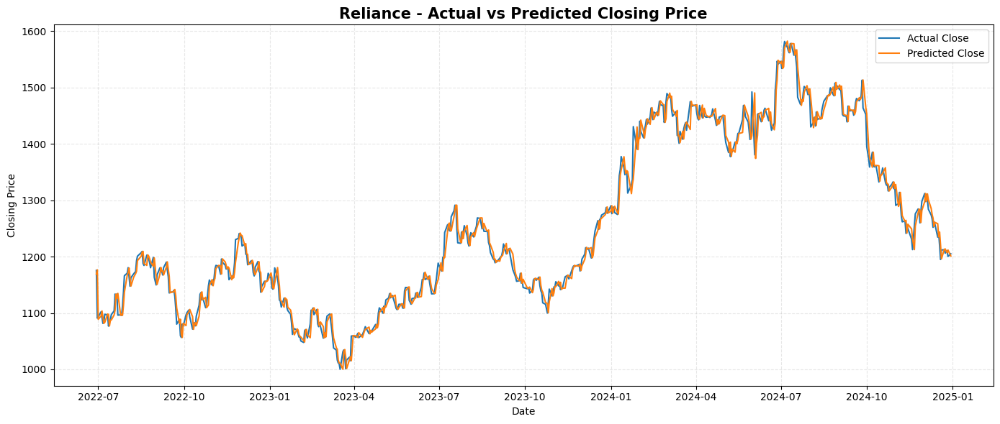

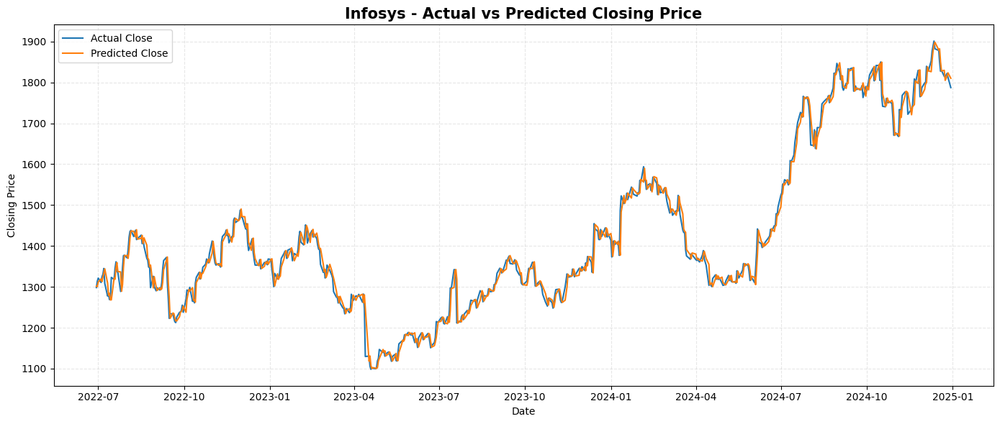

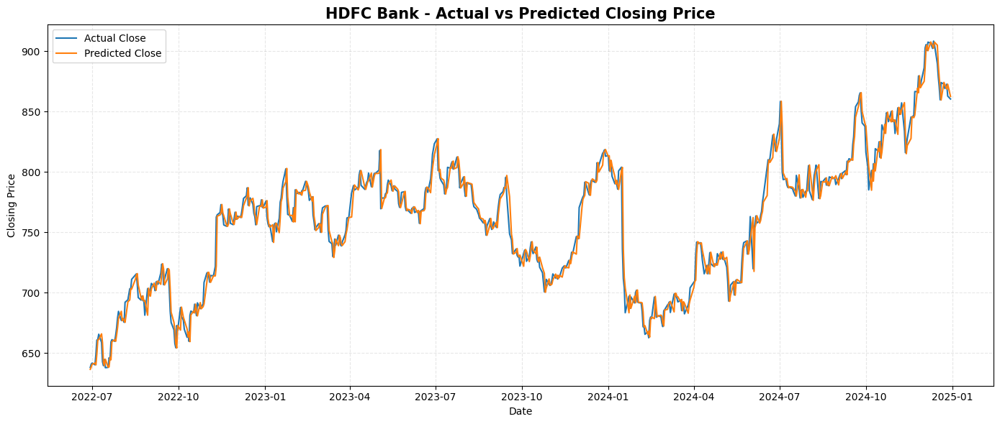

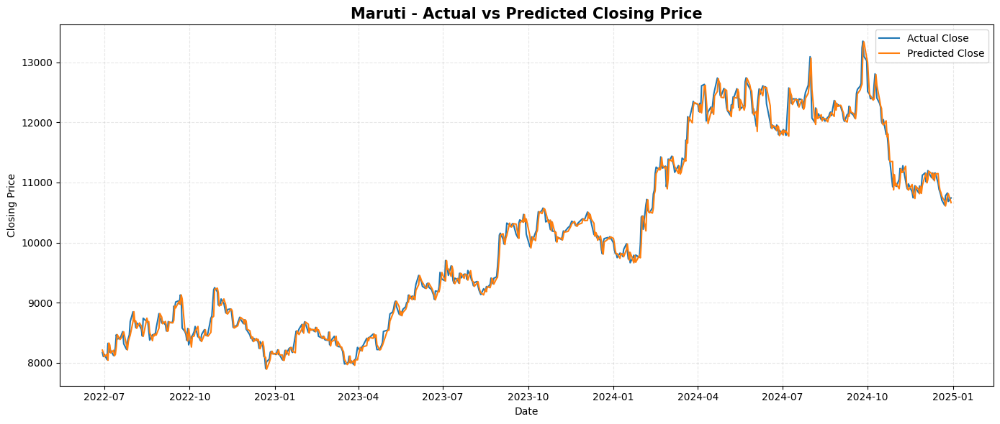

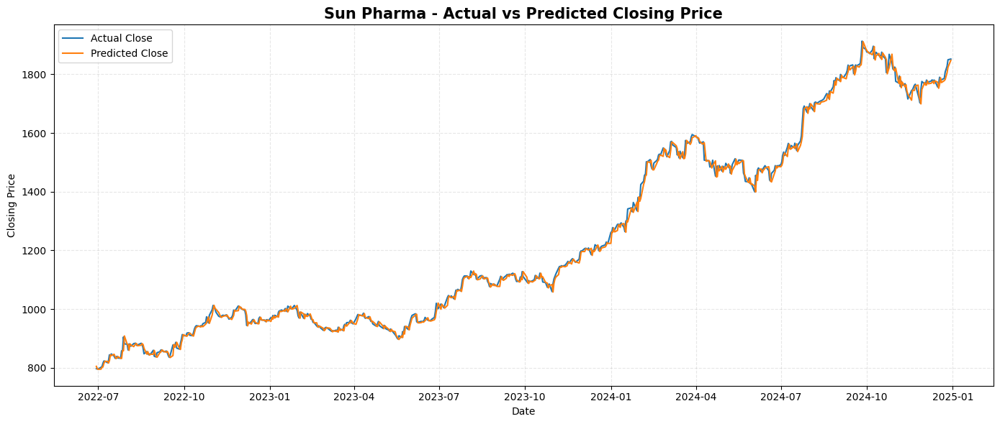

In [85]:
# Plot actual vs predicted closing prices

for name in model_datasets:

    y_true = y_test_datasets[name]
    y_pred = lr_predictions[name]

    plt.figure(figsize=(14, 6))

    plt.plot(
        y_true.index,
        y_true.values,
        label="Actual Close",
        linewidth=1.5
    )

    plt.plot(
        y_true.index,
        y_pred,
        label="Predicted Close",
        linewidth=1.5
    )

    plt.title(
        f"{name} - Actual vs Predicted Closing Price",
        fontsize=15,
        fontweight="bold"
    )

    plt.xlabel("Date")
    plt.ylabel("Closing Price")

    plt.legend()

    plt.grid(
        linestyle="--",
        alpha=0.3
    )

    plt.tight_layout()
    plt.show()

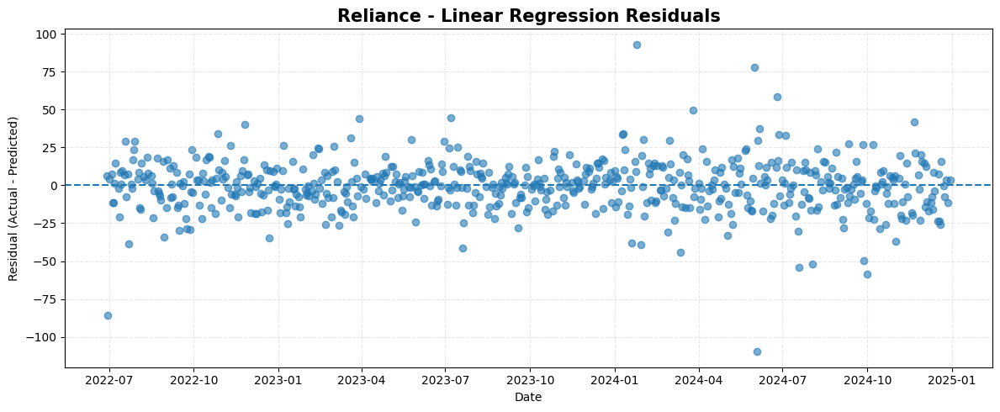

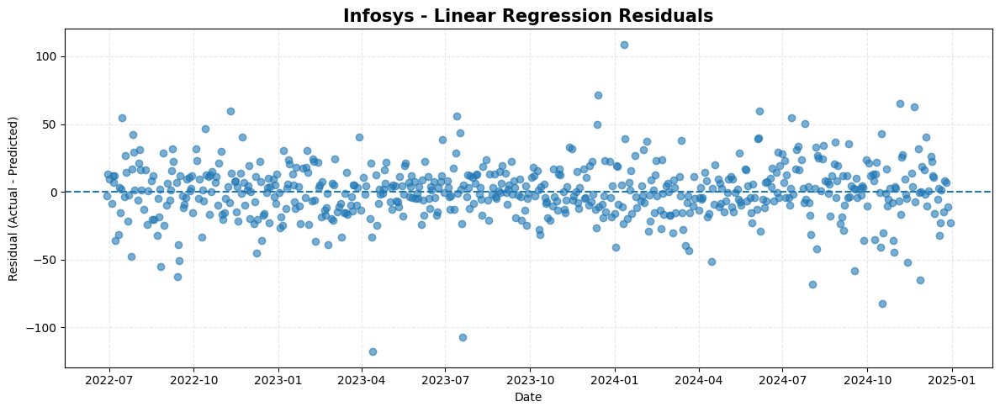

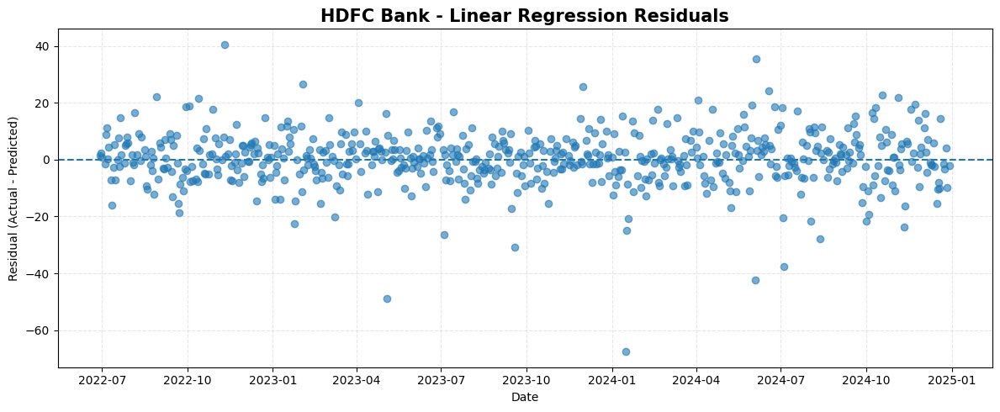

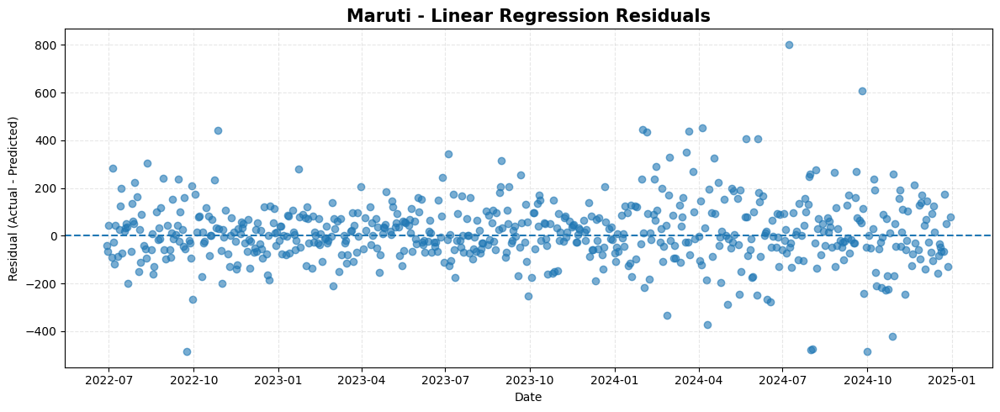

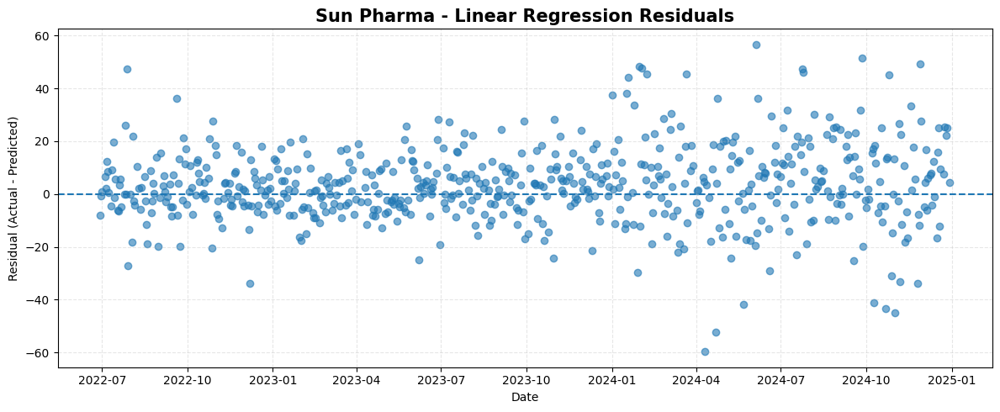

In [86]:
# Calculate and plot residuals

for name in model_datasets:

    y_true = y_test_datasets[name]
    y_pred = lr_predictions[name]

    residuals = y_true.values - y_pred

    plt.figure(figsize=(12, 5))

    plt.scatter(
        y_true.index,
        residuals,
        alpha=0.6
    )

    plt.axhline(
        y=0,
        linestyle="--",
        linewidth=1.5
    )

    plt.title(
        f"{name} - Linear Regression Residuals",
        fontsize=15,
        fontweight="bold"
    )

    plt.xlabel("Date")
    plt.ylabel("Residual (Actual - Predicted)")

    plt.grid(
        linestyle="--",
        alpha=0.3
    )

    plt.tight_layout()
    plt.show()

## 12. Random Forest Regression

Random Forest Regression is used to predict the next trading day's closing price. The model combines multiple decision trees and averages their predictions to produce the final continuous price prediction.

In [87]:
# Train Random Forest Regression models

from sklearn.ensemble import RandomForestRegressor

rf_models = {}
rf_predictions = {}
rf_results = {}

for name in model_datasets:

    model = RandomForestRegressor(
        n_estimators=200,
        max_depth=10,
        min_samples_split=5,
        min_samples_leaf=2,
        random_state=16,
        n_jobs=-1
    )

    model.fit(
        X_train_scaled[name],
        y_train_datasets[name]
    )

    y_pred = model.predict(
        X_test_scaled[name]
    )

    rf_models[name] = model
    rf_predictions[name] = y_pred

In [88]:
# Evaluate Random Forest Regression models

for name in model_datasets:

    y_true = y_test_datasets[name]
    y_pred = rf_predictions[name]

    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)

    mape = np.mean(
        np.abs((y_true - y_pred) / y_true)
    ) * 100

    r2 = r2_score(y_true, y_pred)

    rf_results[name] = {
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "MAPE": mape,
        "R²": r2
    }

rf_results_df = pd.DataFrame(rf_results).T

rf_results_df.style.format({
    "MAE": "{:.4f}",
    "MSE": "{:.2f}",
    "RMSE": "{:.4f}",
    "MAPE": "{:.2f}%",
    "R²": "{:.4f}"
})

,MAE,MSE,RMSE,MAPE,R²
Reliance,71.5787,13164.94,114.7386,5.08%,0.3856
Infosys,33.5141,3050.22,55.2288,2.12%,0.9206
HDFC Bank,17.9940,904.93,30.0821,2.23%,0.7055
Maruti,1352.7920,3594668.11,1895.9610,11.81%,-0.5443
Sun Pharma,263.1105,155041.83,393.7535,16.83%,-0.4157


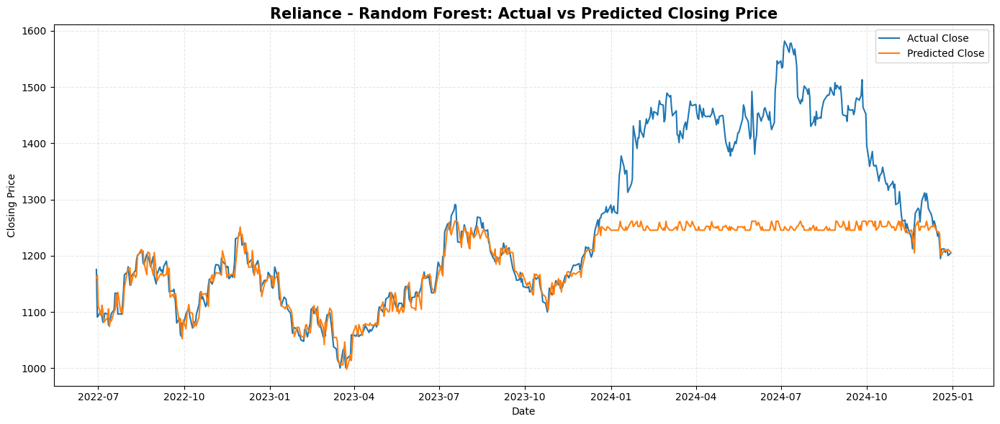

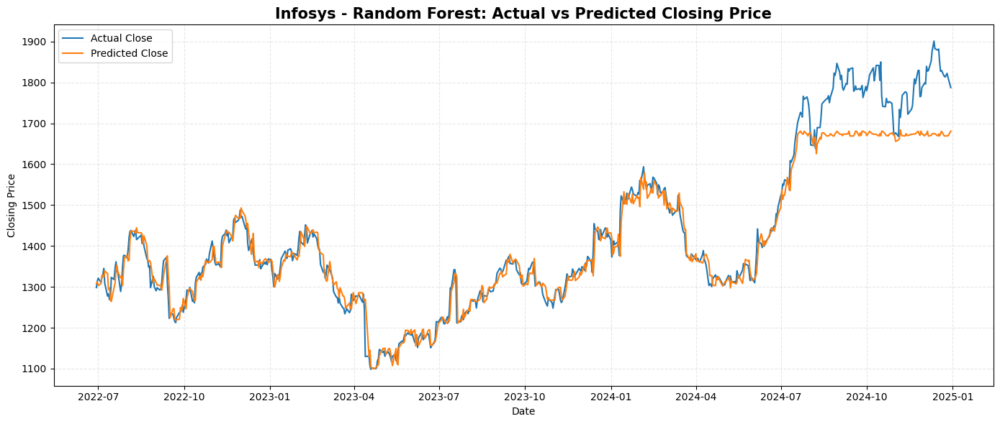

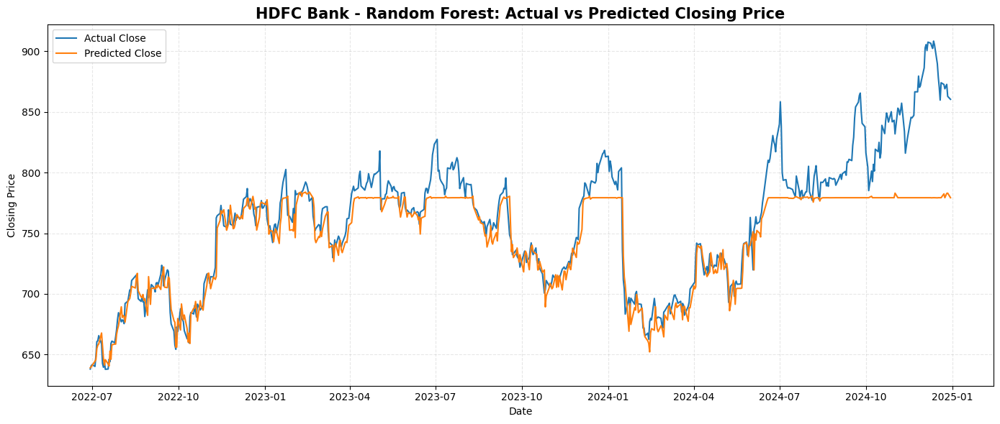

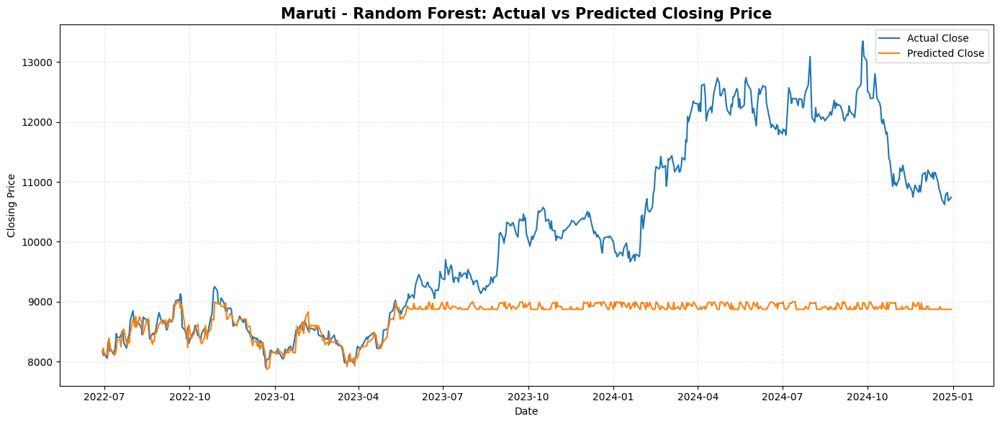

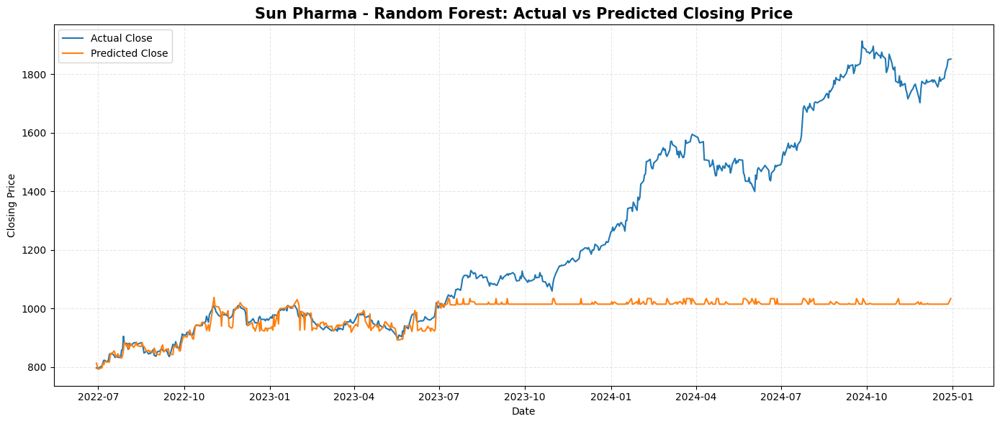

In [89]:
# Plot actual vs predicted closing prices for Random Forest

for name in model_datasets:

    y_true = y_test_datasets[name]
    y_pred = rf_predictions[name]

    plt.figure(figsize=(14, 6))

    plt.plot(
        y_true.index,
        y_true.values,
        label="Actual Close",
        linewidth=1.5
    )

    plt.plot(
        y_true.index,
        y_pred,
        label="Predicted Close",
        linewidth=1.5
    )

    plt.title(
        f"{name} - Random Forest: Actual vs Predicted Closing Price",
        fontsize=15,
        fontweight="bold"
    )

    plt.xlabel("Date")
    plt.ylabel("Closing Price")

    plt.legend()

    plt.grid(
        linestyle="--",
        alpha=0.3
    )

    plt.tight_layout()
    plt.show()

## 13. Tuned Random Forest Regression

Random Forest hyperparameters are optimized using RandomizedSearchCV with TimeSeriesSplit cross-validation. The tuning process is performed only on the training data to preserve the temporal structure and prevent information from the test period influencing model selection.

In [90]:
# Tune Random Forest Regression models

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV, TimeSeriesSplit
from scipy.stats import randint

rf_tuned_models = {}
rf_tuned_predictions = {}
rf_tuned_results = {}

param_dist = {
    "n_estimators": randint(100, 800),
    "max_depth": [None, 5, 8, 10, 15, 20],
    "min_samples_split": randint(2, 10),
    "min_samples_leaf": randint(1, 5),
    "max_features": ["sqrt", "log2", 1.0]
}

tscv = TimeSeriesSplit(n_splits=5)

for name in model_datasets:

    rf = RandomForestRegressor(
        random_state=16,
        n_jobs=-1
    )

    random_search = RandomizedSearchCV(
        estimator=rf,
        param_distributions=param_dist,
        n_iter=50,
        scoring="neg_mean_squared_error",
        cv=tscv,
        random_state=16,
        n_jobs=-1
    )

    random_search.fit(
        X_train_scaled[name],
        y_train_datasets[name]
    )

    best_model = random_search.best_estimator_

    y_pred = best_model.predict(
        X_test_scaled[name]
    )

    rf_tuned_models[name] = best_model
    rf_tuned_predictions[name] = y_pred

    rf_tuned_results[name] = {
        "Best Parameters": random_search.best_params_,
        "CV RMSE": np.sqrt(-random_search.best_score_)
    }

print("Random Forest hyperparameter tuning completed.")

Random Forest hyperparameter tuning completed.


In [91]:
# Display best Random Forest parameters

for name, result in rf_tuned_results.items():

    print(f"{name}")
    print(result["Best Parameters"])
    print(f"CV RMSE: {result['CV RMSE']:.4f}")
    print()

Reliance
{'max_depth': 20, 'max_features': 1.0, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 210}
CV RMSE: 109.8456

Infosys
{'max_depth': 15, 'max_features': 'log2', 'min_samples_leaf': 4, 'min_samples_split': 7, 'n_estimators': 186}
CV RMSE: 172.5993

HDFC Bank
{'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 6, 'n_estimators': 214}
CV RMSE: 51.0281

Maruti
{'max_depth': 20, 'max_features': 1.0, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 210}
CV RMSE: 816.2002

Sun Pharma
{'max_depth': 20, 'max_features': 'log2', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 760}
CV RMSE: 37.2857



In [92]:
# Display tuned Random Forest parameters

tuned_rf_params = []

for name, result in rf_tuned_results.items():

    row = {
        "Stock": name,
        "Best Parameters": result["Best Parameters"],
        "CV RMSE": result["CV RMSE"]
    }

    tuned_rf_params.append(row)

tuned_rf_params_df = pd.DataFrame(tuned_rf_params)

tuned_rf_params_df.style.format({
    "CV RMSE": "{:.4f}"
})

,Stock,Best Parameters,CV RMSE
0,Reliance,"{'max_depth': 20, 'max_features': 1.0, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 210}",109.8456
1,Infosys,"{'max_depth': 15, 'max_features': 'log2', 'min_samples_leaf': 4, 'min_samples_split': 7, 'n_estimators': 186}",172.5993
2,HDFC Bank,"{'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 6, 'n_estimators': 214}",51.0281
3,Maruti,"{'max_depth': 20, 'max_features': 1.0, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 210}",816.2002
4,Sun Pharma,"{'max_depth': 20, 'max_features': 'log2', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 760}",37.2857


In [93]:
# Evaluate tuned Random Forest models

for name in model_datasets:

    y_true = y_test_datasets[name]
    y_pred = rf_tuned_predictions[name]

    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)

    mape = np.mean(
        np.abs((y_true - y_pred) / y_true)
    ) * 100

    r2 = r2_score(y_true, y_pred)

    rf_tuned_results[name].update({
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "MAPE": mape,
        "R²": r2
    })

In [94]:
# Display tuned Random Forest test results

rf_tuned_results_df = pd.DataFrame({
    name: {
        "MAE": result["MAE"],
        "MSE": result["MSE"],
        "RMSE": result["RMSE"],
        "MAPE": result["MAPE"],
        "R²": result["R²"]
    }
    for name, result in rf_tuned_results.items()
}).T

rf_tuned_results_df.style.format({
    "MAE": "{:.4f}",
    "MSE": "{:.2f}",
    "RMSE": "{:.4f}",
    "MAPE": "{:.2f}%",
    "R²": "{:.4f}"
})

,MAE,MSE,RMSE,MAPE,R²
Reliance,71.2799,12992.29,113.9837,5.06%,0.3937
Infosys,33.7015,3224.93,56.7884,2.12%,0.9160
HDFC Bank,17.3327,857.23,29.2785,2.15%,0.7210
Maruti,1371.2502,3673560.68,1916.6535,11.98%,-0.5782
Sun Pharma,259.2922,151834.41,389.6594,16.55%,-0.3864


## 14. XGBoost Regression

XGBoost Regression is used to predict the next trading day's closing price using the current day's OHLCV features. The baseline model is trained using fixed hyperparameters without hyperparameter tuning.

In [95]:
# Train XGBoost Regression models

from xgboost import XGBRegressor

xgb_models = {}
xgb_predictions = {}
xgb_results = {}

for name in model_datasets:

    model = XGBRegressor(
        n_estimators=200,
        max_depth=5,
        learning_rate=0.05,
        subsample=0.8,
        colsample_bytree=0.8,
        objective="reg:squarederror",
        random_state=4,
        n_jobs=-1
    )

    model.fit(
        X_train_scaled[name],
        y_train_datasets[name]
    )

    y_pred = model.predict(
        X_test_scaled[name]
    )

    xgb_models[name] = model
    xgb_predictions[name] = y_pred

In [96]:
# Evaluate XGBoost Regression models

for name in model_datasets:

    y_true = y_test_datasets[name]
    y_pred = xgb_predictions[name]

    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)

    mape = np.mean(
        np.abs((y_true - y_pred) / y_true)
    ) * 100

    r2 = r2_score(y_true, y_pred)

    xgb_results[name] = {
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "MAPE": mape,
        "R²": r2
    }

xgb_results_df = pd.DataFrame(xgb_results).T

xgb_results_df.style.format({
    "MAE": "{:.4f}",
    "MSE": "{:.2f}",
    "RMSE": "{:.4f}",
    "MAPE": "{:.2f}%",
    "R²": "{:.4f}"
})

,MAE,MSE,RMSE,MAPE,R²
Reliance,75.9059,14729.06,121.3634,5.38%,0.3126
Infosys,34.1579,3199.97,56.5682,2.16%,0.9167
HDFC Bank,19.6550,966.34,31.0861,2.45%,0.6855
Maruti,1361.1949,3629109.94,1905.0223,11.89%,-0.5591
Sun Pharma,264.3761,154608.74,393.2032,16.99%,-0.4117


### Observation – XGBoost Regression

The baseline XGBoost model produced different levels of predictive performance across the selected stocks. Infosys achieved the strongest performance with an R² of 0.9167, while HDFC Bank achieved an R² of 0.6855. Reliance showed lower predictive performance, while Maruti and Sun Pharma produced negative R² values on the test set. Overall, the baseline XGBoost model did not outperform Linear Regression for the selected stocks.

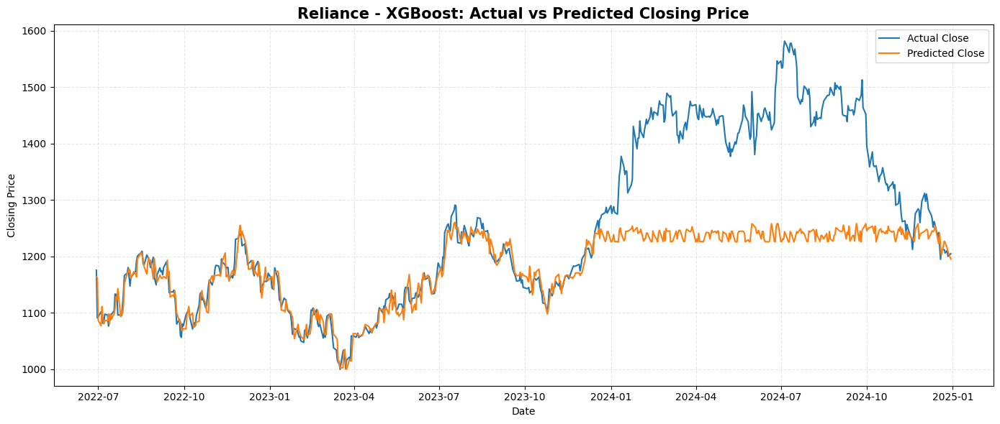

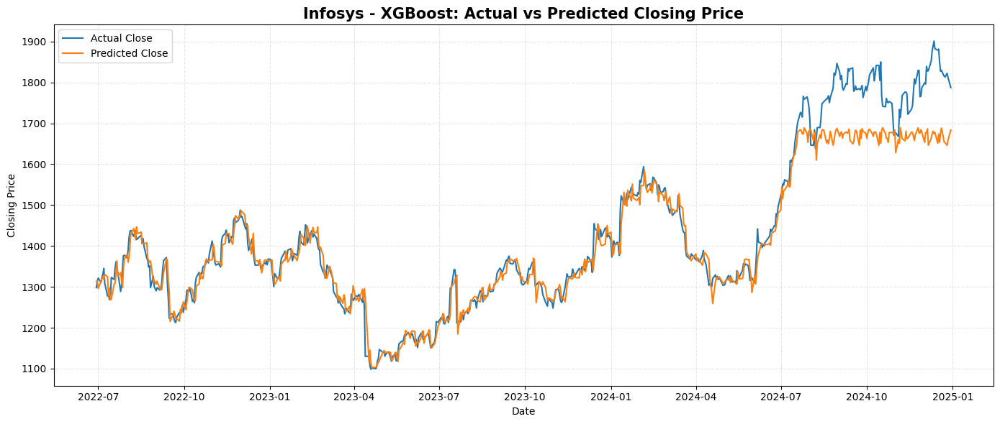

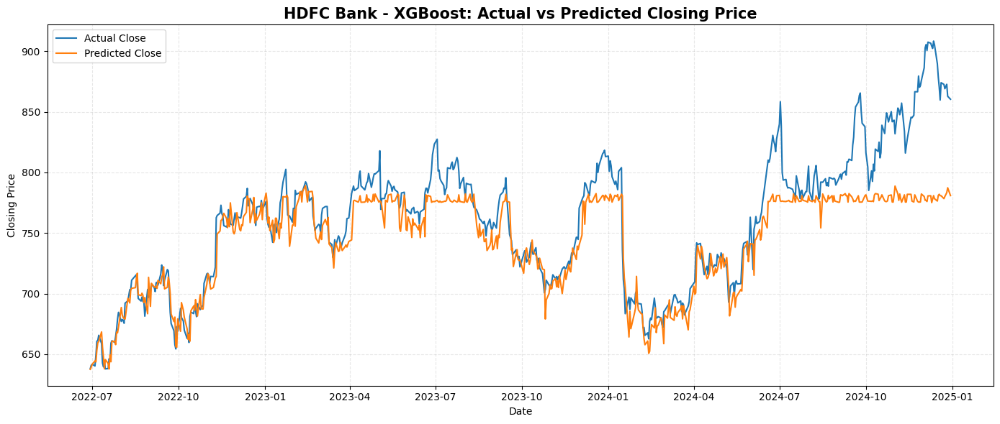

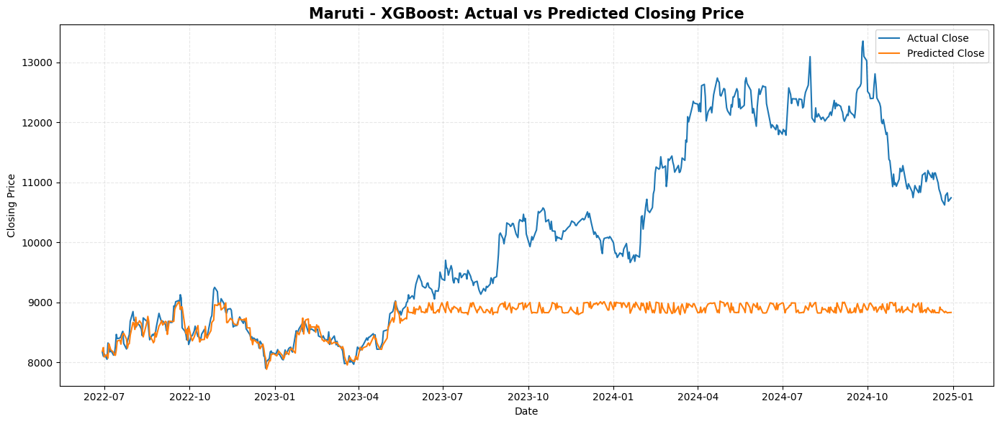

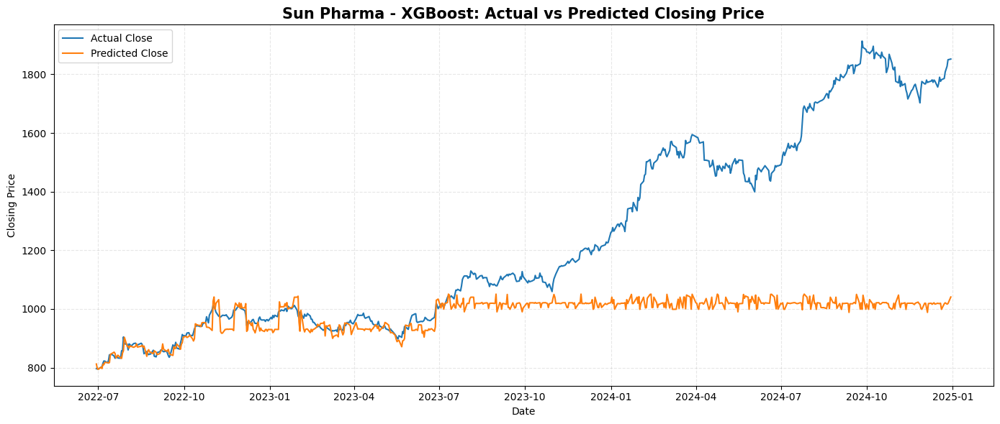

In [97]:
# Plot actual vs predicted closing prices for XGBoost

for name in model_datasets:

    y_true = y_test_datasets[name]
    y_pred = xgb_predictions[name]

    plt.figure(figsize=(14, 6))

    plt.plot(
        y_true.index,
        y_true.values,
        label="Actual Close",
        linewidth=1.5
    )

    plt.plot(
        y_true.index,
        y_pred,
        label="Predicted Close",
        linewidth=1.5
    )

    plt.title(
        f"{name} - XGBoost: Actual vs Predicted Closing Price",
        fontsize=15,
        fontweight="bold"
    )

    plt.xlabel("Date")
    plt.ylabel("Closing Price")

    plt.legend()

    plt.grid(
        linestyle="--",
        alpha=0.3
    )

    plt.tight_layout()
    plt.show()

## 15. Tuned XGBoost Regression

The XGBoost model is further optimized using randomized hyperparameter search with time-series cross-validation. The tuning process is performed only on the training data to preserve the chronological structure of the dataset and prevent information leakage from the test period.

In [98]:
# Tune XGBoost Regression models

from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV, TimeSeriesSplit
from scipy.stats import randint, uniform

xgb_tuned_models = {}
xgb_tuned_predictions = {}
xgb_tuned_results = {}

param_dist = {
    "n_estimators": randint(100, 800),
    "max_depth": randint(3, 10),
    "learning_rate": uniform(0.01, 0.19),
    "subsample": uniform(0.6, 0.4),
    "colsample_bytree": uniform(0.6, 0.4),
    "min_child_weight": randint(1, 10),
    "gamma": uniform(0, 0.5)
}

tscv = TimeSeriesSplit(n_splits=5)

for name in model_datasets:

    xgb = XGBRegressor(
    objective="reg:squarederror",
    random_state=4,
    n_jobs=1
    )

    random_search = RandomizedSearchCV(
        estimator=xgb,
        param_distributions=param_dist,
        n_iter=50,
        scoring="neg_mean_squared_error",
        cv=tscv,
        random_state=4,
        n_jobs=-1,
    )

    random_search.fit(
        X_train_scaled[name],
        y_train_datasets[name]
    )

    best_model = random_search.best_estimator_

    y_pred = best_model.predict(
        X_test_scaled[name]
    )

    xgb_tuned_models[name] = best_model
    xgb_tuned_predictions[name] = y_pred

    xgb_tuned_results[name] = {
        "Best Parameters": random_search.best_params_,
        "CV RMSE": np.sqrt(-random_search.best_score_)
    }

In [99]:
# Display tuned XGBoost parameters

tuned_xgb_params = []

for name, result in xgb_tuned_results.items():

    tuned_xgb_params.append({
        "Stock": name,
        "Best Parameters": result["Best Parameters"],
        "CV RMSE": result["CV RMSE"]
    })

tuned_xgb_params_df = pd.DataFrame(tuned_xgb_params)

tuned_xgb_params_df.style.format({
    "CV RMSE": "{:.4f}"
})

,Stock,Best Parameters,CV RMSE
0,Reliance,"{'colsample_bytree': np.float64(0.9861714366770287), 'gamma': np.float64(0.2832400199303858), 'learning_rate': np.float64(0.18869165136398966), 'max_depth': 3, 'min_child_weight': 6, 'n_estimators': 640, 'subsample': np.float64(0.7517114862053511)}",108.7249
1,Infosys,"{'colsample_bytree': np.float64(0.8218963451770234), 'gamma': np.float64(0.31246542203204886), 'learning_rate': np.float64(0.18014522155066776), 'max_depth': 3, 'min_child_weight': 6, 'n_estimators': 543, 'subsample': np.float64(0.6504726633363787)}",171.6787
2,HDFC Bank,"{'colsample_bytree': np.float64(0.6515741343608706), 'gamma': np.float64(0.4155677165379287), 'learning_rate': np.float64(0.15948309782093345), 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 514, 'subsample': np.float64(0.8667711086158504)}",51.0641
3,Maruti,"{'colsample_bytree': np.float64(0.9700612650153304), 'gamma': np.float64(0.4351532382427587), 'learning_rate': np.float64(0.16869877434613006), 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 173, 'subsample': np.float64(0.6915050671851714)}",821.9642
4,Sun Pharma,"{'colsample_bytree': np.float64(0.7699169017981454), 'gamma': np.float64(0.3778246422232236), 'learning_rate': np.float64(0.05778470819308203), 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 449, 'subsample': np.float64(0.8252612939719703)}",37.9695


In [100]:
# Evaluate tuned XGBoost models

for name in model_datasets:

    y_true = y_test_datasets[name]
    y_pred = xgb_tuned_predictions[name]

    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)

    mape = np.mean(
        np.abs((y_true - y_pred) / y_true)
    ) * 100

    r2 = r2_score(y_true, y_pred)

    xgb_tuned_results[name].update({
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "MAPE": mape,
        "R²": r2
    })# Evaluate tuned XGBoost models

for name in model_datasets:

    y_true = y_test_datasets[name]
    y_pred = xgb_tuned_predictions[name]

    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)

    mape = np.mean(
        np.abs((y_true - y_pred) / y_true)
    ) * 100

    r2 = r2_score(y_true, y_pred)

    xgb_tuned_results[name].update({
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "MAPE": mape,
        "R²": r2
    })

In [101]:
# Display tuned XGBoost results

xgb_tuned_results_df = pd.DataFrame({
    name: {
        "MAE": result["MAE"],
        "MSE": result["MSE"],
        "RMSE": result["RMSE"],
        "MAPE": result["MAPE"],
        "R²": result["R²"]
    }
    for name, result in xgb_tuned_results.items()
}).T

xgb_tuned_results_df.style.format({
    "MAE": "{:.4f}",
    "MSE": "{:.2f}",
    "RMSE": "{:.4f}",
    "MAPE": "{:.2f}%",
    "R²": "{:.4f}"
})

,MAE,MSE,RMSE,MAPE,R²
Reliance,76.8972,14608.74,120.8666,5.48%,0.3182
Infosys,35.6951,3324.96,57.6625,2.27%,0.9134
HDFC Bank,22.9758,1168.00,34.1760,2.87%,0.6199
Maruti,1351.9593,3589809.84,1894.6794,11.81%,-0.5422
Sun Pharma,264.5624,154176.68,392.6534,17.02%,-0.4078


### Observation – Tuned XGBoost Regression

Hyperparameter tuning produced mixed results across the selected stocks. The tuned XGBoost model showed slight improvements for Reliance, Maruti, and Sun Pharma, while performance decreased for Infosys and HDFC Bank. Overall, hyperparameter tuning did not consistently improve XGBoost performance across the selected stocks.

## 16. LSTM Regression

Long Short-Term Memory (LSTM) is a recurrent neural network designed to learn patterns from sequential data. In this study, LSTM is used to predict the next trading day's closing price from the current day's OHLCV features.

#### 16.1 Prepare LSTM data

In [102]:
# Create LSTM sequences

window_size = 1

X_train_lstm = {}
X_test_lstm = {}

y_train_lstm = {}
y_test_lstm = {}


for name in model_datasets:

    X_train_seq = []
    y_train_seq = []

    for i in range(window_size, len(X_train_scaled[name])):

        X_train_seq.append(
            X_train_scaled[name][i-window_size:i]
        )

        y_train_seq.append(
            y_train_scaled[name][i]
        )


    X_test_seq = []
    y_test_seq = []

    for i in range(window_size, len(X_test_scaled[name])):

        X_test_seq.append(
            X_test_scaled[name][i-window_size:i]
        )

        y_test_seq.append(
            y_test_scaled[name][i]
        )


    X_train_lstm[name] = np.array(X_train_seq)
    y_train_lstm[name] = np.array(y_train_seq)

    X_test_lstm[name] = np.array(X_test_seq)
    y_test_lstm[name] = np.array(y_test_seq)


print()
print("LSTM SEQUENCES CREATED")
print()

for name in model_datasets:

    print(
        f"{name}: "
        f"Train {X_train_lstm[name].shape} | "
        f"Test {X_test_lstm[name].shape}"
    )


LSTM SEQUENCES CREATED

Reliance: Train (1848, 1, 5) | Test (616, 1, 5)
Infosys: Train (1848, 1, 5) | Test (616, 1, 5)
HDFC Bank: Train (1848, 1, 5) | Test (616, 1, 5)
Maruti: Train (1848, 1, 5) | Test (616, 1, 5)
Sun Pharma: Train (1848, 1, 5) | Test (616, 1, 5)


In [103]:
# Check LSTM input shapes

for name in model_datasets:

    print(
        f"{name}: "
        f"Train {X_train_lstm[name].shape}, "
        f"Test {X_test_lstm[name].shape}"
    )

Reliance: Train (1848, 1, 5), Test (616, 1, 5)
Infosys: Train (1848, 1, 5), Test (616, 1, 5)
HDFC Bank: Train (1848, 1, 5), Test (616, 1, 5)
Maruti: Train (1848, 1, 5), Test (616, 1, 5)
Sun Pharma: Train (1848, 1, 5), Test (616, 1, 5)


In [104]:
# Train LSTM models and store training history

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam

lstm_models = {}
lstm_predictions = {}
lstm_results = {}
lstm_histories = {}

for name in model_datasets:

    model = Sequential([

        LSTM(
            64,
            return_sequences=True,
            input_shape=(
                X_train_lstm[name].shape[1],
                X_train_lstm[name].shape[2]
            )
        ),

        Dropout(0.2),

        LSTM(32),

        Dropout(0.1),

        Dense(16, activation="relu"),

        Dense(1)
    ])

    model.compile(
        optimizer=Adam(learning_rate=0.001),
        loss="mse",
        metrics=[
            "mae",
            "root_mean_squared_error"
        ]
    )

    early_stopping = EarlyStopping(
        monitor="val_loss",
        patience=10,
        restore_best_weights=True
    )

    history = model.fit(
        X_train_lstm[name],
        y_train_lstm[name],
        validation_split=0.2,
        epochs=100,
        batch_size=32,
        callbacks=[early_stopping],
        verbose=1
    )

    y_pred = model.predict(
        X_test_lstm[name],
        verbose=0
    ).flatten()

    lstm_models[name] = model
    lstm_predictions[name] = y_pred
    lstm_histories[name] = history

print("LSTM TRAINING COMPLETED")

c:\Users\SAI\AppData\Local\Programs\Python\Python313\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
47/47 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.0434 - mae: 0.1562 - root_mean_squared_error: 0.2083 - val_loss: 0.0730 - val_mae: 0.2642 - val_root_mean_squared_error: 0.2702
Epoch 2/100
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0054 - mae: 0.0569 - root_mean_squared_error: 0.0736 - val_loss: 0.0026 - val_mae: 0.0390 - val_root_mean_squared_error: 0.0513
Epoch 3/100
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0014 - mae: 0.0255 - root_mean_squared_error: 0.0378 - val_loss: 0.0021 - val_mae: 0.0349 - val_root_mean_squared_error: 0.0455
Epoch 4/100
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012 - mae: 0.0223 - root_mean_squared_error: 0.0351 - val_loss: 9.2785e-04 - val_mae: 0.0231 - val_root_mean_squared_error: 0.0305
Epoch 5/100
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 9.6230e-04 - mae: 0.0196 - root_mean_squared_error: 0.0310 - val_loss: 7.2956e-04 - val_mae: 0.0219 - val_root_mean_squared_error: 0.0270
Epoch 6/100
47/47 ━━━━━━━━━━━━━━━━━━━━ 

In [105]:
# Evaluate LSTM models after inverse scaling

lstm_results = {}

lstm_actual_prices = {}
lstm_predicted_prices = {}

for name in model_datasets:

    y_pred_scaled = lstm_predictions[name]

    y_true_scaled = y_test_lstm[name]

    # Convert back to original price scale
    y_pred = target_scalers[name].inverse_transform(
        y_pred_scaled.reshape(-1, 1)
    ).flatten()

    y_true = target_scalers[name].inverse_transform(
        y_true_scaled.reshape(-1, 1)
    ).flatten()

    # Store original-scale values
    lstm_predicted_prices[name] = y_pred
    lstm_actual_prices[name] = y_true

    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)

    mape = np.mean(
        np.abs((y_true - y_pred) / y_true)
    ) * 100

    r2 = r2_score(y_true, y_pred)

    lstm_results[name] = {
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "MAPE": mape,
        "R²": r2
    }

lstm_results_df = pd.DataFrame(lstm_results).T

lstm_results_df.style.format({
    "MAE": "{:.4f}",
    "MSE": "{:.2f}",
    "RMSE": "{:.4f}",
    "MAPE": "{:.2f}%",
    "R²": "{:.4f}"
})

,MAE,MSE,RMSE,MAPE,R²
Reliance,18.0235,583.88,24.1637,1.45%,0.9728
Infosys,24.4257,1080.06,32.8643,1.73%,0.9719
HDFC Bank,11.3249,221.54,14.8841,1.48%,0.9275
Maruti,552.4587,545060.16,738.2819,4.93%,0.7656
Sun Pharma,53.0231,6318.22,79.4872,3.52%,0.9422


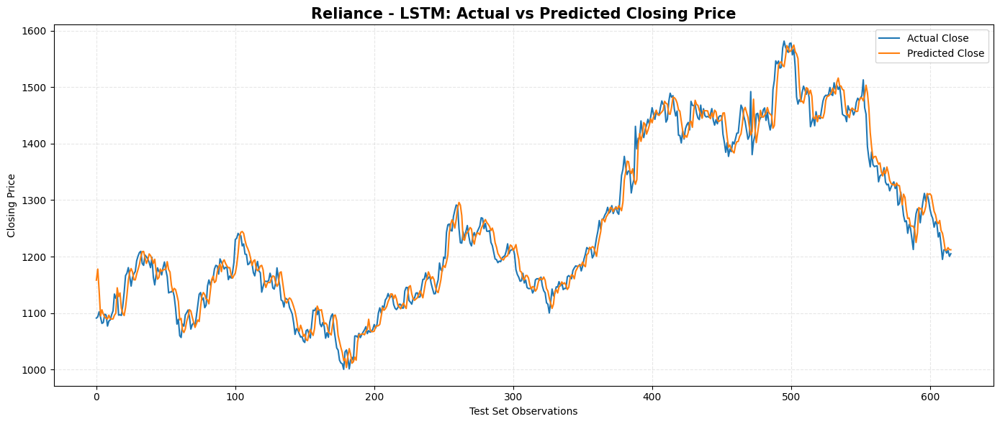

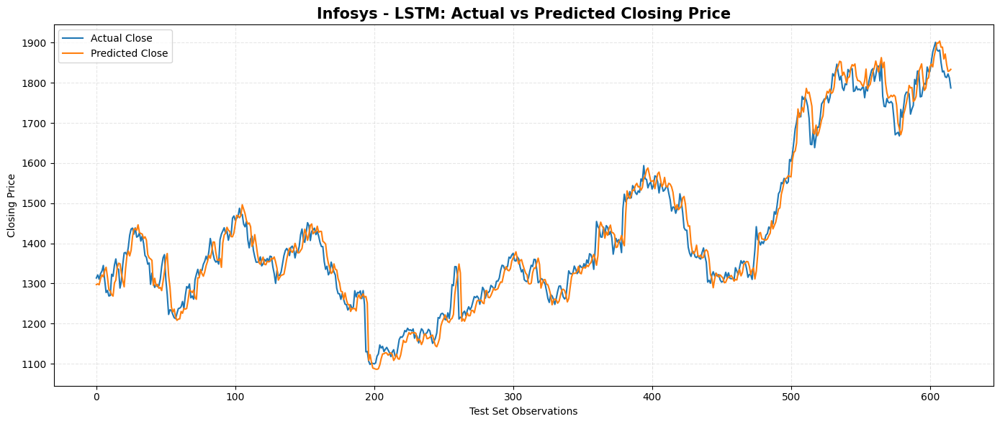

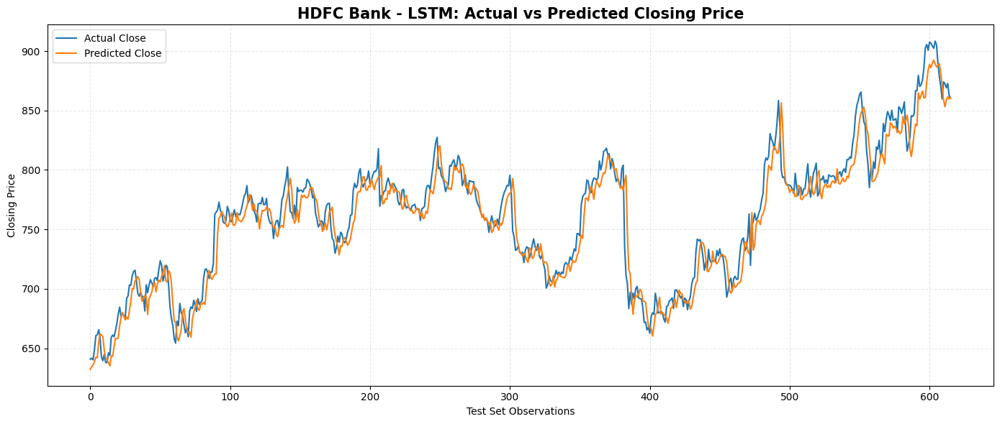

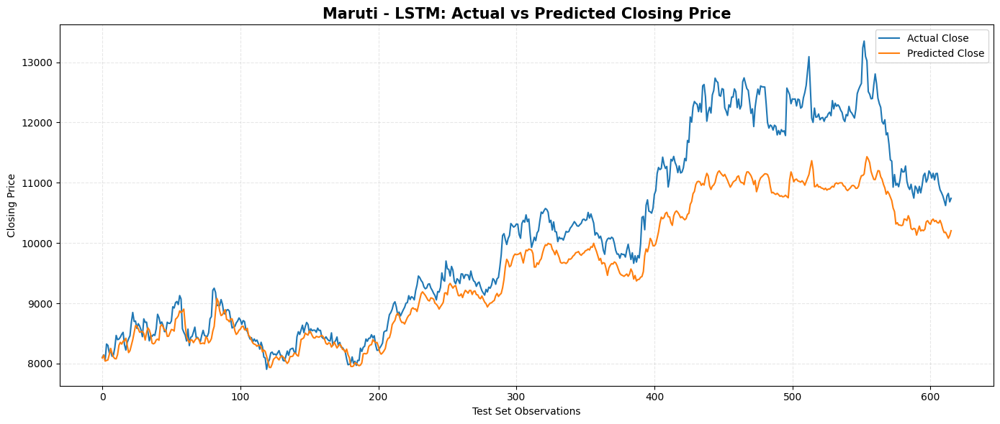

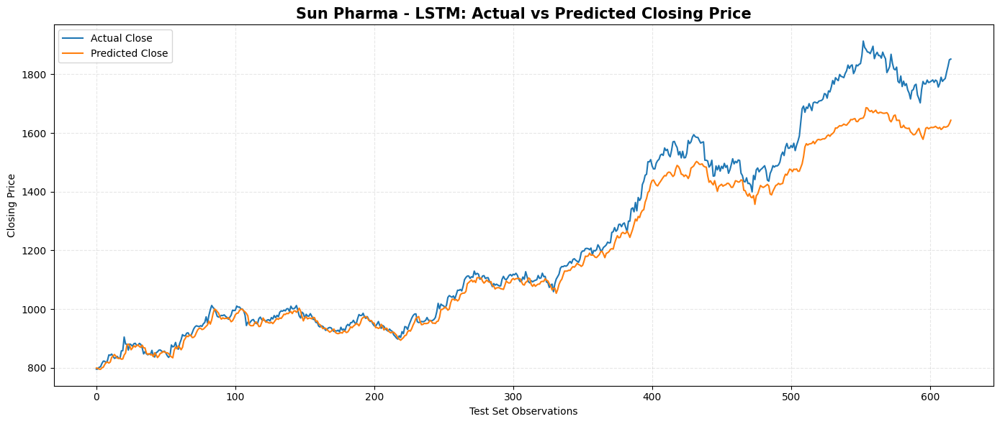

In [106]:
# Actual vs Predicted Closing Price - LSTM

for name in model_datasets:

    y_true = lstm_actual_prices[name]
    y_pred = lstm_predicted_prices[name]

    plt.figure(figsize=(14, 6))

    plt.plot(
        y_true,
        label="Actual Close",
        linewidth=1.5
    )

    plt.plot(
        y_pred,
        label="Predicted Close",
        linewidth=1.5
    )

    plt.title(
        f"{name} - LSTM: Actual vs Predicted Closing Price",
        fontsize=15,
        fontweight="bold"
    )

    plt.xlabel("Test Set Observations")
    plt.ylabel("Closing Price")

    plt.legend()

    plt.grid(
        linestyle="--",
        alpha=0.3
    )

    plt.tight_layout()
    plt.show()

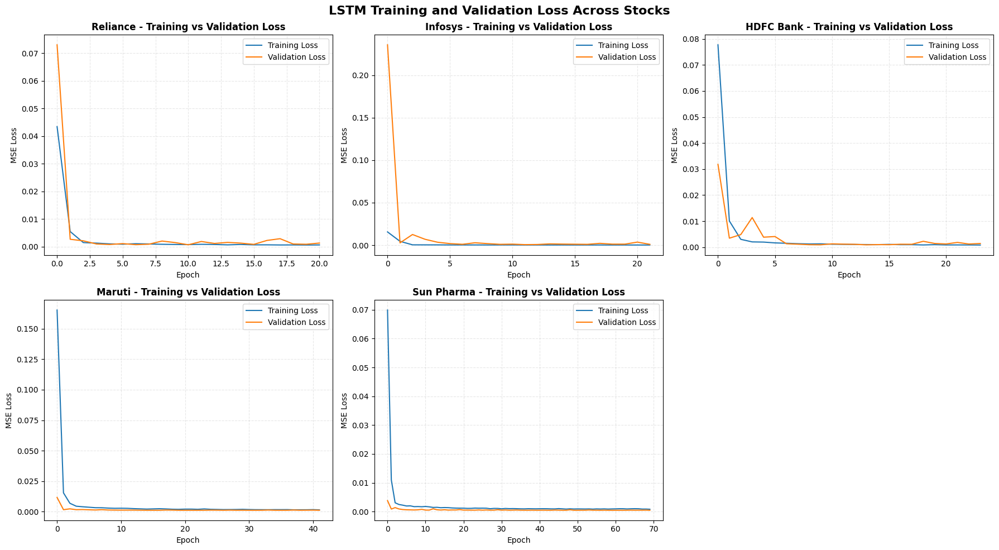

In [107]:
# LSTM Training and Validation Loss

import matplotlib.pyplot as plt

fig, axes = plt.subplots(
    2, 3,
    figsize=(18, 10)
)

axes = axes.flatten()

for i, name in enumerate(model_datasets):

    history = lstm_histories[name].history

    axes[i].plot(
        history["loss"],
        label="Training Loss",
        linewidth=1.5
    )

    axes[i].plot(
        history["val_loss"],
        label="Validation Loss",
        linewidth=1.5
    )

    axes[i].set_title(
        f"{name} - Training vs Validation Loss",
        fontsize=12,
        fontweight="bold"
    )

    axes[i].set_xlabel("Epoch")
    axes[i].set_ylabel("MSE Loss")
    axes[i].legend()
    axes[i].grid(
        linestyle="--",
        alpha=0.3
    )

# Remove unused sixth subplot
fig.delaxes(axes[5])

fig.suptitle(
    "LSTM Training and Validation Loss Across Stocks",
    fontsize=16,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

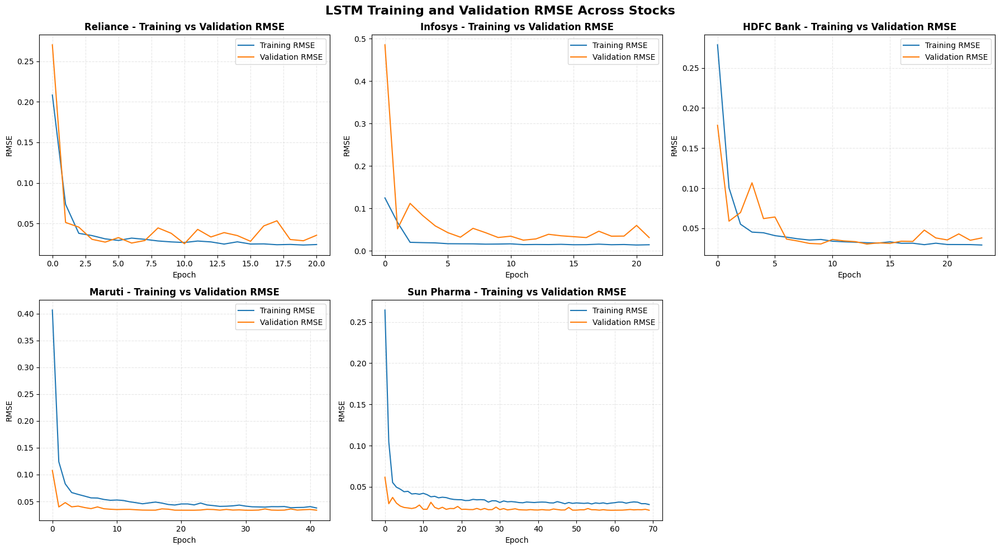

In [108]:
# LSTM Training and Validation RMSE

fig, axes = plt.subplots(
    2, 3,
    figsize=(18, 10)
)

axes = axes.flatten()

for i, name in enumerate(model_datasets):

    history = lstm_histories[name].history

    axes[i].plot(
        history["root_mean_squared_error"],
        label="Training RMSE",
        linewidth=1.5
    )

    axes[i].plot(
        history["val_root_mean_squared_error"],
        label="Validation RMSE",
        linewidth=1.5
    )

    axes[i].set_title(
        f"{name} - Training vs Validation RMSE",
        fontsize=12,
        fontweight="bold"
    )

    axes[i].set_xlabel("Epoch")
    axes[i].set_ylabel("RMSE")
    axes[i].legend()
    axes[i].grid(
        linestyle="--",
        alpha=0.3
    )

fig.delaxes(axes[5])

fig.suptitle(
    "LSTM Training and Validation RMSE Across Stocks",
    fontsize=16,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

## 18. Hyperparameter Tuning of LSTM

To improve the performance of the baseline LSTM model, hyperparameter tuning was performed using Keras Tuner.

The tuning process evaluates different combinations of LSTM units, dropout rates, dense-layer units, and learning rates. The best configuration is selected based on validation loss.

The same 1-day input window is retained to ensure a fair comparison with the baseline LSTM model.

#### 18.1 - Keras Tuner Setup

In [109]:
# Keras Tuner setup

import keras_tuner as kt

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam

lstm_tuned_models = {}
lstm_tuned_predictions = {}
lstm_tuned_results = {}

#### 18.2

#### 18.3 - Run Keras Tuner

In [111]:
# LSTM Hyperparameter Tuning

import keras_tuner as kt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

lstm_tuned_models = {}
lstm_tuned_predictions = {}
lstm_tuned_results = {}

for name in model_datasets:

    X_train_seq = X_train_lstm[name]
    y_train_seq = y_train_lstm[name]

    def build_model(hp):

        model = Sequential([

            LSTM(
                units=hp.Choice(
                    "lstm1_units",
                    [32, 64, 128]
                ),
                return_sequences=True,
                input_shape=(
                    X_train_seq.shape[1],
                    X_train_seq.shape[2]
                )
            ),

            Dropout(
                hp.Choice(
                    "dropout1",
                    [0.1, 0.2, 0.3, 0.4]
                )
            ),

            LSTM(
                units=hp.Choice(
                    "lstm2_units",
                    [16, 32, 64]
                )
            ),

            Dropout(
                hp.Choice(
                    "dropout2",
                    [0.1, 0.2, 0.3, 0.4]
                )
            ),

            Dense(
                hp.Choice(
                    "dense_units",
                    [8, 16, 32]
                ),
                activation="relu"
            ),

            Dense(1)
        ])

        model.compile(
            optimizer=Adam(
                learning_rate=hp.Choice(
                    "learning_rate",
                    [1e-2, 1e-3, 5e-4, 1e-4]
                )
            ),
            loss="mse",
            metrics=[
                "mae",
                "root_mean_squared_error"
            ]
        )

        return model


    tuner = kt.RandomSearch(
        build_model,
        objective="val_loss",
        max_trials=20,
        executions_per_trial=1,
        directory="lstm_tuning",
        project_name=f"lstm_{name.replace(' ', '_')}",
        overwrite=False
    )
    
    reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
    )


    early_stopping = EarlyStopping(
        monitor="val_loss",
        patience=10,
        restore_best_weights=True
    )


    print(f"STARTING TUNING: {name}")
    print()


    tuner.search(
        X_train_seq,
        y_train_seq,
        validation_split=0.2,
        epochs=100,
        batch_size=32,
        callbacks=[reduce_lr, early_stopping],
        verbose=1
    )


    # Get the best model

    best_model = tuner.get_best_models(
        num_models=1
    )[0]


    # Get the best hyperparameters

    best_hp = tuner.get_best_hyperparameters(
        num_trials=1
    )[0]


    # Store the best model

    lstm_tuned_models[name] = best_model


    # Store the best parameters

    lstm_tuned_results[name] = {
        "Best Parameters": best_hp.values
    }


    print()
    print(f"BEST PARAMETERS: {name}")
    print()

    for parameter, value in best_hp.values.items():
        print(f"{parameter}: {value}")

    print()

Reloading Tuner from lstm_tuning\lstm_Reliance\tuner0.json
STARTING TUNING: Reliance



c:\Users\SAI\AppData\Local\Programs\Python\Python313\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\SAI\AppData\Local\Programs\Python\Python313\Lib\site-packages\keras\src\saving\saving_lib.py:843: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 22 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



BEST PARAMETERS: Reliance

lstm1_units: 128
dropout1: 0.4
lstm2_units: 16
dropout2: 0.3
dense_units: 8
learning_rate: 0.001

Reloading Tuner from lstm_tuning\lstm_Infosys\tuner0.json
STARTING TUNING: Infosys


BEST PARAMETERS: Infosys

lstm1_units: 32
dropout1: 0.3
lstm2_units: 32
dropout2: 0.1
dense_units: 8
learning_rate: 0.001

Reloading Tuner from lstm_tuning\lstm_HDFC_Bank\tuner0.json
STARTING TUNING: HDFC Bank


BEST PARAMETERS: HDFC Bank

lstm1_units: 128
dropout1: 0.4
lstm2_units: 64
dropout2: 0.4
dense_units: 8
learning_rate: 0.01

Reloading Tuner from lstm_tuning\lstm_Maruti\tuner0.json
STARTING TUNING: Maruti


BEST PARAMETERS: Maruti

lstm1_units: 32
dropout1: 0.2
lstm2_units: 64
dropout2: 0.3
dense_units: 32
learning_rate: 0.01

Reloading Tuner from lstm_tuning\lstm_Sun_Pharma\tuner0.json
STARTING TUNING: Sun Pharma


BEST PARAMETERS: Sun Pharma

lstm1_units: 64
dropout1: 0.2
lstm2_units: 64
dropout2: 0.1
dense_units: 16
learning_rate: 0.01



In [112]:
print(lstm_tuned_models.keys())

dict_keys(['Reliance', 'Infosys', 'HDFC Bank', 'Maruti', 'Sun Pharma'])


In [113]:
# Generate predictions from tuned LSTM models

for name in model_datasets:

    y_pred_scaled = lstm_tuned_models[name].predict(
        X_test_lstm[name],
        verbose=0
    ).flatten()

    lstm_tuned_predictions[name] = y_pred_scaled

print()
print("TUNED LSTM PREDICTIONS GENERATED")
print()


TUNED LSTM PREDICTIONS GENERATED



In [114]:
# Evaluate tuned LSTM models

lstm_tuned_actual_prices = {}
lstm_tuned_predicted_prices = {}

for name in model_datasets:

    # Scaled values
    y_pred_scaled = lstm_tuned_predictions[name]
    y_true_scaled = y_test_lstm[name]

    # Inverse transform to original price scale
    y_pred = target_scalers[name].inverse_transform(
        y_pred_scaled.reshape(-1, 1)
    ).flatten()

    y_true = target_scalers[name].inverse_transform(
        y_true_scaled.reshape(-1, 1)
    ).flatten()

    # Store original-scale values
    lstm_tuned_predicted_prices[name] = y_pred
    lstm_tuned_actual_prices[name] = y_true

    # Evaluation metrics
    mae = mean_absolute_error(y_true, y_pred)

    mse = mean_squared_error(y_true, y_pred)

    rmse = np.sqrt(mse)

    mape = np.mean(
        np.abs((y_true - y_pred) / y_true)
    ) * 100

    r2 = r2_score(y_true, y_pred)

    lstm_tuned_results[name].update({
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "MAPE": mape,
        "R²": r2
    })


print()
print("TUNED LSTM EVALUATION COMPLETED")
print()


TUNED LSTM EVALUATION COMPLETED



In [115]:
# Tuned LSTM results

tuned_lstm_results_df = pd.DataFrame(
    {
        name: {
            "MAE": lstm_tuned_results[name]["MAE"],
            "MSE": lstm_tuned_results[name]["MSE"],
            "RMSE": lstm_tuned_results[name]["RMSE"],
            "MAPE": lstm_tuned_results[name]["MAPE"],
            "R²": lstm_tuned_results[name]["R²"]
        }
        for name in model_datasets
    }
).T

tuned_lstm_results_df.style.format({
    "MAE": "{:.4f}",
    "MSE": "{:.2f}",
    "RMSE": "{:.4f}",
    "MAPE": "{:.2f}%",
    "R²": "{:.4f}"
})

,MAE,MSE,RMSE,MAPE,R²
Reliance,18.1103,581.86,24.1218,1.45%,0.9729
Infosys,23.5400,1021.39,31.9593,1.65%,0.9734
HDFC Bank,17.0286,472.35,21.7335,2.17%,0.8453
Maruti,485.6665,416012.29,644.9901,4.36%,0.8211
Sun Pharma,155.3637,55649.13,235.9007,9.96%,0.4912


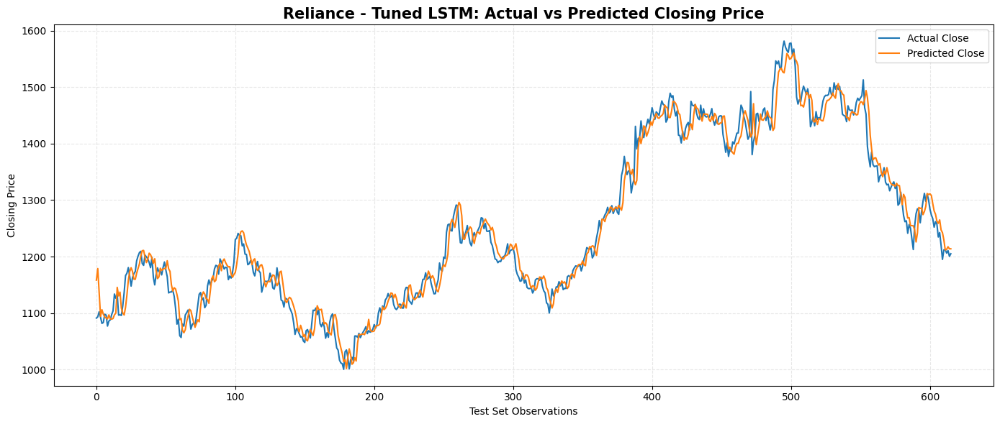

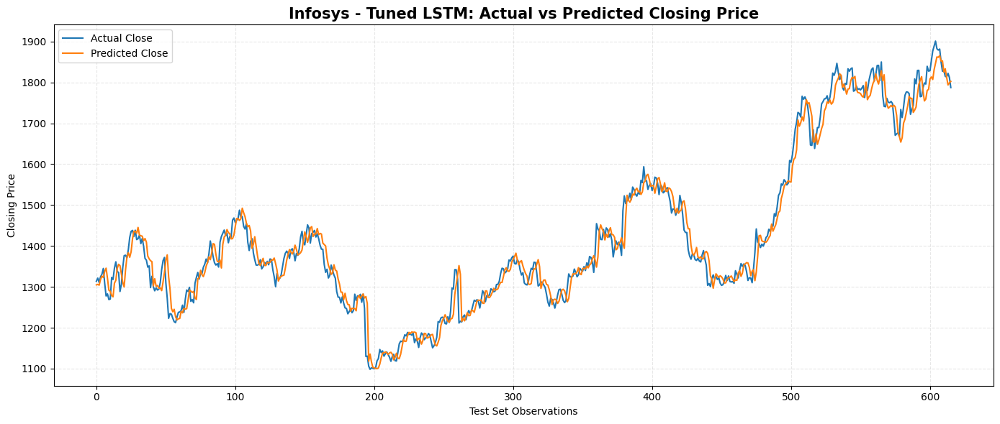

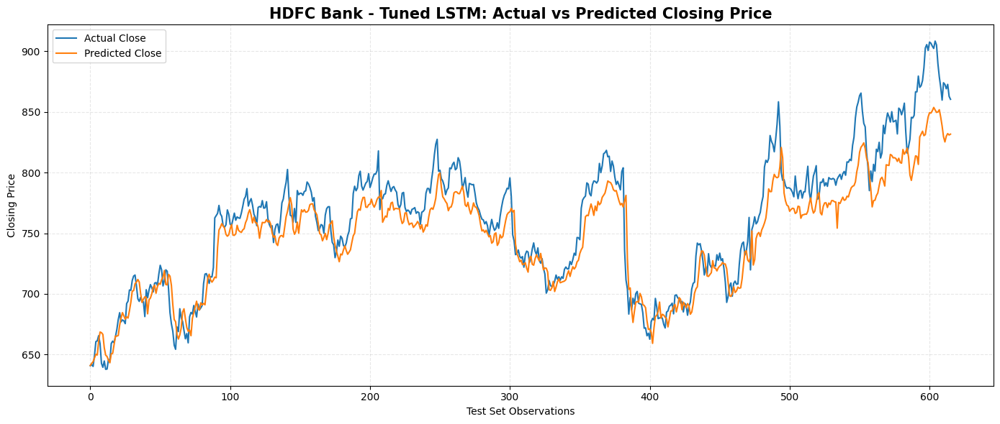

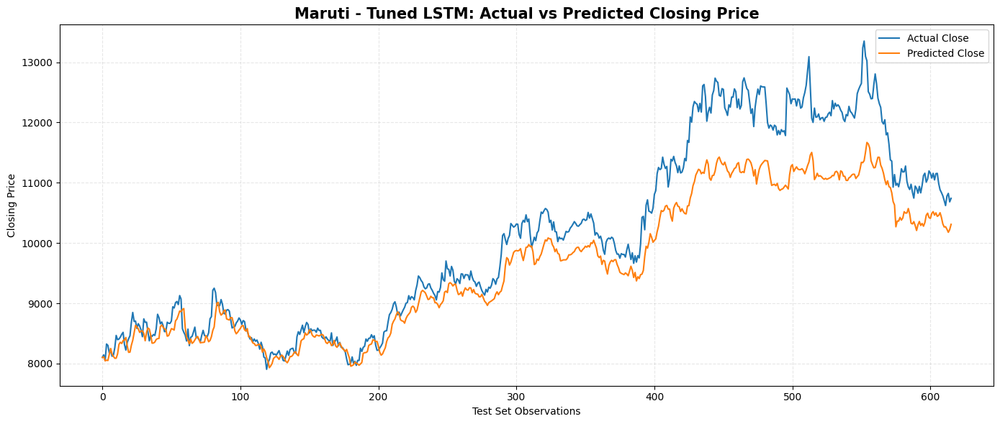

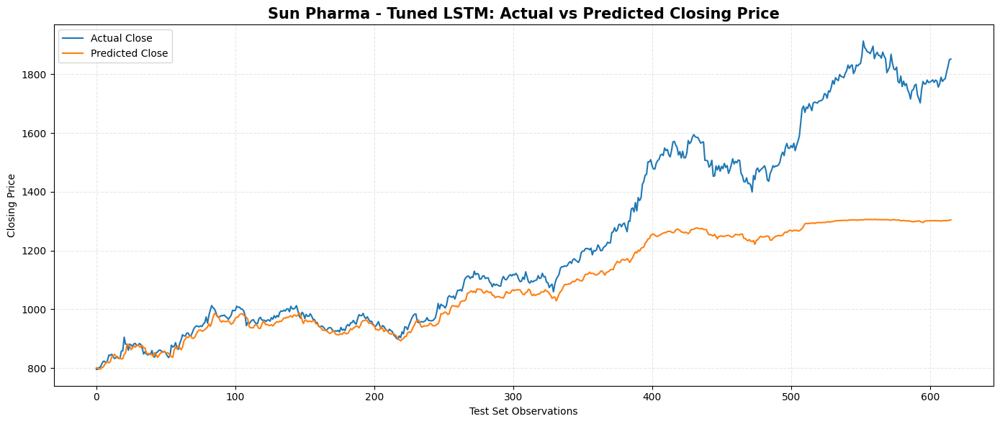

In [116]:
# Actual vs Predicted Closing Price - Tuned LSTM

for name in model_datasets:

    y_true = lstm_tuned_actual_prices[name]
    y_pred = lstm_tuned_predicted_prices[name]

    plt.figure(figsize=(14, 6))

    plt.plot(
        y_true,
        label="Actual Close",
        linewidth=1.5
    )

    plt.plot(
        y_pred,
        label="Predicted Close",
        linewidth=1.5
    )

    plt.title(
        f"{name} - Tuned LSTM: Actual vs Predicted Closing Price",
        fontsize=15,
        fontweight="bold"
    )

    plt.xlabel("Test Set Observations")
    plt.ylabel("Closing Price")

    plt.legend()

    plt.grid(
        linestyle="--",
        alpha=0.3
    )

    plt.tight_layout()
    plt.show()

In [117]:
# Train best tuned LSTM models and save training history

from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

lstm_tuned_histories = {}

for name in model_datasets:

    X_train_seq = X_train_lstm[name]
    y_train_seq = y_train_lstm[name]

    best_params = lstm_tuned_results[name]["Best Parameters"]

    model = Sequential([

        LSTM(
            best_params["lstm1_units"],
            return_sequences=True,
            input_shape=(
                X_train_seq.shape[1],
                X_train_seq.shape[2]
            )
        ),

        Dropout(
            best_params["dropout1"]
        ),

        LSTM(
            best_params["lstm2_units"]
        ),

        Dropout(
            best_params["dropout2"]
        ),

        Dense(
            best_params["dense_units"],
            activation="relu"
        ),

        Dense(1)
    ])

    model.compile(
        optimizer=Adam(
            learning_rate=best_params["learning_rate"]
        ),
        loss="mse",
        metrics=[
            "mae",
            "root_mean_squared_error"
        ]
    )

    reduce_lr = ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.5,
        patience=5,
        min_lr=1e-6,
        verbose=0
    )

    early_stopping = EarlyStopping(
        monitor="val_loss",
        patience=10,
        restore_best_weights=True
    )

    print("=" * 55)
    print(f"TRAINING BEST TUNED LSTM - {name}")
    print("=" * 55)

    history = model.fit(
        X_train_seq,
        y_train_seq,
        validation_split=0.2,
        epochs=100,
        batch_size=32,
        callbacks=[
            reduce_lr,
            early_stopping
        ],
        verbose=0
    )

    lstm_tuned_histories[name] = history

    lstm_tuned_models[name] = model

print("=" * 55)
print("TUNED LSTM HISTORIES SAVED")
print("=" * 55)

c:\Users\SAI\AppData\Local\Programs\Python\Python313\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


TRAINING BEST TUNED LSTM - Reliance
TRAINING BEST TUNED LSTM - Infosys
TRAINING BEST TUNED LSTM - HDFC Bank
TRAINING BEST TUNED LSTM - Maruti
TRAINING BEST TUNED LSTM - Sun Pharma
TUNED LSTM HISTORIES SAVED


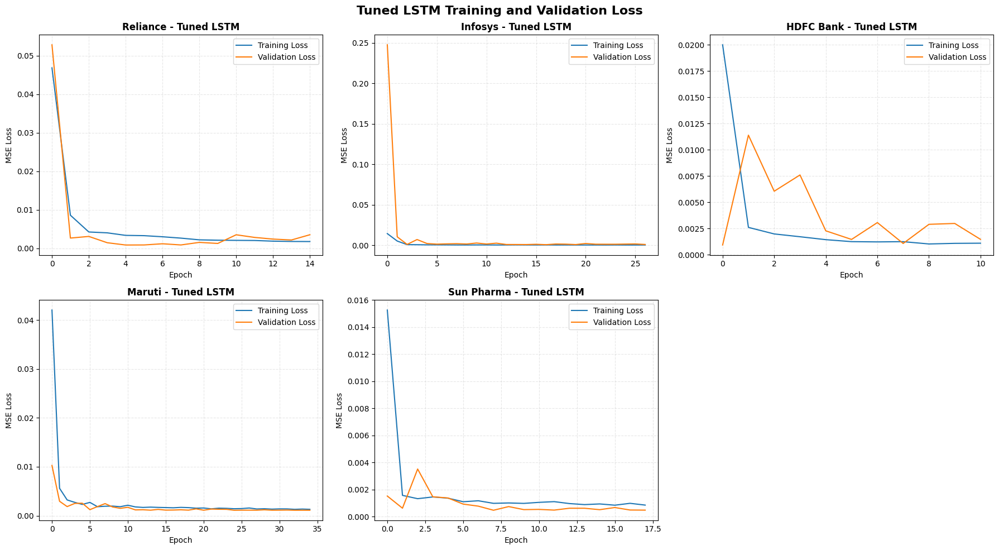

In [118]:
# Tuned LSTM Training vs Validation Loss

fig, axes = plt.subplots(
    2, 3,
    figsize=(18, 10)
)

axes = axes.flatten()

for i, name in enumerate(model_datasets):

    history = lstm_tuned_histories[name].history

    axes[i].plot(
        history["loss"],
        label="Training Loss",
        linewidth=1.5
    )

    axes[i].plot(
        history["val_loss"],
        label="Validation Loss",
        linewidth=1.5
    )

    axes[i].set_title(
        f"{name} - Tuned LSTM",
        fontsize=12,
        fontweight="bold"
    )

    axes[i].set_xlabel("Epoch")
    axes[i].set_ylabel("MSE Loss")

    axes[i].legend()

    axes[i].grid(
        linestyle="--",
        alpha=0.3
    )

fig.delaxes(axes[5])

fig.suptitle(
    "Tuned LSTM Training and Validation Loss",
    fontsize=16,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

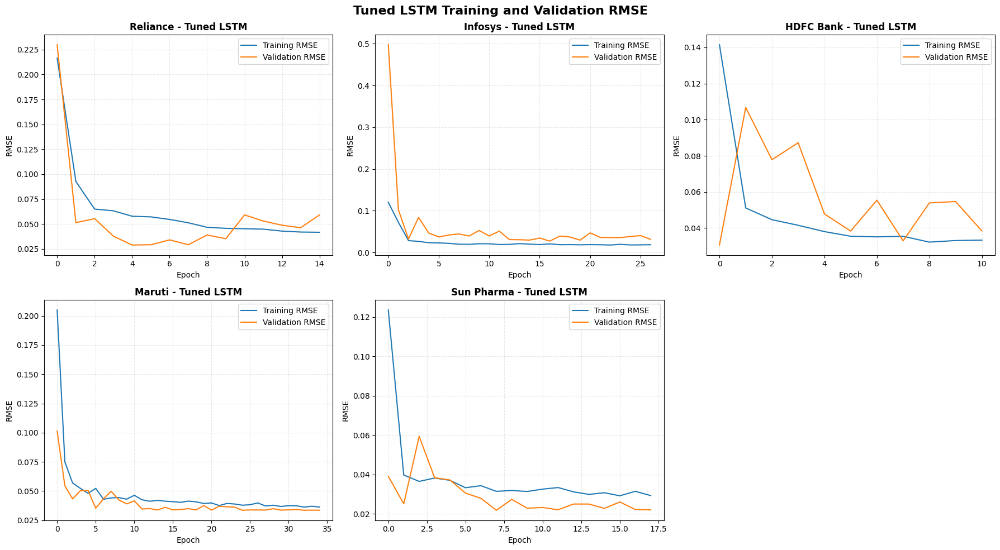

In [119]:
# Tuned LSTM Training vs Validation RMSE

fig, axes = plt.subplots(
    2, 3,
    figsize=(18, 10)
)

axes = axes.flatten()

for i, name in enumerate(model_datasets):

    history = lstm_tuned_histories[name].history

    axes[i].plot(
        history["root_mean_squared_error"],
        label="Training RMSE",
        linewidth=1.5
    )

    axes[i].plot(
        history["val_root_mean_squared_error"],
        label="Validation RMSE",
        linewidth=1.5
    )

    axes[i].set_title(
        f"{name} - Tuned LSTM",
        fontsize=12,
        fontweight="bold"
    )

    axes[i].set_xlabel("Epoch")
    axes[i].set_ylabel("RMSE")

    axes[i].legend()

    axes[i].grid(
        linestyle="--",
        alpha=0.3
    )

fig.delaxes(axes[5])

fig.suptitle(
    "Tuned LSTM Training and Validation RMSE",
    fontsize=16,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

## 19. Bidirectional LSTM (BiLSTM)

A Bidirectional Long Short-Term Memory (BiLSTM) network extends the standard LSTM architecture by processing sequential data in both forward and backward directions.

In this study, a baseline BiLSTM model is implemented using the same 1-day input window and scaled features and target used for the LSTM model. This provides a consistent basis for comparing the performance of LSTM and BiLSTM models across the five selected stocks.

The BiLSTM model is evaluated using MAE, MSE, RMSE, MAPE and R².

#### 19.1 - Import BiLSTM

In [120]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

In [121]:
# Train baseline BiLSTM models

bilstm_models = {}
bilstm_predictions = {}
bilstm_results = {}
bilstm_histories = {}

for name in model_datasets:

    model = Sequential([

        Bidirectional(
            LSTM(
                64,
                return_sequences=True
            ),
            input_shape=(
                X_train_lstm[name].shape[1],
                X_train_lstm[name].shape[2]
            )
        ),

        Dropout(0.2),

        Bidirectional(
            LSTM(32)
        ),

        Dropout(0.1),

        Dense(
            16,
            activation="relu"
        ),

        Dense(1)
    ])

    model.compile(
        optimizer=Adam(
            learning_rate=0.001
        ),
        loss="mse",
        metrics=[
            "mae",
            "root_mean_squared_error"
        ]
    )

    early_stopping = EarlyStopping(
        monitor="val_loss",
        patience=10,
        restore_best_weights=True
    )

    print()
    print(f"TRAINING BASELINE BiLSTM - {name}")
    print()

    history = model.fit(
        X_train_lstm[name],
        y_train_lstm[name],
        validation_split=0.2,
        epochs=100,
        batch_size=32,
        callbacks=[early_stopping],
        verbose=0
    )

    y_pred_scaled = model.predict(
        X_test_lstm[name],
        verbose=0
    ).flatten()

    bilstm_models[name] = model
    bilstm_predictions[name] = y_pred_scaled
    bilstm_histories[name] = history

print()
print("BASELINE BiLSTM TRAINING COMPLETED")
print()

c:\Users\SAI\AppData\Local\Programs\Python\Python313\Lib\site-packages\keras\src\layers\rnn\bidirectional.py:110: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



TRAINING BASELINE BiLSTM - Reliance


TRAINING BASELINE BiLSTM - Infosys


TRAINING BASELINE BiLSTM - HDFC Bank


TRAINING BASELINE BiLSTM - Maruti


TRAINING BASELINE BiLSTM - Sun Pharma


BASELINE BiLSTM TRAINING COMPLETED



#### 19.3 — BiLSTM Evaluation

In [122]:
# Evaluate baseline BiLSTM models

bilstm_actual_prices = {}
bilstm_predicted_prices = {}

for name in model_datasets:

    # Scaled values
    y_pred_scaled = bilstm_predictions[name]
    y_true_scaled = y_test_lstm[name]

    # Inverse transform
    y_pred = target_scalers[name].inverse_transform(
        y_pred_scaled.reshape(-1, 1)
    ).flatten()

    y_true = target_scalers[name].inverse_transform(
        y_true_scaled.reshape(-1, 1)
    ).flatten()

    # Store original-scale values
    bilstm_predicted_prices[name] = y_pred
    bilstm_actual_prices[name] = y_true

    # Metrics
    mae = mean_absolute_error(y_true, y_pred)

    mse = mean_squared_error(y_true, y_pred)

    rmse = np.sqrt(mse)

    mape = np.mean(
        np.abs((y_true - y_pred) / y_true)
    ) * 100

    r2 = r2_score(y_true, y_pred)

    bilstm_results[name] = {
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "MAPE": mape,
        "R²": r2
    }


print()
print("BASELINE BiLSTM EVALUATION COMPLETED")
print()


BASELINE BiLSTM EVALUATION COMPLETED



In [123]:
 # BiLSTM results table

bilstm_results_df = pd.DataFrame(
    bilstm_results
).T

bilstm_results_df.style.format({
    "MAE": "{:.4f}",
    "MSE": "{:.2f}",
    "RMSE": "{:.4f}",
    "MAPE": "{:.2f}%",
    "R²": "{:.4f}"
})

,MAE,MSE,RMSE,MAPE,R²
Reliance,20.3387,708.41,26.6160,1.60%,0.9670
Infosys,24.4020,1087.47,32.9768,1.70%,0.9717
HDFC Bank,10.4984,208.54,14.4410,1.39%,0.9317
Maruti,344.6155,208542.88,456.6650,3.13%,0.9103
Sun Pharma,72.7046,11926.11,109.2067,4.74%,0.8910


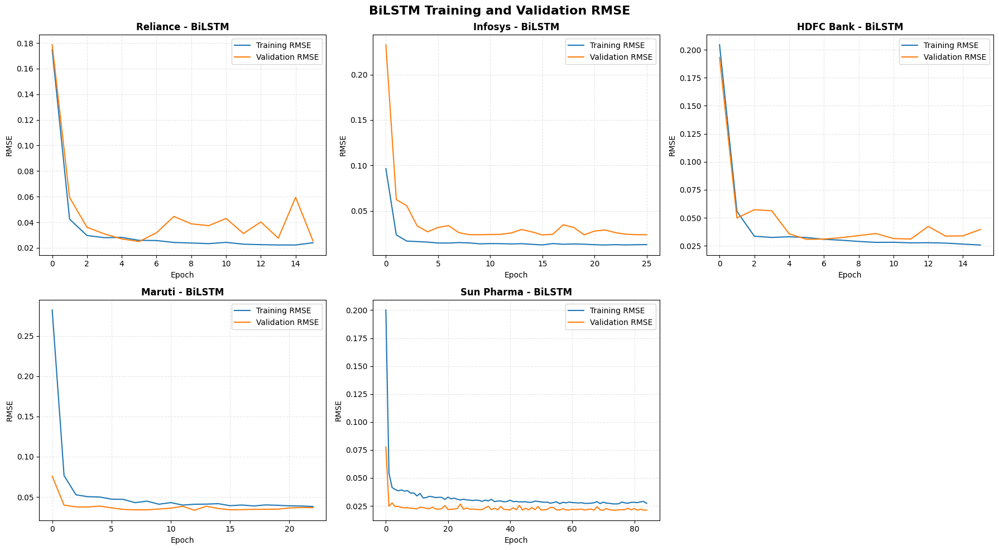

In [124]:
# BiLSTM Training vs Validation RMSE

fig, axes = plt.subplots(
    2, 3,
    figsize=(18, 10)
)

axes = axes.flatten()

for i, name in enumerate(model_datasets):

    history = bilstm_histories[name].history

    axes[i].plot(
        history["root_mean_squared_error"],
        label="Training RMSE",
        linewidth=1.5
    )

    axes[i].plot(
        history["val_root_mean_squared_error"],
        label="Validation RMSE",
        linewidth=1.5
    )

    axes[i].set_title(
        f"{name} - BiLSTM",
        fontsize=12,
        fontweight="bold"
    )

    axes[i].set_xlabel("Epoch")
    axes[i].set_ylabel("RMSE")

    axes[i].legend()

    axes[i].grid(
        linestyle="--",
        alpha=0.3
    )

fig.delaxes(axes[5])

fig.suptitle(
    "BiLSTM Training and Validation RMSE",
    fontsize=16,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

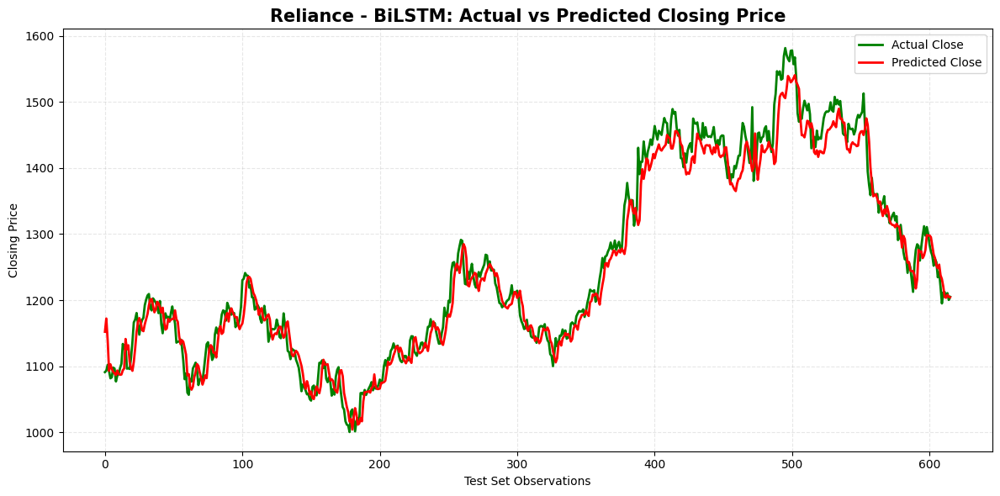

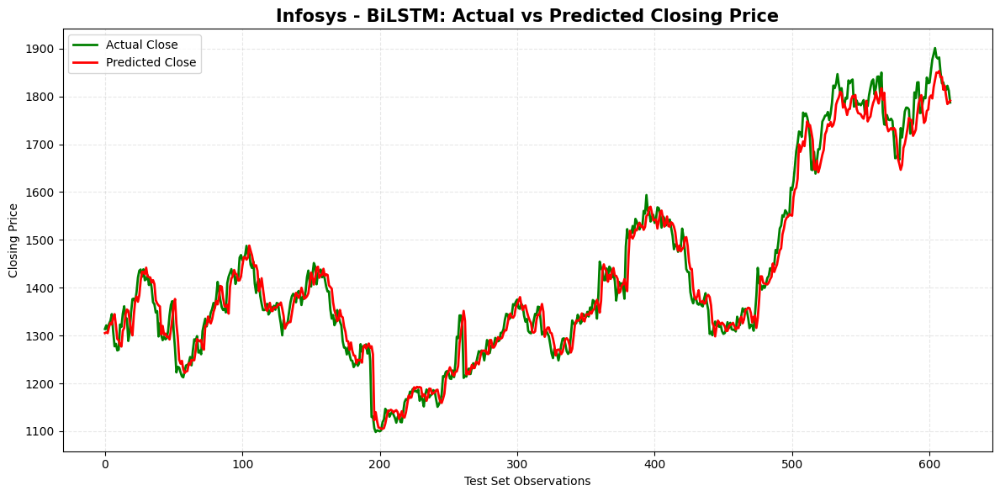

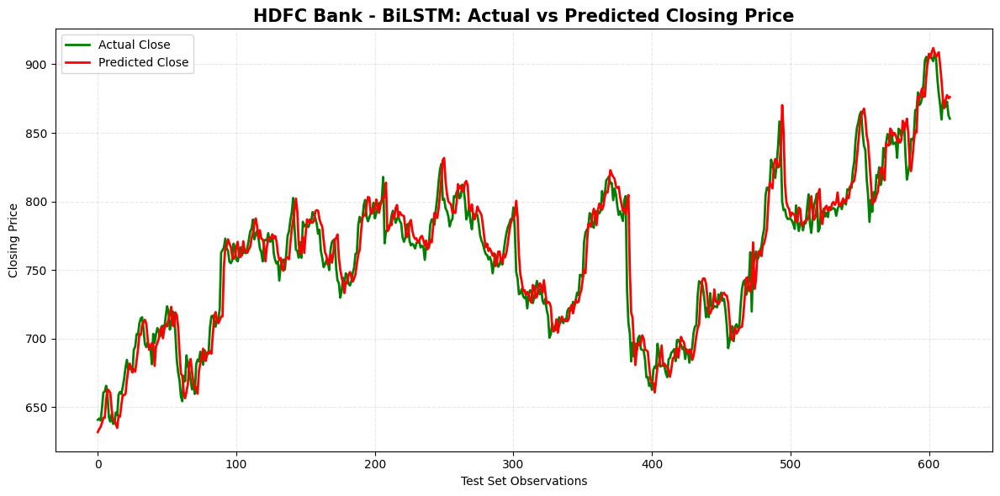

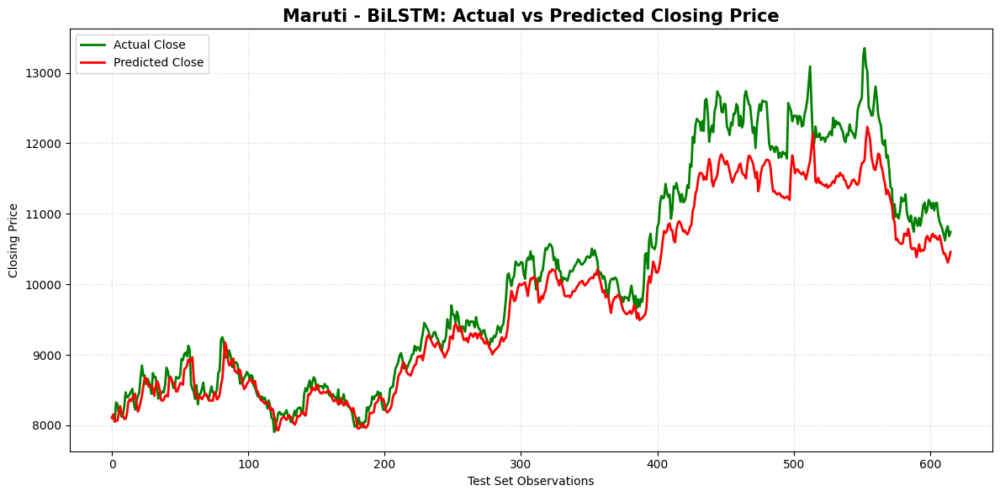

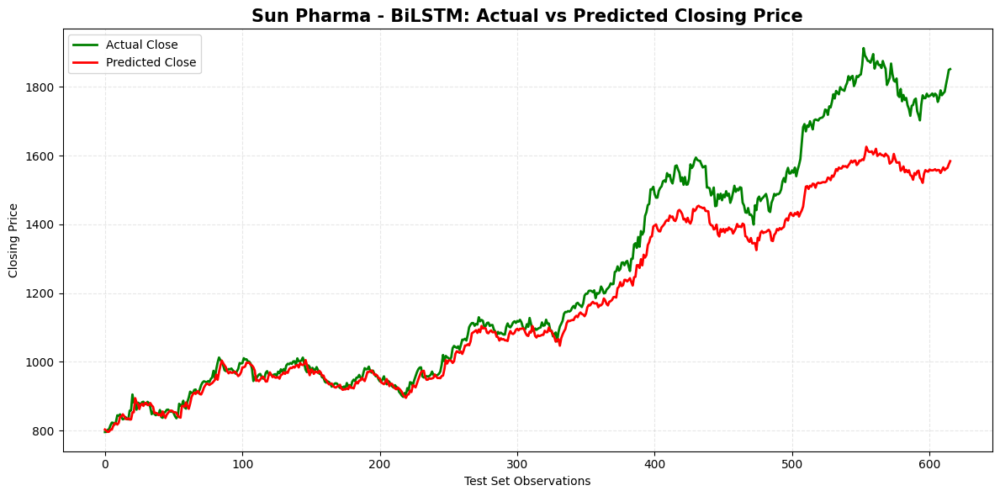

In [125]:
# BiLSTM Actual vs Predicted Closing Price

for name in model_datasets:

    y_true = bilstm_actual_prices[name]
    y_pred = bilstm_predicted_prices[name]

    plt.figure(figsize=(12, 6))

    plt.plot(
        y_true,
        label="Actual Close",
        linewidth=2,
        color="green"
    )

    plt.plot(
        y_pred,
        label="Predicted Close",
        linewidth=2,
        color="red"
    )

    plt.title(
        f"{name} - BiLSTM: Actual vs Predicted Closing Price",
        fontsize=15,
        fontweight="bold"
    )

    plt.xlabel("Test Set Observations")
    plt.ylabel("Closing Price")

    plt.legend()

    plt.grid(
        linestyle="--",
        alpha=0.3
    )

    plt.tight_layout()
    plt.show()

## 20. BiLSTM Hyperparameter Tuning

#### 20.1 — Define BiLSTM Hyperparameter Search

In [126]:
# Tuned BiLSTM

import tensorflow as tf
import keras_tuner as kt

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Bidirectional,
    LSTM,
    Dense,
    Dropout
)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau
)

bilstm_tuned_models = {}
bilstm_tuned_predictions = {}
bilstm_tuned_results = {}
bilstm_tuned_histories = {}

print("TUNED BiLSTM SETUP COMPLETED")

TUNED BiLSTM SETUP COMPLETED


In [127]:
# Define BiLSTM hyperparameter search

for name in model_datasets:

    X_train_seq = X_train_lstm[name]
    y_train_seq = y_train_lstm[name]


    def build_model(hp):

        model = Sequential([

            Bidirectional(
                LSTM(
                    units=hp.Choice(
                        "lstm1_units",
                        [32, 64, 128]
                    ),
                    return_sequences=True
                ),
                input_shape=(
                    X_train_seq.shape[1],
                    X_train_seq.shape[2]
                )
            ),

            Dropout(
                hp.Choice(
                    "dropout1",
                    [0.1, 0.2, 0.3, 0.4]
                )
            ),

            Bidirectional(
                LSTM(
                    units=hp.Choice(
                        "lstm2_units",
                        [16, 32, 64]
                    )
                )
            ),

            Dropout(
                hp.Choice(
                    "dropout2",
                    [0.1, 0.2, 0.3, 0.4]
                )
            ),

            Dense(
                hp.Choice(
                    "dense_units",
                    [8, 16, 32]
                ),
                activation="relu"
            ),

            Dense(1)
        ])


        model.compile(
            optimizer=Adam(
                learning_rate=hp.Choice(
                    "learning_rate",
                    [1e-2, 1e-3, 5e-4, 1e-4]
                )
            ),
            loss="mse",
            metrics=[
                "mae",
                "root_mean_squared_error"
            ]
        )

        return model


    tuner = kt.RandomSearch(
        build_model,
        objective="val_loss",
        max_trials=20,
        executions_per_trial=1,
        directory="bilstm_tuning",
        project_name=f"bilstm_{name.replace(' ', '_')}",
        overwrite=False
    )


    print("=" * 55)
    print(f"BiLSTM SEARCH SPACE - {name}")
    print("=" * 55)

    tuner.search_space_summary()

Reloading Tuner from bilstm_tuning\bilstm_Reliance\tuner0.json
BiLSTM SEARCH SPACE - Reliance
Search space summary
Default search space size: 6
lstm1_units (Choice)
{'default': 32, 'conditions': [], 'values': [32, 64, 128], 'ordered': True}
dropout1 (Choice)
{'default': 0.1, 'conditions': [], 'values': [0.1, 0.2, 0.3, 0.4], 'ordered': True}
lstm2_units (Choice)
{'default': 16, 'conditions': [], 'values': [16, 32, 64], 'ordered': True}
dropout2 (Choice)
{'default': 0.1, 'conditions': [], 'values': [0.1, 0.2, 0.3, 0.4], 'ordered': True}
dense_units (Choice)
{'default': 8, 'conditions': [], 'values': [8, 16, 32], 'ordered': True}
learning_rate (Choice)
{'default': 0.01, 'conditions': [], 'values': [0.01, 0.001, 0.0005, 0.0001], 'ordered': True}
Reloading Tuner from bilstm_tuning\bilstm_Infosys\tuner0.json
BiLSTM SEARCH SPACE - Infosys
Search space summary
Default search space size: 6
lstm1_units (Choice)
{'default': 32, 'conditions': [], 'values': [32, 64, 128], 'ordered': True}
dropout1 

In [128]:
# Run BiLSTM hyperparameter tuning

for name in model_datasets:

    X_train_seq = X_train_lstm[name]
    y_train_seq = y_train_lstm[name]


    def build_model(hp):

        model = Sequential([

            Bidirectional(
                LSTM(
                    units=hp.Choice(
                        "lstm1_units",
                        [32, 64, 128]
                    ),
                    return_sequences=True
                ),
                input_shape=(
                    X_train_seq.shape[1],
                    X_train_seq.shape[2]
                )
            ),

            Dropout(
                hp.Choice(
                    "dropout1",
                    [0.1, 0.2, 0.3, 0.4]
                )
            ),

            Bidirectional(
                LSTM(
                    units=hp.Choice(
                        "lstm2_units",
                        [16, 32, 64]
                    )
                )
            ),

            Dropout(
                hp.Choice(
                    "dropout2",
                    [0.1, 0.2, 0.3, 0.4]
                )
            ),

            Dense(
                hp.Choice(
                    "dense_units",
                    [8, 16, 32]
                ),
                activation="relu"
            ),

            Dense(1)
        ])


        model.compile(
            optimizer=Adam(
                learning_rate=hp.Choice(
                    "learning_rate",
                    [1e-2, 1e-3, 5e-4, 1e-4]
                )
            ),
            loss="mse",
            metrics=[
                "mae",
                "root_mean_squared_error"
            ]
        )

        return model


    tuner = kt.RandomSearch(
        build_model,
        objective="val_loss",
        max_trials=20,
        executions_per_trial=1,
        directory="bilstm_tuning",
        project_name=f"bilstm_{name.replace(' ', '_')}",
        overwrite=False
    )


    reduce_lr = ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.5,
        patience=5,
        min_lr=1e-6,
        verbose=0
    )


    early_stopping = EarlyStopping(
        monitor="val_loss",
        patience=10,
        restore_best_weights=True
    )


    print()
    print(f"STARTING BiLSTM TUNING - {name}")
    print()


    tuner.search(
        X_train_seq,
        y_train_seq,
        validation_split=0.2,
        epochs=100,
        batch_size=32,
        callbacks=[
            reduce_lr,
            early_stopping
        ],
        verbose=1
    )


    best_hp = tuner.get_best_hyperparameters(
        num_trials=1
    )[0]


    bilstm_tuned_results[name] = {
        "Best Parameters": best_hp.values
    }


    print()
    print("=" * 55)
    print(f"BEST PARAMETERS - {name}")
    print("=" * 55)

    for parameter, value in best_hp.values.items():

        print(
            f"{parameter}: {value}"
        )

    print()

Reloading Tuner from bilstm_tuning\bilstm_Reliance\tuner0.json

STARTING BiLSTM TUNING - Reliance


BEST PARAMETERS - Reliance
lstm1_units: 64
dropout1: 0.1
lstm2_units: 16
dropout2: 0.4
dense_units: 8
learning_rate: 0.0005

Reloading Tuner from bilstm_tuning\bilstm_Infosys\tuner0.json

STARTING BiLSTM TUNING - Infosys


BEST PARAMETERS - Infosys
lstm1_units: 32
dropout1: 0.4
lstm2_units: 16
dropout2: 0.2
dense_units: 16
learning_rate: 0.001

Reloading Tuner from bilstm_tuning\bilstm_HDFC_Bank\tuner0.json

STARTING BiLSTM TUNING - HDFC Bank


BEST PARAMETERS - HDFC Bank
lstm1_units: 64
dropout1: 0.2
lstm2_units: 64
dropout2: 0.4
dense_units: 32
learning_rate: 0.01

Reloading Tuner from bilstm_tuning\bilstm_Maruti\tuner0.json

STARTING BiLSTM TUNING - Maruti


BEST PARAMETERS - Maruti
lstm1_units: 64
dropout1: 0.1
lstm2_units: 32
dropout2: 0.1
dense_units: 32
learning_rate: 0.01

Reloading Tuner from bilstm_tuning\bilstm_Sun_Pharma\tuner0.json

STARTING BiLSTM TUNING - Sun Pharma


BEST

In [129]:
# Train best tuned BiLSTM models and save training history

bilstm_tuned_histories = {}

for name in model_datasets:

    X_train_seq = X_train_lstm[name]
    y_train_seq = y_train_lstm[name]

    best_params = bilstm_tuned_results[name]["Best Parameters"]

    model = Sequential([

        Bidirectional(
            LSTM(
                best_params["lstm1_units"],
                return_sequences=True
            ),
            input_shape=(
                X_train_seq.shape[1],
                X_train_seq.shape[2]
            )
        ),

        Dropout(
            best_params["dropout1"]
        ),

        Bidirectional(
            LSTM(
                best_params["lstm2_units"]
            )
        ),

        Dropout(
            best_params["dropout2"]
        ),

        Dense(
            best_params["dense_units"],
            activation="relu"
        ),

        Dense(1)
    ])

    model.compile(
        optimizer=Adam(
            learning_rate=best_params["learning_rate"]
        ),
        loss="mse",
        metrics=[
            "mae",
            "root_mean_squared_error"
        ]
    )

    reduce_lr = ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.5,
        patience=5,
        min_lr=1e-6,
        verbose=0
    )

    early_stopping = EarlyStopping(
        monitor="val_loss",
        patience=10,
        restore_best_weights=True
    )

    print()
    print(f"TRAINING BEST TUNED BiLSTM - {name}")
    print()

    history = model.fit(
        X_train_seq,
        y_train_seq,
        validation_split=0.2,
        epochs=100,
        batch_size=32,
        callbacks=[
            reduce_lr,
            early_stopping
        ],
        verbose=0
    )

    bilstm_tuned_models[name] = model
    bilstm_tuned_histories[name] = history

print("BEST TUNED BiLSTM TRAINING COMPLETED")

c:\Users\SAI\AppData\Local\Programs\Python\Python313\Lib\site-packages\keras\src\layers\rnn\bidirectional.py:110: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



TRAINING BEST TUNED BiLSTM - Reliance


TRAINING BEST TUNED BiLSTM - Infosys


TRAINING BEST TUNED BiLSTM - HDFC Bank


TRAINING BEST TUNED BiLSTM - Maruti


TRAINING BEST TUNED BiLSTM - Sun Pharma

BEST TUNED BiLSTM TRAINING COMPLETED


#### 20.2 - Generate Predictions from Tuned BiLSTM

In [130]:
# Generate predictions from tuned BiLSTM models

bilstm_tuned_predictions = {}

for name in model_datasets:

    y_pred_scaled = bilstm_tuned_models[name].predict(
        X_test_lstm[name],
        verbose=0
    ).flatten()

    bilstm_tuned_predictions[name] = y_pred_scaled


print()
print("TUNED BiLSTM PREDICTIONS GENERATED")
print()


TUNED BiLSTM PREDICTIONS GENERATED



#### 20.3 — Inverse Scaling and Evaluation

In [131]:
# Evaluate tuned BiLSTM models

bilstm_tuned_actual_prices = {}
bilstm_tuned_predicted_prices = {}

for name in model_datasets:

    # Scaled values
    y_pred_scaled = bilstm_tuned_predictions[name]
    y_true_scaled = y_test_lstm[name]

    # Convert back to original stock-price scale
    y_pred = target_scalers[name].inverse_transform(
        y_pred_scaled.reshape(-1, 1)
    ).flatten()

    y_true = target_scalers[name].inverse_transform(
        y_true_scaled.reshape(-1, 1)
    ).flatten()

    # Store original-scale values
    bilstm_tuned_predicted_prices[name] = y_pred
    bilstm_tuned_actual_prices[name] = y_true

    # Calculate metrics
    mae = mean_absolute_error(y_true, y_pred)

    mse = mean_squared_error(y_true, y_pred)

    rmse = np.sqrt(mse)

    mape = np.mean(
        np.abs((y_true - y_pred) / y_true)
    ) * 100

    r2 = r2_score(y_true, y_pred)

    bilstm_tuned_results[name].update({
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "MAPE": mape,
        "R²": r2
    })


print()
print("TUNED BiLSTM EVALUATION COMPLETED")
print()


TUNED BiLSTM EVALUATION COMPLETED



#### 20.4 — Tuned BiLSTM Results

In [132]:
# Tuned BiLSTM results table

bilstm_tuned_results_df = pd.DataFrame(
    {
        name: {
            "MAE": bilstm_tuned_results[name]["MAE"],
            "MSE": bilstm_tuned_results[name]["MSE"],
            "RMSE": bilstm_tuned_results[name]["RMSE"],
            "MAPE": bilstm_tuned_results[name]["MAPE"],
            "R²": bilstm_tuned_results[name]["R²"]
        }
        for name in model_datasets
    }
).T

bilstm_tuned_results_df.style.format({
    "MAE": "{:.4f}",
    "MSE": "{:.2f}",
    "RMSE": "{:.4f}",
    "MAPE": "{:.2f}%",
    "R²": "{:.4f}"
})

,MAE,MSE,RMSE,MAPE,R²
Reliance,28.5645,1361.32,36.8961,2.20%,0.9365
Infosys,23.2926,1003.04,31.6708,1.64%,0.9739
HDFC Bank,19.3501,524.00,22.8911,2.49%,0.8284
Maruti,500.9065,426883.13,653.3629,4.52%,0.8164
Sun Pharma,183.3565,71467.33,267.3338,11.95%,0.3466


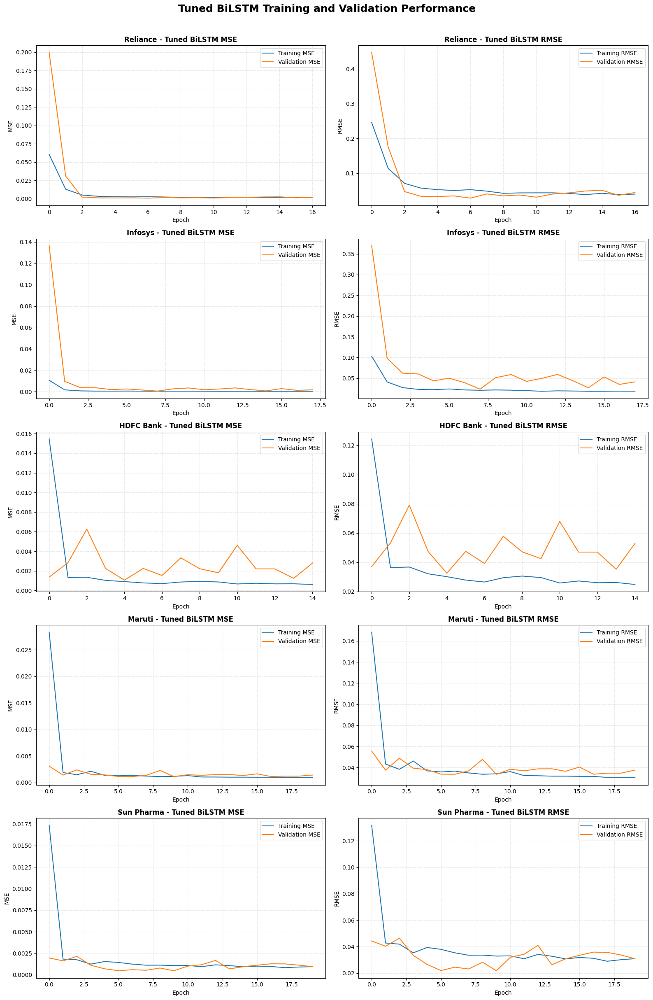

In [133]:
# Tuned BiLSTM Training/Validation MSE and RMSE

fig, axes = plt.subplots(
    5, 2,
    figsize=(16, 24)
)

for i, name in enumerate(model_datasets):

    history = bilstm_tuned_histories[name].history

    # -------------------------------
    # MSE / Loss
    # -------------------------------

    axes[i, 0].plot(
        history["loss"],
        label="Training MSE",
        linewidth=1.5
    )

    axes[i, 0].plot(
        history["val_loss"],
        label="Validation MSE",
        linewidth=1.5
    )

    axes[i, 0].set_title(
        f"{name} - Tuned BiLSTM MSE",
        fontsize=12,
        fontweight="bold"
    )

    axes[i, 0].set_xlabel("Epoch")
    axes[i, 0].set_ylabel("MSE")

    axes[i, 0].legend()
    axes[i, 0].grid(
        linestyle="--",
        alpha=0.3
    )


    # -------------------------------
    # RMSE
    # -------------------------------

    axes[i, 1].plot(
        history["root_mean_squared_error"],
        label="Training RMSE",
        linewidth=1.5
    )

    axes[i, 1].plot(
        history["val_root_mean_squared_error"],
        label="Validation RMSE",
        linewidth=1.5
    )

    axes[i, 1].set_title(
        f"{name} - Tuned BiLSTM RMSE",
        fontsize=12,
        fontweight="bold"
    )

    axes[i, 1].set_xlabel("Epoch")
    axes[i, 1].set_ylabel("RMSE")

    axes[i, 1].legend()
    axes[i, 1].grid(
        linestyle="--",
        alpha=0.3
    )


fig.suptitle(
    "Tuned BiLSTM Training and Validation Performance",
    fontsize=18,
    fontweight="bold",
    y=1.01
)

plt.tight_layout()
plt.show()

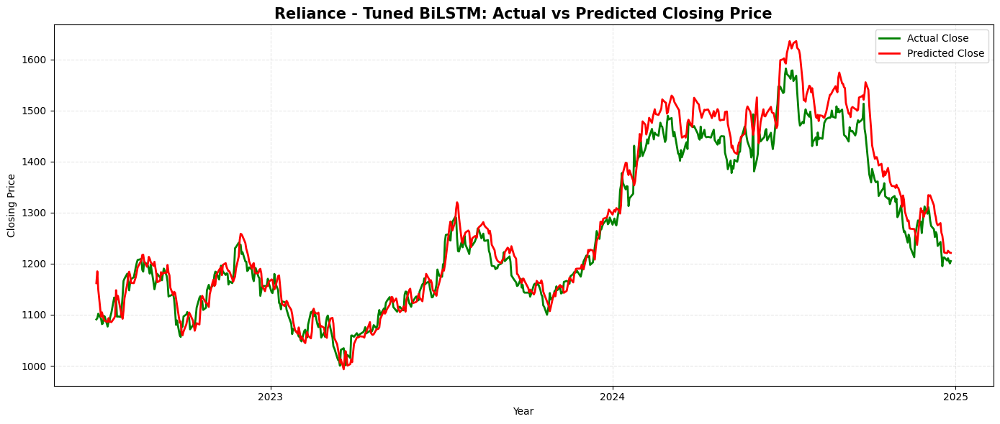

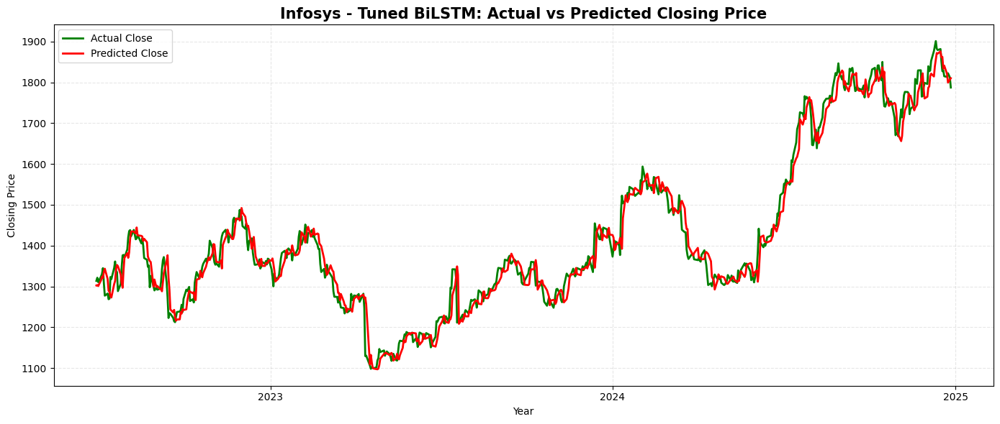

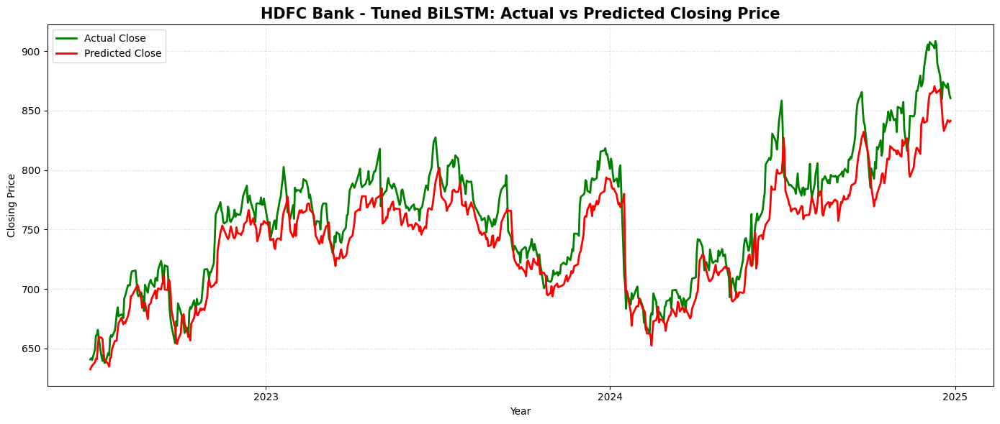

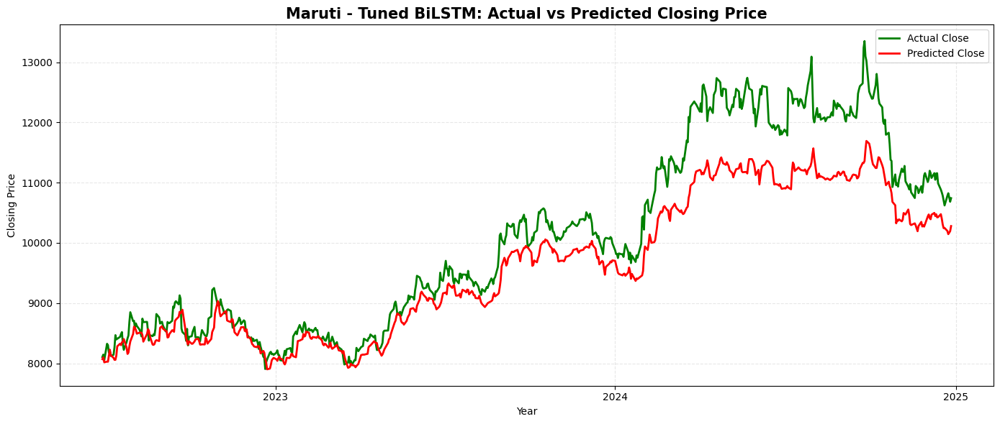

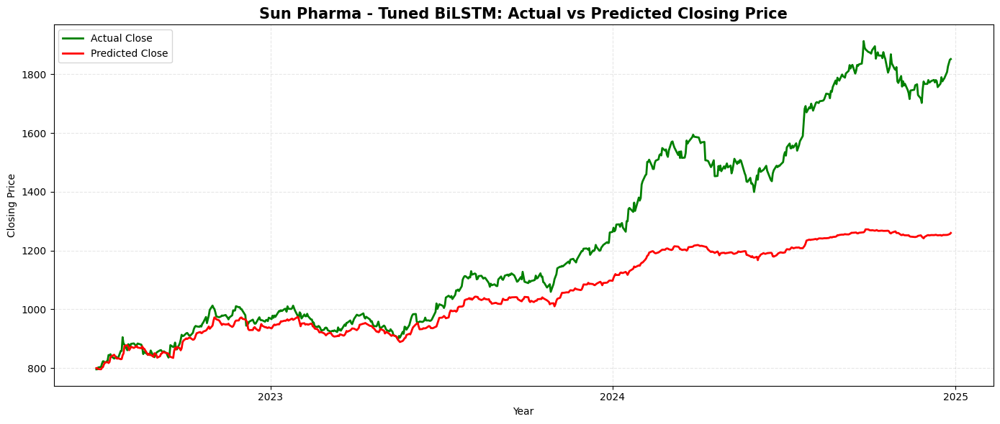

In [134]:
# Tuned BiLSTM Actual vs Predicted Closing Price

import matplotlib.dates as mdates

for name in model_datasets:

    y_true = bilstm_tuned_actual_prices[name]
    y_pred = bilstm_tuned_predicted_prices[name]

    # Get test dates
    test_dates = X_test_datasets[name].index

    # Align dates with predictions
    test_dates = test_dates[:len(y_true)]

    plt.figure(figsize=(14, 6))

    plt.plot(
        test_dates,
        y_true,
        label="Actual Close",
        linewidth=2,
        color="green"
    )

    plt.plot(
        test_dates,
        y_pred,
        label="Predicted Close",
        linewidth=2,
        color="red"
    )

    plt.title(
        f"{name} - Tuned BiLSTM: Actual vs Predicted Closing Price",
        fontsize=15,
        fontweight="bold"
    )

    plt.xlabel("Year")
    plt.ylabel("Closing Price")

    # Show years on x-axis
    plt.gca().xaxis.set_major_locator(
        mdates.YearLocator()
    )

    plt.gca().xaxis.set_major_formatter(
        mdates.DateFormatter("%Y")
    )

    plt.legend()

    plt.grid(
        linestyle="--",
        alpha=0.3
    )

    plt.tight_layout()
    plt.show()

## 21. Naive Baseline

The Naive Baseline is used as a benchmark to evaluate whether the machine learning and deep learning models provide meaningful predictive improvement over a simple forecasting approach.

For one-day-ahead stock price prediction, the Naive Baseline assumes that the next day's closing price will be equal to the current day's closing price.

y(t+1) = y(t)

where:

-  y(t+1) is the predicted closing price for the next trading day.
- y(t) is the actual closing price on the current trading day.

The Naive Baseline is evaluated using the same metrics used for the machine learning and deep learning models: MAE, MSE, RMSE, MAPE, and R2.

This provides a reference point for determining whether Random Forest, XGBoost, LSTM, and BiLSTM models improve upon a simple persistence-based prediction.

In [135]:
# Naive Baseline Prediction

naive_predictions = {}
naive_actual_prices = {}
naive_results = {}

for name in model_datasets:

    # Original test target
    y_true = np.array(
        y_test_datasets[name]
    ).flatten()

    # Previous day's closing price as prediction
    y_pred = np.array(
        X_test_datasets[name]["close"]
    ).flatten()

    # Align lengths if required
    min_length = min(
        len(y_true),
        len(y_pred)
    )

    y_true = y_true[:min_length]
    y_pred = y_pred[:min_length]

    # Store predictions
    naive_actual_prices[name] = y_true
    naive_predictions[name] = y_pred

    # Metrics
    mae = mean_absolute_error(
        y_true,
        y_pred
    )

    mse = mean_squared_error(
        y_true,
        y_pred
    )

    rmse = np.sqrt(mse)

    mape = np.mean(
        np.abs(
            (y_true - y_pred) / y_true
        )
    ) * 100

    r2 = r2_score(
        y_true,
        y_pred
    )

    naive_results[name] = {
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "MAPE": mape,
        "R²": r2
    }

print("NAIVE BASELINE EVALUATION COMPLETED")


NAIVE BASELINE EVALUATION COMPLETED


In [136]:
# Naive Baseline Results

naive_results_df = pd.DataFrame(
    naive_results
).T

naive_results_df.style.format({
    "MAE": "{:.4f}",
    "MSE": "{:.2f}",
    "RMSE": "{:.4f}",
    "MAPE": "{:.2f}%",
    "R²": "{:.4f}"
})

,MAE,MSE,RMSE,MAPE,R²
Reliance,11.9198,279.83,16.7280,0.95%,0.9869
Infosys,15.0824,442.21,21.0288,1.06%,0.9885
HDFC Bank,6.6398,89.60,9.4659,0.88%,0.9708
Maruti,94.2711,17542.53,132.4482,0.92%,0.9925
Sun Pharma,10.5031,210.41,14.5055,0.84%,0.9981


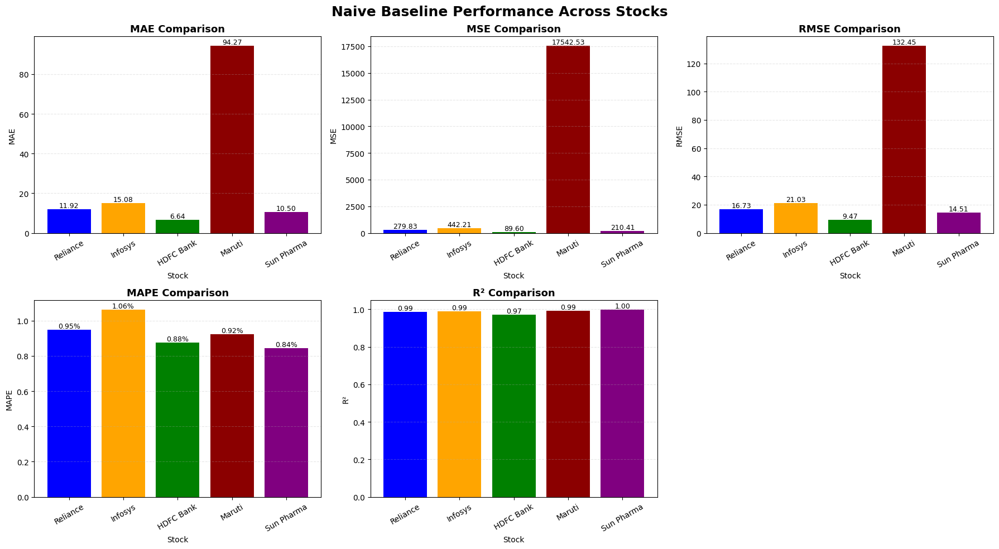

In [137]:
# Naive Baseline - All Metrics Comparison
# Same color for each stock across all metric panels

import matplotlib.pyplot as plt

stock_colors = {
    "Reliance": "blue",
    "Infosys": "orange",
    "HDFC Bank": "green",
    "Maruti": "darkred",
    "Sun Pharma": "purple"
}

metrics = ["MAE", "MSE", "RMSE", "MAPE", "R²"]

fig, axes = plt.subplots(
    2, 3,
    figsize=(18, 10)
)

axes = axes.flatten()

for i, metric in enumerate(metrics):

    values = naive_results_df[metric]

    bars = axes[i].bar(
        naive_results_df.index,
        values,
        color=[
            stock_colors[stock]
            for stock in naive_results_df.index
        ]
    )

    axes[i].set_title(
        f"{metric} Comparison",
        fontsize=13,
        fontweight="bold"
    )

    axes[i].set_xlabel("Stock")
    axes[i].set_ylabel(metric)

    axes[i].tick_params(
        axis="x",
        rotation=30
    )

    axes[i].grid(
        axis="y",
        linestyle="--",
        alpha=0.3
    )

    # Add values above bars
    for bar, value in zip(bars, values):

        if metric == "MAPE":
            label = f"{value:.2f}%"
        else:
            label = f"{value:.2f}"

        axes[i].text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height(),
            label,
            ha="center",
            va="bottom",
            fontsize=9
        )

# Remove unused subplot
fig.delaxes(axes[5])

fig.suptitle(
    "Naive Baseline Performance Across Stocks",
    fontsize=18,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

## 22. Final Comparison table

In [149]:
# Final Model Results - Prepare Comparison Tables

model_results = {
    "Linear Regression": lr_results,
    "Random Forest": rf_results,
    "Tuned Random Forest": rf_tuned_results,
    "XGBoost": xgb_results,
    "Tuned XGBoost": xgb_tuned_results,
    "LSTM": lstm_results,
    "Tuned LSTM": lstm_tuned_results,
    "BiLSTM": bilstm_results,
    "Tuned BiLSTM": bilstm_tuned_results
}

print()
print("MODELS INCLUDED IN FINAL COMPARISON")
print()

for model_name in model_results:
    print(model_name)

print()


MODELS INCLUDED IN FINAL COMPARISON

Linear Regression
Random Forest
Tuned Random Forest
XGBoost
Tuned XGBoost
LSTM
Tuned LSTM
BiLSTM
Tuned BiLSTM



In [150]:
# Final Model Comparison by Stock

final_comparison = {}

for stock in model_datasets:

    rows = []

    for model_name, results in model_results.items():

        result = results[stock]

        rows.append({
            "Model": model_name,
            "MAE": result["MAE"],
            "MSE": result["MSE"],
            "RMSE": result["RMSE"],
            "MAPE": result["MAPE"],
            "R²": result["R²"]
        })

    final_comparison[stock] = pd.DataFrame(rows)


# Display results for each stock

for stock in model_datasets:

    print("\n")
    print(f"{stock} - FINAL MODEL COMPARISON")

    display(
        final_comparison[stock].style.format({
            "MAE": "{:.4f}",
            "MSE": "{:.2f}",
            "RMSE": "{:.4f}",
            "MAPE": "{:.2f}%",
            "R²": "{:.4f}"
        })
    )



Reliance - FINAL MODEL COMPARISON


,Model,MAE,MSE,RMSE,MAPE,R²
0,Linear Regression,11.9506,280.17,16.7383,0.95%,0.9869
1,Random Forest,71.5787,13164.94,114.7386,5.08%,0.3856
2,Tuned Random Forest,71.2799,12992.29,113.9837,5.06%,0.3937
3,XGBoost,75.9059,14729.06,121.3634,5.38%,0.3126
4,Tuned XGBoost,76.8972,14608.74,120.8666,5.48%,0.3182
5,LSTM,18.0235,583.88,24.1637,1.45%,0.9728
6,Tuned LSTM,18.1103,581.86,24.1218,1.45%,0.9729
7,BiLSTM,20.3387,708.41,26.6160,1.60%,0.9670
8,Tuned BiLSTM,28.5645,1361.32,36.8961,2.20%,0.9365




Infosys - FINAL MODEL COMPARISON


,Model,MAE,MSE,RMSE,MAPE,R²
0,Linear Regression,15.0359,442.38,21.0329,1.06%,0.9885
1,Random Forest,33.5141,3050.22,55.2288,2.12%,0.9206
2,Tuned Random Forest,33.7015,3224.93,56.7884,2.12%,0.9160
3,XGBoost,34.1579,3199.97,56.5682,2.16%,0.9167
4,Tuned XGBoost,35.6951,3324.96,57.6625,2.27%,0.9134
5,LSTM,24.4257,1080.06,32.8643,1.73%,0.9719
6,Tuned LSTM,23.5400,1021.39,31.9593,1.65%,0.9734
7,BiLSTM,24.4020,1087.47,32.9768,1.70%,0.9717
8,Tuned BiLSTM,23.2926,1003.04,31.6708,1.64%,0.9739




HDFC Bank - FINAL MODEL COMPARISON


,Model,MAE,MSE,RMSE,MAPE,R²
0,Linear Regression,6.6377,89.73,9.4724,0.88%,0.9708
1,Random Forest,17.9940,904.93,30.0821,2.23%,0.7055
2,Tuned Random Forest,17.3327,857.23,29.2785,2.15%,0.7210
3,XGBoost,19.6550,966.34,31.0861,2.45%,0.6855
4,Tuned XGBoost,22.9758,1168.00,34.1760,2.87%,0.6199
5,LSTM,11.3249,221.54,14.8841,1.48%,0.9275
6,Tuned LSTM,17.0286,472.35,21.7335,2.17%,0.8453
7,BiLSTM,10.4984,208.54,14.4410,1.39%,0.9317
8,Tuned BiLSTM,19.3501,524.00,22.8911,2.49%,0.8284




Maruti - FINAL MODEL COMPARISON


,Model,MAE,MSE,RMSE,MAPE,R²
0,Linear Regression,94.3949,17709.66,133.0776,0.92%,0.9924
1,Random Forest,1352.7920,3594668.11,1895.9610,11.81%,-0.5443
2,Tuned Random Forest,1371.2502,3673560.68,1916.6535,11.98%,-0.5782
3,XGBoost,1361.1949,3629109.94,1905.0223,11.89%,-0.5591
4,Tuned XGBoost,1351.9593,3589809.84,1894.6794,11.81%,-0.5422
5,LSTM,552.4587,545060.16,738.2819,4.93%,0.7656
6,Tuned LSTM,485.6665,416012.29,644.9901,4.36%,0.8211
7,BiLSTM,344.6155,208542.88,456.6650,3.13%,0.9103
8,Tuned BiLSTM,500.9065,426883.13,653.3629,4.52%,0.8164




Sun Pharma - FINAL MODEL COMPARISON


,Model,MAE,MSE,RMSE,MAPE,R²
0,Linear Regression,10.8838,223.41,14.9468,0.87%,0.9980
1,Random Forest,263.1105,155041.83,393.7535,16.83%,-0.4157
2,Tuned Random Forest,259.2922,151834.41,389.6594,16.55%,-0.3864
3,XGBoost,264.3761,154608.74,393.2032,16.99%,-0.4117
4,Tuned XGBoost,264.5624,154176.68,392.6534,17.02%,-0.4078
5,LSTM,53.0231,6318.22,79.4872,3.52%,0.9422
6,Tuned LSTM,155.3637,55649.13,235.9007,9.96%,0.4912
7,BiLSTM,72.7046,11926.11,109.2067,4.74%,0.8910
8,Tuned BiLSTM,183.3565,71467.33,267.3338,11.95%,0.3466


In [151]:
# ============================================================
# COMBINED FINAL RESULTS
# ============================================================

all_results = []

for stock in model_datasets:

    for model_name, results in model_results.items():

        result = results[stock]

        all_results.append({
            "Stock": stock,
            "Model": model_name,
            "MAE": result["MAE"],
            "MSE": result["MSE"],
            "RMSE": result["RMSE"],
            "MAPE": result["MAPE"],
            "R²": result["R²"]
        })


final_results_df = pd.DataFrame(all_results)

display(
    final_results_df.style.format({
        "MAE": "{:.4f}",
        "MSE": "{:.2f}",
        "RMSE": "{:.4f}",
        "MAPE": "{:.2f}%",
        "R²": "{:.4f}"
    })
)

,Stock,Model,MAE,MSE,RMSE,MAPE,R²
0,Reliance,Linear Regression,11.9506,280.17,16.7383,0.95%,0.9869
1,Reliance,Random Forest,71.5787,13164.94,114.7386,5.08%,0.3856
2,Reliance,Tuned Random Forest,71.2799,12992.29,113.9837,5.06%,0.3937
3,Reliance,XGBoost,75.9059,14729.06,121.3634,5.38%,0.3126
4,Reliance,Tuned XGBoost,76.8972,14608.74,120.8666,5.48%,0.3182
5,Reliance,LSTM,18.0235,583.88,24.1637,1.45%,0.9728
6,Reliance,Tuned LSTM,18.1103,581.86,24.1218,1.45%,0.9729
7,Reliance,BiLSTM,20.3387,708.41,26.6160,1.60%,0.9670
8,Reliance,Tuned BiLSTM,28.5645,1361.32,36.8961,2.20%,0.9365
9,Infosys,Linear Regression,15.0359,442.38,21.0329,1.06%,0.9885


In [ ]:
# 23. BEST MODEL FOR EACH STOCK


best_models_rmse = {}

for stock in model_datasets:

    results = final_comparison[stock].copy()

    # Find model with lowest RMSE
    best_row = results.loc[
        results["RMSE"].idxmin()
    ]

    best_models_rmse[stock] = {
        "Best Model": best_row["Model"],
        "MAE": best_row["MAE"],
        "MSE": best_row["MSE"],
        "RMSE": best_row["RMSE"],
        "MAPE": best_row["MAPE"],
        "R²": best_row["R²"]
    }


best_model_df = pd.DataFrame(
    best_models_rmse
).T

print("BEST MODEL FOR EACH STOCK - BASED ON RMSE")

display(
    best_model_df.style.format({
        "MAE": "{:.4f}",
        "MSE": "{:.2f}",
        "RMSE": "{:.4f}",
        "MAPE": "{:.2f}%",
        "R²": "{:.4f}"
    })
)

BEST MODEL FOR EACH STOCK - BASED ON RMSE


,Best Model,MAE,MSE,RMSE,MAPE,R²
Reliance,Linear Regression,11.9506,280.17,16.7383,0.95%,0.9869
Infosys,Linear Regression,15.0359,442.38,21.0329,1.06%,0.9885
HDFC Bank,Linear Regression,6.6377,89.73,9.4724,0.88%,0.9708
Maruti,Linear Regression,94.3949,17709.66,133.0776,0.92%,0.9924
Sun Pharma,Linear Regression,10.8838,223.41,14.9468,0.87%,0.9980


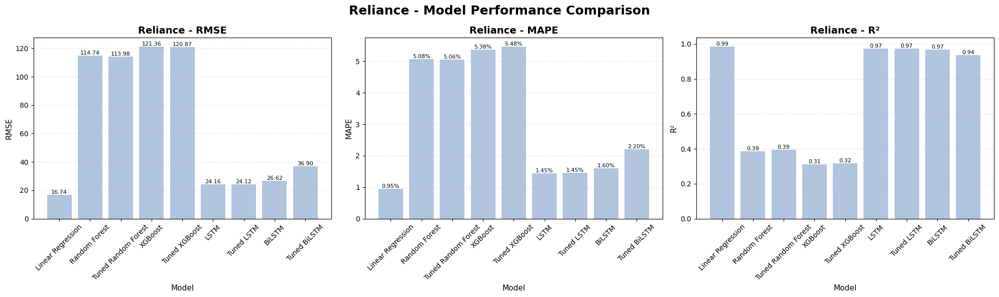

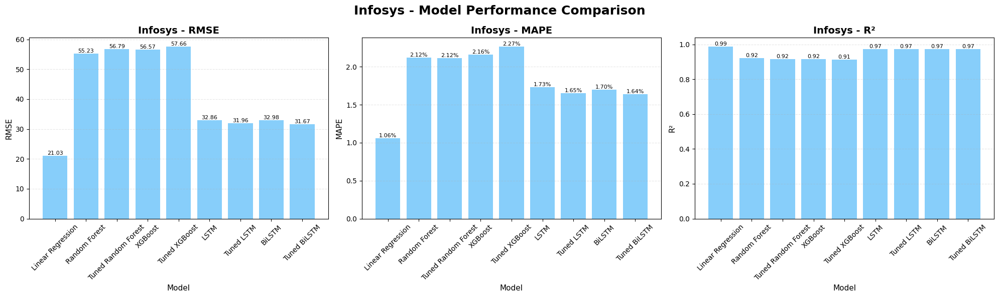

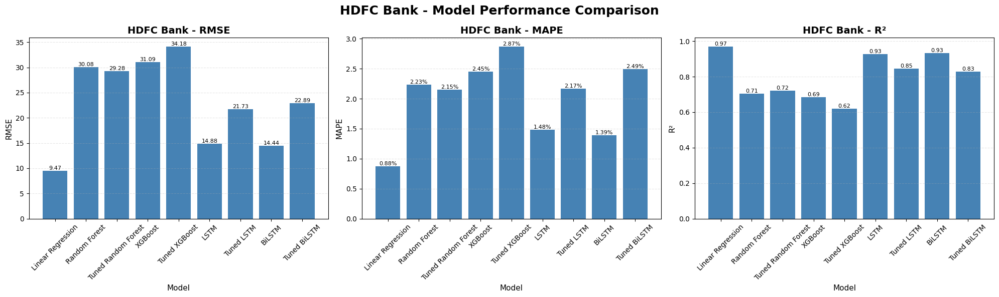

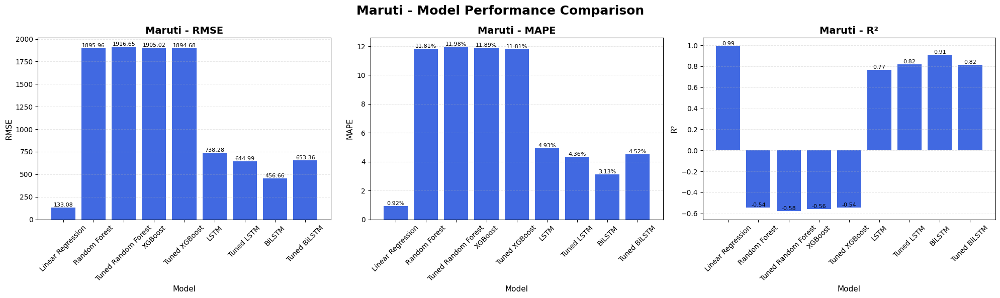

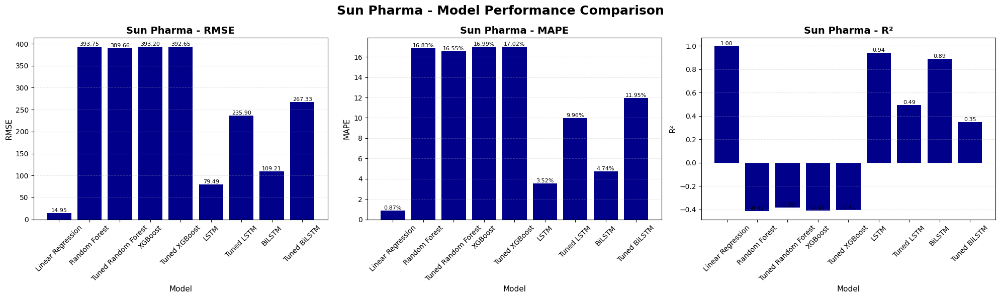

In [ ]:

# 24. FINAL MODEL COMPARISON GRAPHS - ONE STOCK AT A TIME
# RMSE, MAPE and R²


import matplotlib.pyplot as plt
import numpy as np

# Consistent stock colours
stock_colors = {
    "Reliance": "lightsteelblue",
    "Infosys": "lightskyblue",
    "HDFC Bank": "steelblue",
    "Maruti": "royalblue",
    "Sun Pharma": "darkblue"
}

metrics = ["RMSE", "MAPE", "R²"]

models = list(model_results.keys())

for stock in model_datasets:

    fig, axes = plt.subplots(
        1,
        3,
        figsize=(20, 6)
    )

    # --------------------------------------------------------
    # Get stock-specific colour
    # --------------------------------------------------------

    color = stock_colors[stock]

    # --------------------------------------------------------
    # Plot each metric
    # --------------------------------------------------------

    for i, metric in enumerate(metrics):

        ax = axes[i]

        values = [
            model_results[model][stock][metric]
            for model in models
        ]

        bars = ax.bar(
            models,
            values,
            color=color
        )

        # Title
        ax.set_title(
            f"{stock} - {metric}",
            fontsize=14,
            fontweight="bold"
        )

        # Axis labels
        ax.set_xlabel(
            "Model",
            fontsize=11
        )

        ax.set_ylabel(
            metric,
            fontsize=11
        )

        # Rotate model names
        ax.tick_params(
            axis="x",
            rotation=45
        )

        # Grid
        ax.grid(
            axis="y",
            linestyle="--",
            alpha=0.3
        )

        # ----------------------------------------------------
        # Add values above bars

        for bar, value in zip(bars, values):

            if metric == "MAPE":
                label = f"{value:.2f}%"
            else:
                label = f"{value:.2f}"

            ax.text(
                bar.get_x() + bar.get_width() / 2,
                bar.get_height(),
                label,
                ha="center",
                va="bottom",
                fontsize=8
            )

    # --------------------------------------------------------
    # Overall title
    # --------------------------------------------------------

    fig.suptitle(
        f"{stock} - Model Performance Comparison",
        fontsize=18,
        fontweight="bold"
    )

    plt.tight_layout(
    )

    plt.show()

In [154]:
# ============================================================
# ERROR ANALYSIS - BEST MODEL FOR EACH STOCK
# ============================================================

best_model_predictions = {}

for stock in model_datasets:

    best_model = best_models_rmse[stock]["Best Model"]

    print(
        f"{stock}: {best_model}"
    )

Reliance: Linear Regression
Infosys: Linear Regression
HDFC Bank: Linear Regression
Maruti: Linear Regression
Sun Pharma: Linear Regression


In [157]:
# ============================================================
# 26. TRAINING vs TESTING ACTUAL TARGET RANGE
# ============================================================

target_range = []

for name in model_datasets:

    # Actual target values
    y_train = np.array(
        y_train_datasets[name]
    ).flatten()

    y_test = np.array(
        y_test_datasets[name]
    ).flatten()

    target_range.append({
        "Stock": name,

        "Train Min": y_train.min(),
        "Train Max": y_train.max(),

        "Test Min": y_test.min(),
        "Test Max": y_test.max(),

        "Test Mean": y_test.mean()
    })


target_range_df = pd.DataFrame(
    target_range
).set_index("Stock")


display(
    target_range_df.style.format({
        "Train Min": "{:.2f}",
        "Train Max": "{:.2f}",
        "Test Min": "{:.2f}",
        "Test Max": "{:.2f}",
        "Test Mean": "{:.2f}"
    })
)

,Train Min,Train Max,Test Min,Test Max,Test Mean
Stock,,,,,
Reliance,172.69,1277.16,1000.24,1581.82,1252.35
Infosys,338.74,1704.22,1098.25,1901.08,1422.01
HDFC Bank,211.50,790.14,637.85,908.37,759.53
Maruti,2955.01,9130.15,7904.67,13351.10,10081.40
Sun Pharma,304.80,1068.00,795.52,1913.20,1239.67


In [158]:
# ============================================================
# CHECK TEST TARGET VALUES OUTSIDE TRAINING TARGET RANGE
# ============================================================

for name in model_datasets:

    y_train = np.array(
        y_train_datasets[name]
    ).flatten()

    y_test = np.array(
        y_test_datasets[name]
    ).flatten()

    train_min = y_train.min()
    train_max = y_train.max()

    below = np.sum(y_test < train_min)
    above = np.sum(y_test > train_max)

    outside = below + above

    percentage = (
        outside / len(y_test)
    ) * 100

    print("=" * 65)
    print(name)
    print("=" * 65)

    print(f"Training Target Min : {train_min:.2f}")
    print(f"Training Target Max : {train_max:.2f}")
    print(f"Testing Target Min  : {y_test.min():.2f}")
    print(f"Testing Target Max  : {y_test.max():.2f}")
    print(f"Test Values Below Training Range : {below}")
    print(f"Test Values Above Training Range : {above}")
    print(f"Total Outside Training Range     : {outside}")
    print(f"Percentage Outside Range         : {percentage:.2f}%")

Reliance
Training Target Min : 172.69
Training Target Max : 1277.16
Testing Target Min  : 1000.24
Testing Target Max  : 1581.82
Test Values Below Training Range : 0
Test Values Above Training Range : 223
Total Outside Training Range     : 223
Percentage Outside Range         : 36.14%
Infosys
Training Target Min : 338.74
Training Target Max : 1704.22
Testing Target Min  : 1098.25
Testing Target Max  : 1901.08
Test Values Below Training Range : 0
Test Values Above Training Range : 100
Total Outside Training Range     : 100
Percentage Outside Range         : 16.21%
HDFC Bank
Training Target Min : 211.50
Training Target Max : 790.14
Testing Target Min  : 637.85
Testing Target Max  : 908.37
Test Values Below Training Range : 0
Test Values Above Training Range : 173
Total Outside Training Range     : 173
Percentage Outside Range         : 28.04%
Maruti
Training Target Min : 2955.01
Training Target Max : 9130.15
Testing Target Min  : 7904.67
Testing Target Max  : 13351.10
Test Values Below Tr

In [159]:
# ============================================================
# TRAINING vs TESTING TARGET RANGE ANALYSIS
# ============================================================

target_range_analysis = []

for name in model_datasets:

    y_train = np.array(
        y_train_datasets[name]
    ).flatten()

    y_test = np.array(
        y_test_datasets[name]
    ).flatten()

    train_min = y_train.min()
    train_max = y_train.max()

    test_min = y_test.min()
    test_max = y_test.max()

    below = np.sum(
        y_test < train_min
    )

    above = np.sum(
        y_test > train_max
    )

    outside = below + above

    percentage = (
        outside / len(y_test)
    ) * 100

    target_range_analysis.append({
        "Stock": name,
        "Train Min": train_min,
        "Train Max": train_max,
        "Test Min": test_min,
        "Test Max": test_max,
        "Below Train Range": below,
        "Above Train Range": above,
        "Outside Range": outside,
        "Outside (%)": percentage
    })


target_range_df = pd.DataFrame(
    target_range_analysis
).set_index("Stock")


display(
    target_range_df.style.format({
        "Train Min": "{:.2f}",
        "Train Max": "{:.2f}",
        "Test Min": "{:.2f}",
        "Test Max": "{:.2f}",
        "Below Train Range": "{:.0f}",
        "Above Train Range": "{:.0f}",
        "Outside Range": "{:.0f}",
        "Outside (%)": "{:.2f}%"
    })
)

,Train Min,Train Max,Test Min,Test Max,Below Train Range,Above Train Range,Outside Range,Outside (%)
Stock,,,,,,,,
Reliance,172.69,1277.16,1000.24,1581.82,0,223,223,36.14%
Infosys,338.74,1704.22,1098.25,1901.08,0,100,100,16.21%
HDFC Bank,211.50,790.14,637.85,908.37,0,173,173,28.04%
Maruti,2955.01,9130.15,7904.67,13351.10,0,390,390,63.21%
Sun Pharma,304.80,1068.00,795.52,1913.20,0,351,351,56.89%


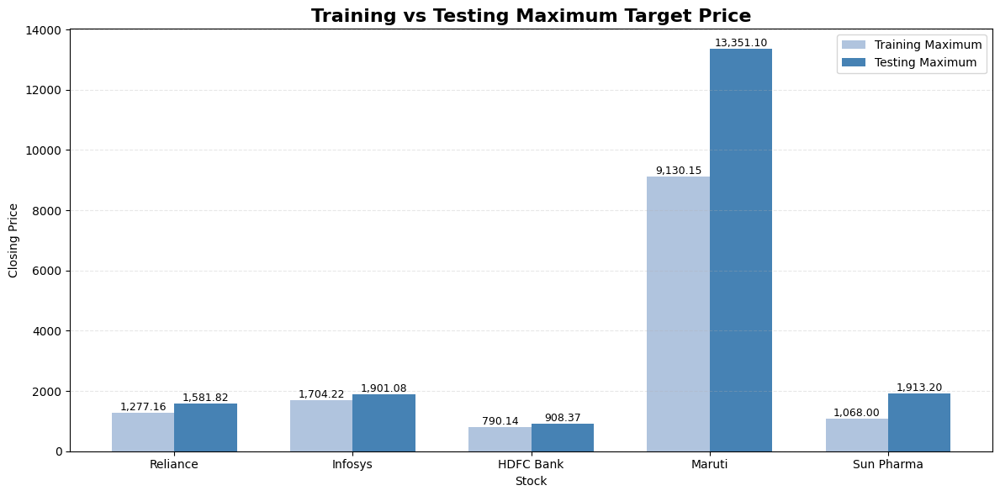

In [161]:
# ============================================================
# TRAINING MAX vs TESTING MAX TARGET PRICE
# WITH VALUES
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

stocks = target_range_df.index

train_max = target_range_df["Train Max"].values
test_max = target_range_df["Test Max"].values

x = np.arange(len(stocks))
width = 0.35

plt.figure(figsize=(12, 6))

bars1 = plt.bar(
    x - width / 2,
    train_max,
    width,
    label="Training Maximum",
    color="lightsteelblue"
)

bars2 = plt.bar(
    x + width / 2,
    test_max,
    width,
    label="Testing Maximum",
    color="steelblue"
)

plt.title(
    "Training vs Testing Maximum Target Price",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Stock")
plt.ylabel("Closing Price")

plt.xticks(
    x,
    stocks
)

plt.legend()

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.3
)

# Add values above bars
for bar in bars1:
    height = bar.get_height()

    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{height:,.2f}",
        ha="center",
        va="bottom",
        fontsize=9
    )

for bar in bars2:
    height = bar.get_height()

    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{height:,.2f}",
        ha="center",
        va="bottom",
        fontsize=9
    )

plt.tight_layout()
plt.show()

In [163]:
# ============================================================
# 27. LINEAR REGRESSION ERROR ANALYSIS
# ============================================================

lr_error_analysis = {}

for name in model_datasets:

    # Actual test target
    actual = np.array(
        y_test_datasets[name]
    ).flatten()

    # Linear Regression predictions
    predicted = np.array(
        lr_predictions[name]
    ).flatten()

    # Absolute error
    absolute_error = np.abs(
        actual - predicted
    )

    # Percentage error
    percentage_error = (
        absolute_error / np.abs(actual)
    ) * 100

    # Create error dataframe
    error_df = pd.DataFrame({
        "Actual": actual,
        "Predicted": predicted,
        "Absolute Error": absolute_error,
        "Percentage Error": percentage_error
    })

    # Use test dates as index
    error_df.index = X_test_datasets[name].index

    lr_error_analysis[name] = error_df


print("=" * 70)
print("LINEAR REGRESSION ERROR ANALYSIS CREATED")
print("=" * 70)

LINEAR REGRESSION ERROR ANALYSIS CREATED


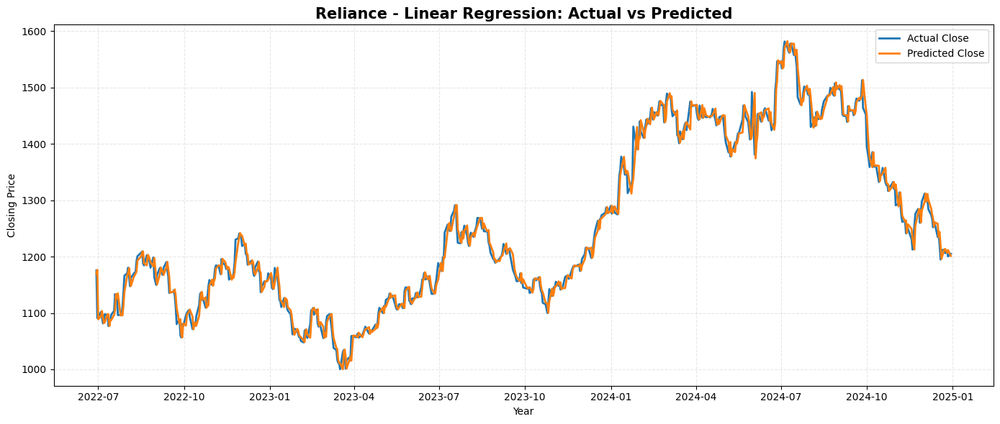

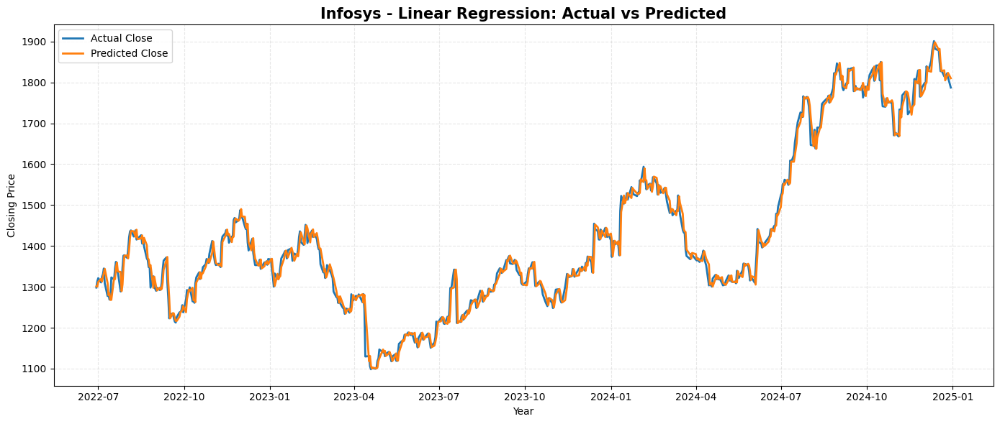

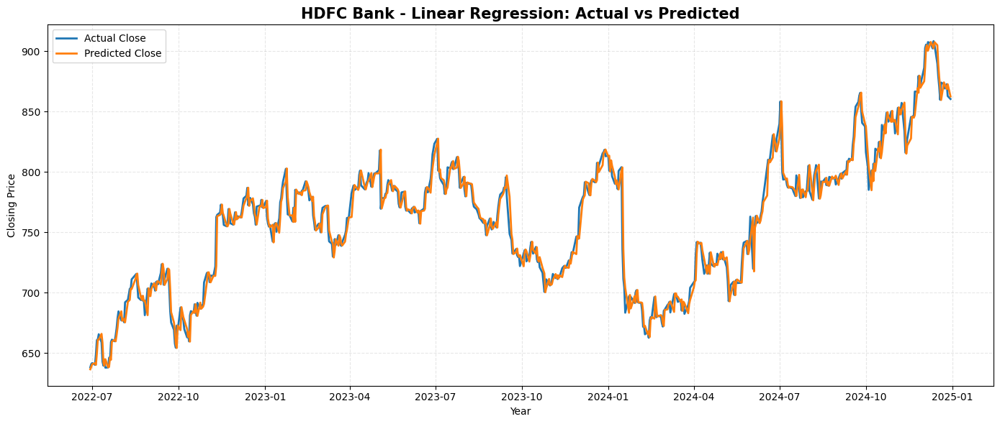

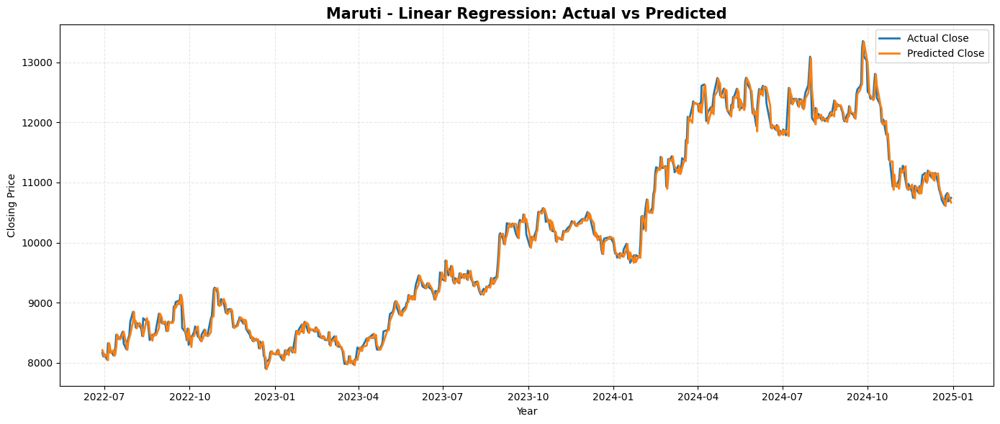

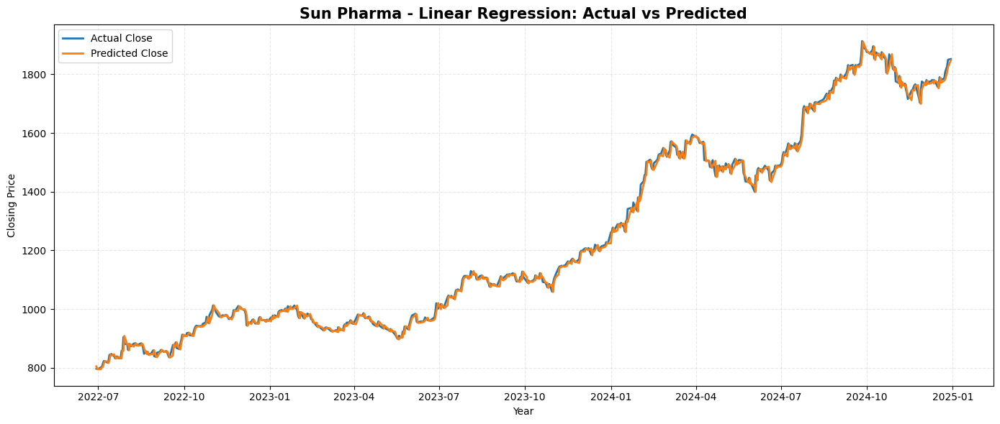

In [164]:
# ============================================================
# ACTUAL vs PREDICTED - LINEAR REGRESSION
# ============================================================

for name in model_datasets:

    error_df = lr_error_analysis[name]

    plt.figure(figsize=(14, 6))

    plt.plot(
        error_df.index,
        error_df["Actual"],
        label="Actual Close",
        linewidth=2
    )

    plt.plot(
        error_df.index,
        error_df["Predicted"],
        label="Predicted Close",
        linewidth=2
    )

    plt.title(
        f"{name} - Linear Regression: Actual vs Predicted",
        fontsize=15,
        fontweight="bold"
    )

    plt.xlabel("Year")
    plt.ylabel("Closing Price")

    plt.legend()

    plt.grid(
        linestyle="--",
        alpha=0.3
    )

    plt.tight_layout()
    plt.show()

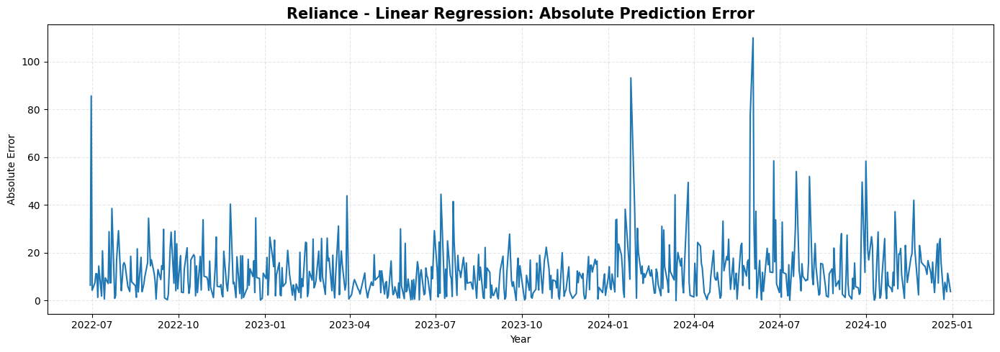

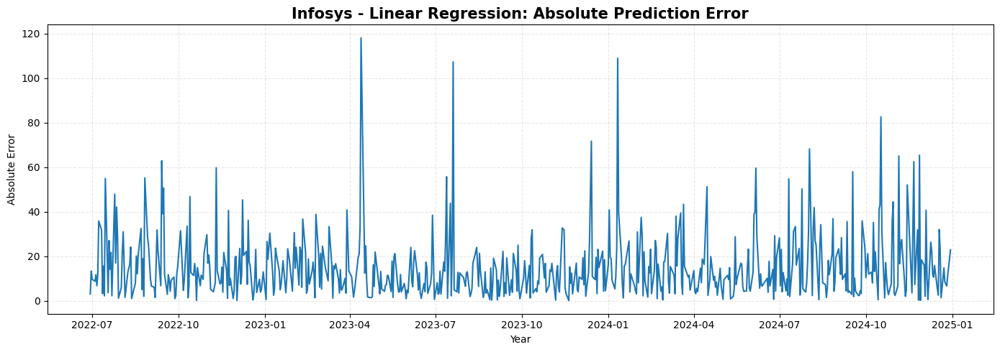

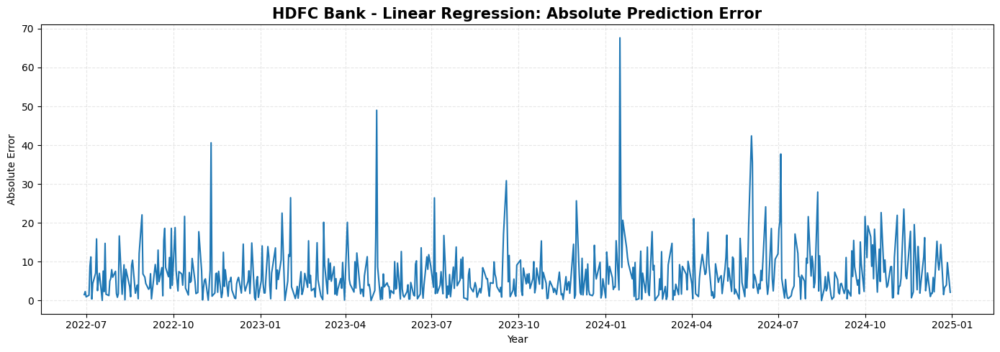

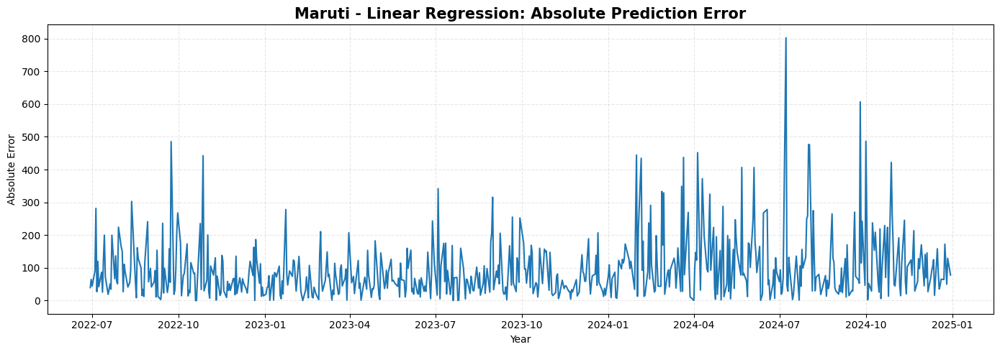

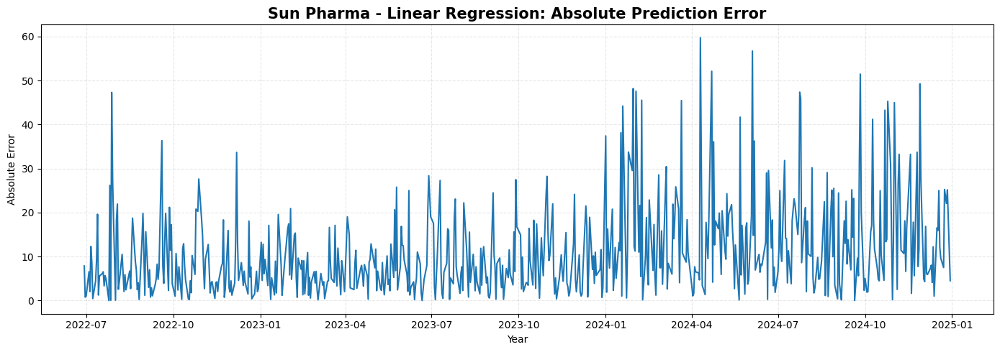

In [165]:
# ============================================================
# ABSOLUTE ERROR OVER TIME
# ============================================================

for name in model_datasets:

    error_df = lr_error_analysis[name]

    plt.figure(figsize=(14, 5))

    plt.plot(
        error_df.index,
        error_df["Absolute Error"],
        linewidth=1.5
    )

    plt.title(
        f"{name} - Linear Regression: Absolute Prediction Error",
        fontsize=15,
        fontweight="bold"
    )

    plt.xlabel("Year")
    plt.ylabel("Absolute Error")

    plt.grid(
        linestyle="--",
        alpha=0.3
    )

    plt.tight_layout()
    plt.show()

In [166]:
# ============================================================
# TOP 10 LARGEST PREDICTION ERRORS
# ============================================================

for name in model_datasets:

    error_df = lr_error_analysis[name]

    largest_errors = error_df.sort_values(
        by="Absolute Error",
        ascending=False
    ).head(10)

    print()
    print("=" * 85)
    print(f"{name} - TOP 10 LARGEST LINEAR REGRESSION ERRORS")
    print("=" * 85)

    display(
        largest_errors.style.format({
            "Actual": "{:.2f}",
            "Predicted": "{:.2f}",
            "Absolute Error": "{:.2f}",
            "Percentage Error": "{:.2f}%"
        })
    )


Reliance - TOP 10 LARGEST LINEAR REGRESSION ERRORS


,Actual,Predicted,Absolute Error,Percentage Error
date,,,,
2024-06-03 00:00:00,1380.63,1490.54,109.92,7.96%
2024-01-25 00:00:00,1430.80,1337.64,93.16,6.51%
2022-06-30 00:00:00,1090.94,1176.55,85.60,7.85%
2024-05-31 00:00:00,1492.33,1414.59,77.73,5.21%
2024-06-25 00:00:00,1495.98,1437.54,58.44,3.91%
2024-10-01 00:00:00,1394.93,1453.26,58.33,4.18%
2024-07-19 00:00:00,1482.79,1536.82,54.03,3.64%
2024-08-02 00:00:00,1430.08,1482.01,51.93,3.63%
2024-09-27 00:00:00,1463.93,1513.52,49.59,3.39%



Infosys - TOP 10 LARGEST LINEAR REGRESSION ERRORS


,Actual,Predicted,Absolute Error,Percentage Error
date,,,,
2023-04-13 00:00:00,1129.58,1247.70,118.12,10.46%
2024-01-11 00:00:00,1486.22,1377.31,108.91,7.33%
2023-07-20 00:00:00,1211.45,1318.73,107.28,8.86%
2024-10-17 00:00:00,1766.79,1849.41,82.62,4.68%
2023-12-14 00:00:00,1454.56,1382.88,71.68,4.93%
2024-08-02 00:00:00,1646.75,1714.92,68.17,4.14%
2024-11-27 00:00:00,1765.09,1830.43,65.35,3.70%
2024-11-05 00:00:00,1733.76,1668.78,64.98,3.75%
2022-09-13 00:00:00,1310.15,1373.03,62.88,4.80%



HDFC Bank - TOP 10 LARGEST LINEAR REGRESSION ERRORS


,Actual,Predicted,Absolute Error,Percentage Error
date,,,,
2024-01-16 00:00:00,736.10,803.75,67.65,9.19%
2023-05-04 00:00:00,769.48,818.49,49.01,6.37%
2024-06-03 00:00:00,719.78,762.18,42.40,5.89%
2022-11-10 00:00:00,762.62,721.99,40.63,5.33%
2024-07-04 00:00:00,799.83,837.57,37.74,4.72%
2024-06-04 00:00:00,753.10,717.60,35.50,4.71%
2023-09-18 00:00:00,748.65,779.52,30.87,4.12%
2024-08-12 00:00:00,778.04,805.99,27.95,3.59%
2023-02-02 00:00:00,785.17,758.68,26.49,3.37%



Maruti - TOP 10 LARGEST LINEAR REGRESSION ERRORS


,Actual,Predicted,Absolute Error,Percentage Error
date,,,,
2024-07-08 00:00:00,12571.60,11769.46,802.14,6.38%
2024-09-25 00:00:00,13240.49,12633.97,606.53,4.58%
2024-10-01 00:00:00,12511.93,12998.38,486.46,3.89%
2022-09-23 00:00:00,8577.84,9063.28,485.44,5.66%
2024-08-01 00:00:00,12590.13,13066.81,476.67,3.79%
2024-08-02 00:00:00,12070.21,12545.82,475.61,3.94%
2024-04-05 00:00:00,12608.26,12156.63,451.63,3.58%
2024-01-31 00:00:00,10425.57,9981.47,444.10,4.26%
2022-10-27 00:00:00,9216.31,8774.03,442.28,4.80%



Sun Pharma - TOP 10 LARGEST LINEAR REGRESSION ERRORS


,Actual,Predicted,Absolute Error,Percentage Error
date,,,,
2024-04-10 00:00:00,1507.16,1566.89,59.72,3.96%
2024-06-04 00:00:00,1455.59,1398.87,56.72,3.90%
2024-04-22 00:00:00,1452.99,1505.11,52.12,3.59%
2024-09-26 00:00:00,1913.20,1861.73,51.47,2.69%
2024-11-28 00:00:00,1748.45,1699.20,49.26,2.82%
2024-01-30 00:00:00,1380.34,1332.16,48.18,3.49%
2024-02-02 00:00:00,1424.47,1376.87,47.60,3.34%
2024-07-24 00:00:00,1635.45,1588.08,47.37,2.90%
2022-07-28 00:00:00,904.83,857.52,47.32,5.23%


In [167]:
# ============================================================
# ERROR DURING LARGE PRICE MOVEMENTS
# ============================================================

large_movement_analysis = {}

for name in model_datasets:

    error_df = lr_error_analysis[name].copy()

    # Absolute percentage movement in actual price
    error_df["Actual Price Change (%)"] = (
        error_df["Actual"].pct_change().abs() * 100
    )

    error_df = error_df.dropna()

    # Top 10% movements
    movement_threshold = (
        error_df["Actual Price Change (%)"].quantile(0.90)
    )

    error_df["Large Movement"] = (
        error_df["Actual Price Change (%)"]
        >= movement_threshold
    )

    large_movement_analysis[name] = error_df

    large_errors = error_df[
        error_df["Large Movement"]
    ]

    normal_errors = error_df[
        ~error_df["Large Movement"]
    ]

    print()
    print("=" * 75)
    print(f"{name} - ERROR DURING LARGE PRICE MOVEMENTS")
    print("=" * 75)

    print(
        f"Large movement threshold : "
        f"{movement_threshold:.2f}%"
    )

    print(
        f"Mean error - large movements : "
        f"{large_errors['Absolute Error'].mean():.2f}"
    )

    print(
        f"Mean error - normal movements : "
        f"{normal_errors['Absolute Error'].mean():.2f}"
    )


Reliance - ERROR DURING LARGE PRICE MOVEMENTS
Large movement threshold : 1.96%
Mean error - large movements : 36.80
Mean error - normal movements : 9.18

Infosys - ERROR DURING LARGE PRICE MOVEMENTS
Large movement threshold : 2.20%
Mean error - large movements : 47.63
Mean error - normal movements : 11.41

HDFC Bank - ERROR DURING LARGE PRICE MOVEMENTS
Large movement threshold : 1.92%
Mean error - large movements : 21.54
Mean error - normal movements : 4.98

Maruti - ERROR DURING LARGE PRICE MOVEMENTS
Large movement threshold : 1.95%
Mean error - large movements : 302.83
Mean error - normal movements : 71.17

Sun Pharma - ERROR DURING LARGE PRICE MOVEMENTS
Large movement threshold : 1.85%
Mean error - large movements : 32.34
Mean error - normal movements : 8.49


In [168]:
# ============================================================
# FINAL LINEAR REGRESSION ERROR ANALYSIS SUMMARY
# ============================================================

error_summary = []

for name in model_datasets:

    error_df = large_movement_analysis[name]

    large_errors = error_df[
        error_df["Large Movement"]
    ]

    normal_errors = error_df[
        ~error_df["Large Movement"]
    ]

    error_summary.append({
        "Stock": name,
        "Mean Absolute Error":
            error_df["Absolute Error"].mean(),

        "Maximum Absolute Error":
            error_df["Absolute Error"].max(),

        "Large Movement Threshold (%)":
            error_df["Actual Price Change (%)"].quantile(0.90),

        "Error During Large Movements":
            large_errors["Absolute Error"].mean(),

        "Error During Normal Movements":
            normal_errors["Absolute Error"].mean()
    })


lr_error_summary_df = pd.DataFrame(
    error_summary
).set_index("Stock")


display(
    lr_error_summary_df.style.format({
        "Mean Absolute Error": "{:.2f}",
        "Maximum Absolute Error": "{:.2f}",
        "Large Movement Threshold (%)": "{:.2f}%",
        "Error During Large Movements": "{:.2f}",
        "Error During Normal Movements": "{:.2f}"
    })
)

,Mean Absolute Error,Maximum Absolute Error,Large Movement Threshold (%),Error During Large Movements,Error During Normal Movements
Stock,,,,,
Reliance,11.96,109.92,1.96%,36.80,9.18
Infosys,15.06,118.12,2.20%,47.63,11.41
HDFC Bank,6.65,67.65,1.92%,21.54,4.98
Maruti,94.48,802.14,1.95%,302.83,71.17
Sun Pharma,10.89,59.72,1.85%,32.34,8.49


In [169]:
print("Features used by the models:")
print(features)

Features used by the models:
['open', 'high', 'low', 'close', 'volume']


# 28. Final Next-Day Price Prediction

In [173]:
# ============================================================
# 28. FINAL NEXT-DAY STOCK PRICE PREDICTION
# ============================================================

import numpy as np
import pandas as pd

# Select stock
stock = "HDFC Bank"  

print(f"NEXT-DAY CLOSING PRICE PREDICTION - {stock}")

# ------------------------------------------------------------
# Enter latest OHLCV values
# ------------------------------------------------------------

open_price = float(input("Enter Open price: "))
high_price = float(input("Enter High price: "))
low_price = float(input("Enter Low price: "))
close_price = float(input("Enter Close price: "))
volume = float(input("Enter Volume: "))

# ------------------------------------------------------------
# Create input dataframe
# ------------------------------------------------------------

new_data = pd.DataFrame(
    [[
        open_price,
        high_price,
        low_price,
        close_price,
        volume
    ]],
    columns=features
)

# ------------------------------------------------------------
# SAME scaler fitted on training data
# ------------------------------------------------------------

new_data_scaled = scalers[stock].transform(
    new_data
)

# Convert back to DataFrame
new_data_scaled = pd.DataFrame(
    new_data_scaled,
    columns=features
)

# ------------------------------------------------------------
# Predict next-day closing price
# ------------------------------------------------------------

predicted_price = lr_models[stock].predict(
    new_data_scaled
)[0]

# ------------------------------------------------------------
# Display result
# ------------------------------------------------------------

print()
print("PREDICTION RESULT")
print()

print(
    f"Current Closing Price : ₹{close_price:,.2f}"
)

print(
    f"Predicted Next-Day Closing Price : "
    f"₹{predicted_price:,.2f}"
)


NEXT-DAY CLOSING PRICE PREDICTION - HDFC Bank

PREDICTION RESULT

Current Closing Price : ₹891.38
Predicted Next-Day Closing Price : ₹891.11


c:\Users\SAI\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2742: UserWarning: X has feature names, but LinearRegression was fitted without feature names
  warnings.warn(
